In [16]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import helpers
import numpy as np

**Note**: For 2019 we only have information until september.

**Note**: Our data is only english language, so there can be a little bias to sports that are played by english speaking countries.

In [17]:
df_channels = pd.read_csv('df_channels_en.tsv', sep='\t')
df_channels

,category_cc,join_date,channel,name_cc,subscribers_cc,videos_cc,subscriber_rank_sb,weights
0,Gaming,2010-04-29,UC-lHJZR3Gqxm24_Vd_AJ5Yw,PewDiePie,101000000,3956,3.0,2.0870
1,Education,2006-09-01,UCbCmjCuTUZos6Inko4u57UQ,Cocomelon - Nursery ...,60100000,458,7.0,2.0870
2,Entertainment,2006-09-20,UCpEhnqL0y41EpW2TvWAHD7Q,SET India,56018869,32661,8.0,2.0870
3,Howto & Style,2016-11-15,UC295-Dw_tDNtZXFeAPAW6Aw,5-Minute Crafts,60600000,3591,9.0,2.0870
4,Sports,2007-05-11,UCJ5v_MCY6GNUBTO8-D3XoAg,WWE,48400000,43421,11.0,2.0870
...,...,...,...,...,...,...,...,...
136465,Music,2016-10-06,UCuM-9AajUOwKw6ipOzu2DRQ,GONE.Fludd - Topic,10128,105,1008139.0,53.1435
136466,People & Blogs,2013-10-17,UCtW9jp5TH0YrgYpwiRf9t-Q,saidthestory,10100,352,1008644.0,53.1435
136467,Gaming,2015-05-08,UCTsxFTIUs8vFDzGccDm6i7Q,Omni H,10000,475,1009505.0,53.1435
136468,Music,2011-04-13,UC1HOArgRCMGPjlcmkThERwA,TĀLĀ,10000,15,1025119.0,53.1435


In [18]:
df = pd.read_csv('df_timeseries_en.tsv', sep='\t')
df

,channel,category,datetime,views,delta_views,subs,delta_subs,videos,delta_videos,activity
0,UCBJuEqXfXTdcPSbGO9qqn1g,Film and Animation,2017-07-03 00:00:00,2.024946e+05,0.000000,650.222222,0.000000,5,0,3
1,UCBJuEqXfXTdcPSbGO9qqn1g,Film and Animation,2017-07-10 00:00:00,3.940857e+05,191591.111111,1046.000000,395.777778,6,1,1
2,UCBJuEqXfXTdcPSbGO9qqn1g,Film and Animation,2017-07-17 00:00:00,8.353938e+05,441308.083333,1501.500000,455.500000,6,0,1
3,UCBJuEqXfXTdcPSbGO9qqn1g,Film and Animation,2017-07-24 00:00:00,1.104577e+06,269183.250000,1750.000000,248.500000,6,0,0
4,UCBJuEqXfXTdcPSbGO9qqn1g,Film and Animation,2017-07-31 00:00:00,1.284406e+06,179828.600000,2008.300000,258.300000,6,0,0
...,...,...,...,...,...,...,...,...,...,...
18872494,UC0UeVA9YHpOEr_Ng442xiRw,Gaming,2019-09-02 00:00:00,6.012938e+06,232418.277778,61268.611111,1305.611111,278,2,10
18872495,UC0UeVA9YHpOEr_Ng442xiRw,Gaming,2019-09-09 00:00:00,6.244579e+06,231640.888889,62631.666667,1363.055556,287,9,13
18872496,UC0UeVA9YHpOEr_Ng442xiRw,Gaming,2019-09-16 00:00:00,6.480902e+06,236322.933333,64010.000000,1378.333333,294,7,16
18872497,UC0UeVA9YHpOEr_Ng442xiRw,Gaming,2019-09-23 00:00:00,6.745317e+06,264415.200000,65480.000000,1470.000000,301,7,15


In [19]:
# Merge df with df_channels on the 'channel' column
df = df.merge(df_channels[['channel', 'name_cc']], on='channel', how='left')

# Display the updated dataframe
df.head()

,channel,category,datetime,views,delta_views,subs,delta_subs,videos,delta_videos,activity,name_cc
0,UCBJuEqXfXTdcPSbGO9qqn1g,Film and Animation,2017-07-03 00:00:00,2.024946e+05,0.000000,650.222222,0.000000,5,0,3,MagnusNation
1,UCBJuEqXfXTdcPSbGO9qqn1g,Film and Animation,2017-07-10 00:00:00,3.940857e+05,191591.111111,1046.000000,395.777778,6,1,1,MagnusNation
2,UCBJuEqXfXTdcPSbGO9qqn1g,Film and Animation,2017-07-17 00:00:00,8.353938e+05,441308.083333,1501.500000,455.500000,6,0,1,MagnusNation
3,UCBJuEqXfXTdcPSbGO9qqn1g,Film and Animation,2017-07-24 00:00:00,1.104577e+06,269183.250000,1750.000000,248.500000,6,0,0,MagnusNation
4,UCBJuEqXfXTdcPSbGO9qqn1g,Film and Animation,2017-07-31 00:00:00,1.284406e+06,179828.600000,2008.300000,258.300000,6,0,0,MagnusNation


In [20]:
df['datetime'] = pd.to_datetime(df['datetime'])
df['year'] = df['datetime'].dt.year
df['month'] = df['datetime'].dt.month
df['day'] = df['datetime'].dt.day
df['week'] = df['datetime'].dt.isocalendar().week

# sort values by date
df.sort_values(by='datetime', inplace=True)
df.reset_index(drop=True, inplace=True)

In [6]:
df["category"].unique()

array(['Gaming', 'Howto & Style', 'Film and Animation', 'Entertainment',
       'People & Blogs', 'Education', 'Music', nan, 'Autos & Vehicles',
       'Sports', 'Comedy', 'Pets & Animals', 'News & Politics',
       'Science & Technology', 'Nonprofits & Activism', 'Travel & Events'],
      dtype=object)

# General analysis

## Dataset overview

In [116]:
df.isna().sum()

channel             0
category        20584
datetime            0
views               0
delta_views         0
subs                0
delta_subs          0
videos              0
delta_videos        0
activity            0
name_cc          1405
year                0
month               0
day                 0
week                0
dtype: int64

In [115]:
df.describe()

,datetime,views,delta_views,subs,delta_subs,videos,delta_videos,activity,year,month,day,week
count,18872499,1.887250e+07,1.887250e+07,1.887250e+07,1.887250e+07,1.887250e+07,1.887250e+07,1.887250e+07,1.887250e+07,1.887250e+07,1.887250e+07,18872499.0
mean,2018-04-03 00:21:49.005850624,4.515185e+07,3.818116e+05,1.527369e+05,1.312787e+03,4.140162e+02,2.210536e+00,4.916308e+00,2.017750e+03,6.568168e+00,1.553968e+01,26.996999
min,2015-01-05 00:00:00,1.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.015000e+03,1.000000e+00,1.000000e+00,1.0
25%,2017-07-03 00:00:00,1.330733e+06,9.197109e+03,9.033000e+03,3.375000e+01,4.100000e+01,0.000000e+00,0.000000e+00,2.017000e+03,4.000000e+00,8.000000e+00,15.0
50%,2018-04-23 00:00:00,4.665598e+06,3.356228e+04,2.090667e+04,1.247250e+02,1.220000e+02,0.000000e+00,1.000000e+00,2.018000e+03,7.000000e+00,1.600000e+01,28.0
75%,2019-01-20 23:00:00,1.628815e+07,1.309393e+05,7.057127e+04,5.147500e+02,3.340000e+02,2.000000e+00,4.000000e+00,2.019000e+03,9.000000e+00,2.300000e+01,39.0
max,2019-09-30 01:00:00,8.411483e+10,6.659719e+09,1.125714e+08,2.061360e+07,1.418270e+05,3.158000e+04,3.159700e+04,2.019000e+03,1.200000e+01,3.100000e+01,53.0
std,NaN,3.633229e+08,4.062719e+06,8.073176e+05,1.864629e+04,1.439843e+03,1.469852e+01,2.998487e+01,9.715631e-01,3.334631e+00,8.787540e+00,14.537957


### Check gap dates in the dataset (see the frequency of the dataset)

In [344]:
print(f"First day in dataset: {df['datetime'].min()}")
print(f"Last day in dataset: {df['datetime'].max()}")

First day in dataset: 2015-01-05 00:00:00
Last day in dataset: 2019-09-30 01:00:00


In [ ]:
from datetime import datetime, timedelta

# Calculate the difference between consecutive rows in the datetime index by days
df_days_analysis = df["datetime"].copy().sort_values()
df_days_analysis = df_days_analysis.dt.floor('D').groupby(df_days_analysis.dt.floor('D')).first()

deltas = df_days_analysis.dt.floor('D').diff()

# Filter diffs
gaps = deltas[deltas > timedelta(days=1)]

# Print results
print(f'{len(gaps)} gaps with average gap duration: {gaps.mean()}')

print("Unique gaps:", gaps.value_counts())

print("Total amount of dates:", df_days_analysis.nunique())

247 gaps with average gap duration: 6 days 15:38:37.408906882
Unique gaps: datetime
7 days    161
6 days     86
Name: count, dtype: int64
Total amount of dates: 334


**We have to first check the amount of channels that have information for each day, because if not we are having different information for each day (and if there some channels that don't have any information at all for those days, then we can do like a scaling, where we divide the sum of e.g delta_views by the amount of channels that have information for that day or maybe adding the mean to the missing dates?).**

### Correlation matrix

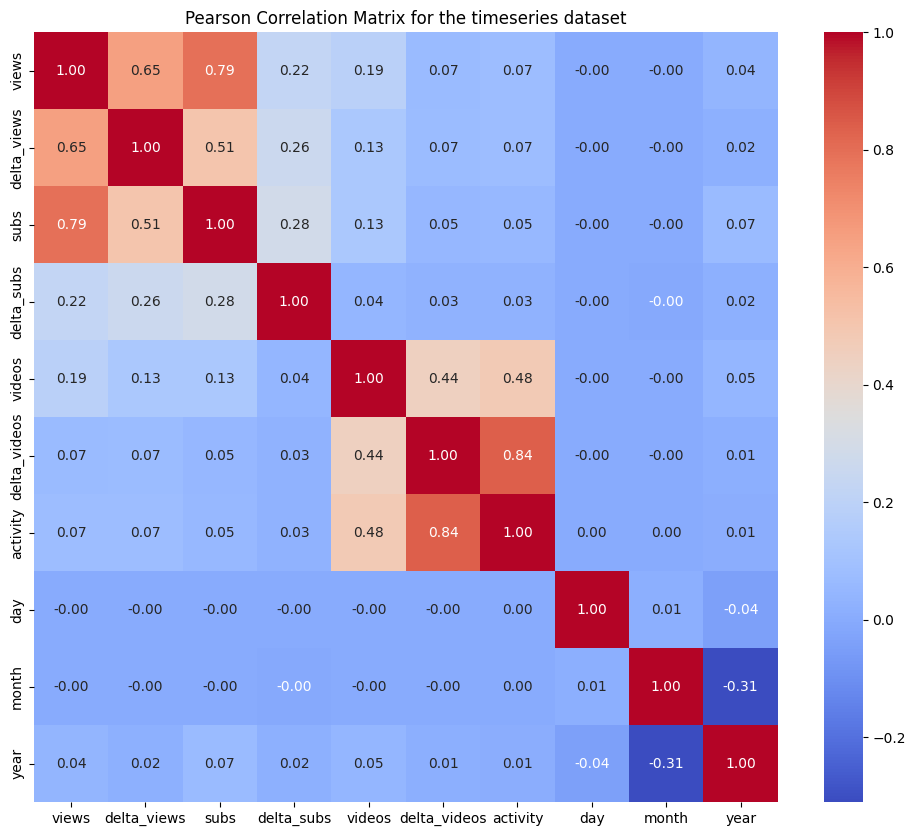

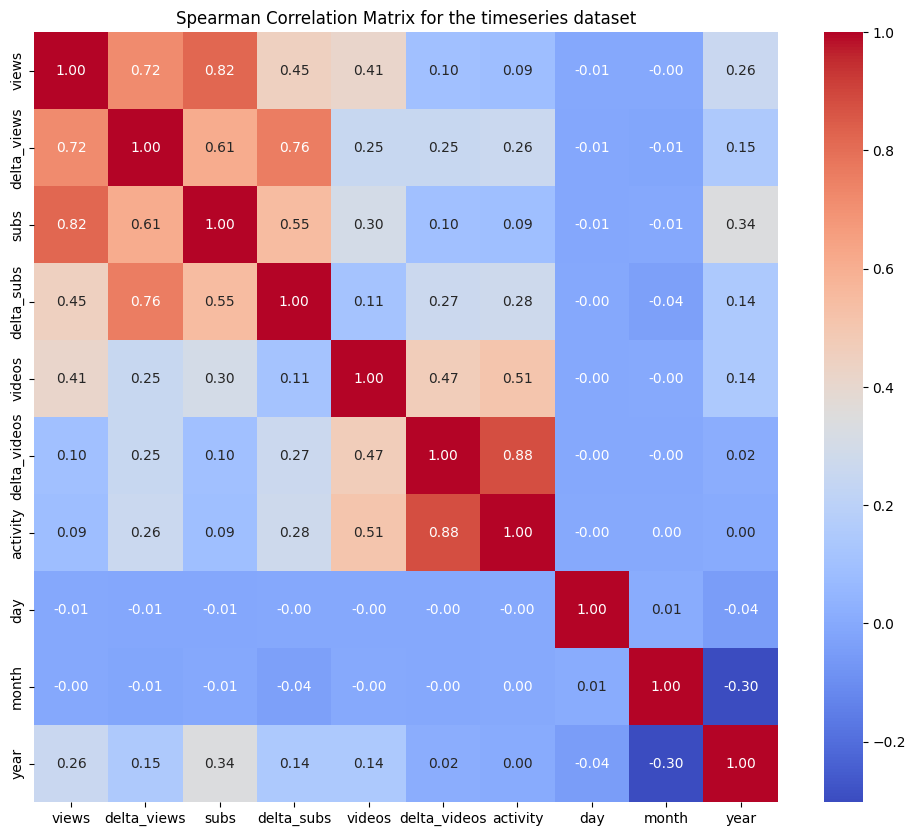

In [350]:
# Calculate the correlation matrix
correlation_dataset = df[['views', 'delta_views', 'subs', 'delta_subs', 'videos', 'delta_videos', 'activity', 'day', 'month', 'year']]

pearson_correlation = correlation_dataset.corr(method='pearson')

plt.figure(figsize=(12, 10))
sns.heatmap(pearson_correlation, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Pearson Correlation Matrix for the timeseries dataset')
plt.show()

spearman_correlation = correlation_dataset.corr(method='spearman')

plt.figure(figsize=(12, 10))
sns.heatmap(spearman_correlation, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Spearman Correlation Matrix for the timeseries dataset')
plt.show()

### Box plots

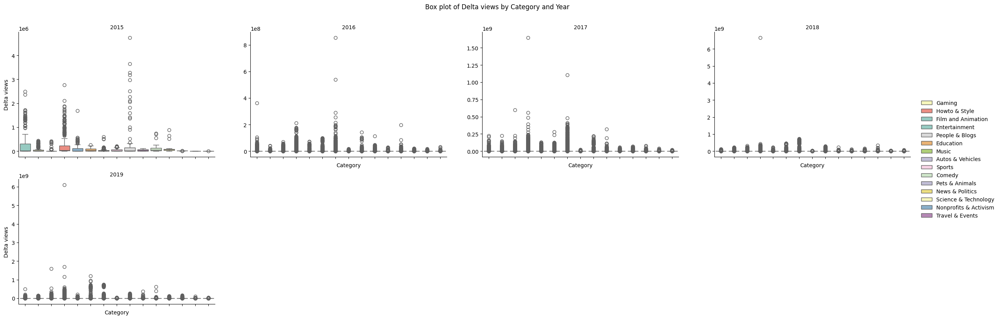

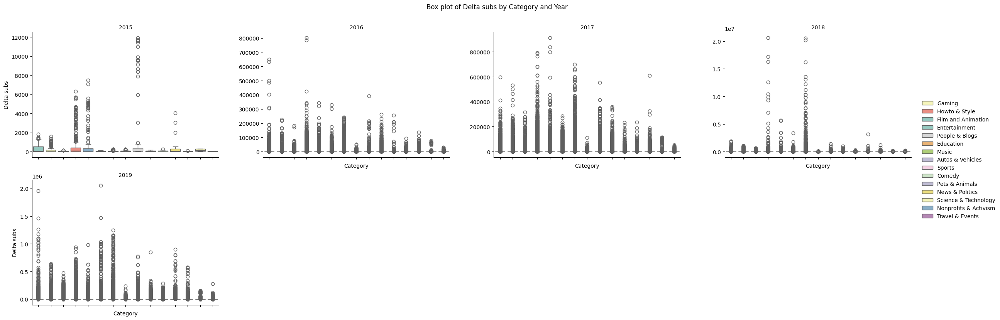

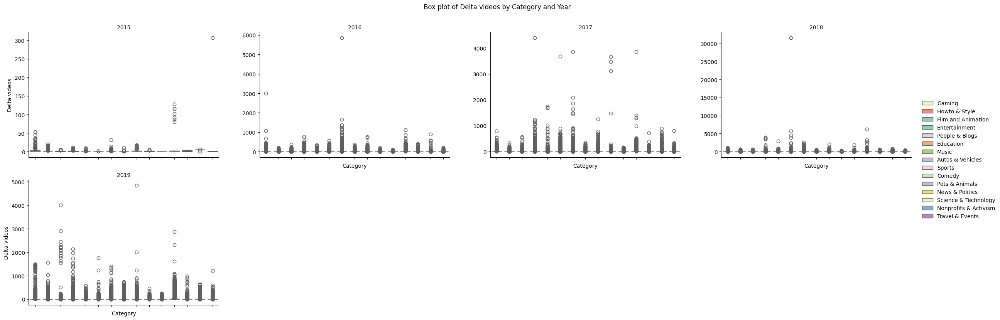

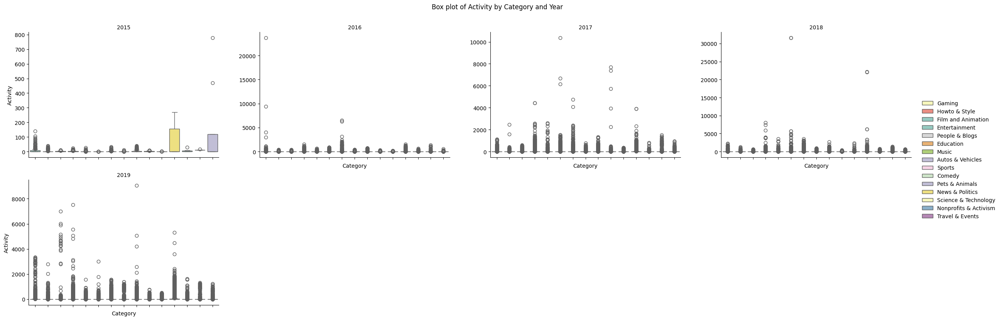

In [15]:
columns = ['delta_views', 'delta_subs', 'delta_videos', 'activity']

for col in columns:
    g = sns.FacetGrid(df, col="year", col_wrap=4, height=4, aspect=1.5, sharey=False)
    g.map_dataframe(sns.boxplot, x='category', y=col, hue="category", palette="Set3")
    g.set_titles("{col_name}")
    g.set_xticklabels(rotation=90)
    g.set_axis_labels("Category", col.replace("_", " ").capitalize())
    g.add_legend()
    g.figure.suptitle(f'Box plot of {col.replace("_", " ").capitalize()} by Category and Year', y=1.05)
    plt.show()


## Plot whole timeline

In [100]:
def plot_whole_timeline(df, x_column):
    # Create a new column that combines year and month
    df['year_month'] = df['year'].astype(
        str) + '-' + df['month'].astype(str).str.zfill(2)

    # Group by the new 'year_month' column and sum the view counts
    year_month_view_count = df.groupby(
        'year_month')[x_column].sum().reset_index()

    # Plot the data
    plt.figure(figsize=(40, 12))
    plt.plot(year_month_view_count['year_month'],
             year_month_view_count[x_column], marker='o')
    plt.title(f'{x_column} Increment Throughout the Years and Months')
    plt.xlabel('Year-Month')
    plt.ylabel(x_column)
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.show()

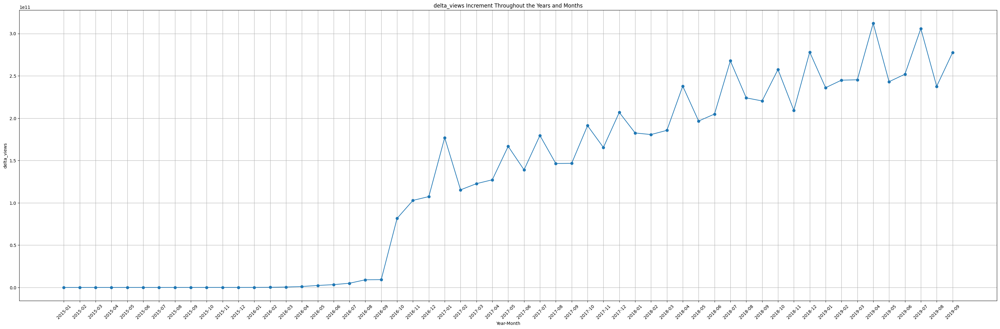

In [8]:
plot_whole_timeline(df, 'delta_views')

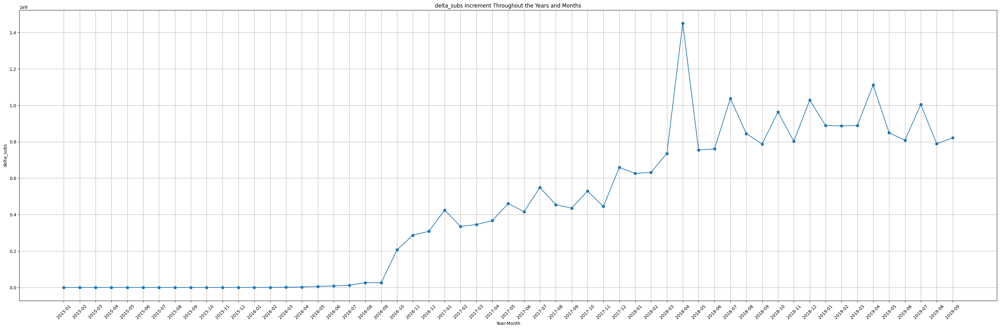

In [9]:
plot_whole_timeline(df, 'delta_subs')

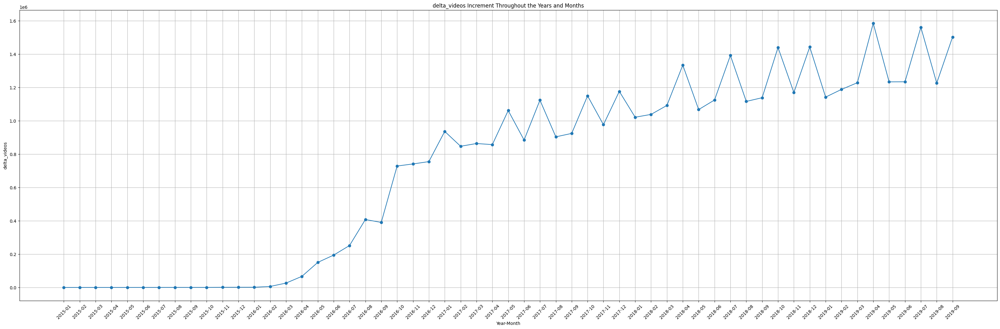

In [9]:
plot_whole_timeline(df, 'delta_videos')

In [11]:
# what happened in April 2018?
april_2018_df = df[(df['year'] == 2018) & (df['month'] == 4)]

# Sort by delta_subs and select the top 10 channels
top_10_channels = april_2018_df.sort_values(by='delta_subs', ascending=False).head(10)

# Display the result
top_10_channels[['channel', 'name_cc', 'delta_subs']]

,channel,name_cc,delta_subs
9449214,UCqECaJ8Gagnn7YCbPEzWH6g,Taylor Swift,2.053974e+07
9298382,UCb2HGwORFBo94DmRx4oLzow,One Direction,2.022094e+07
9066637,UCYvmuw-JtVrTZQ-7Y4kd63Q,Katy Perry,1.630648e+07
9194415,UCfM3zsQsOnfWNUppiycmBuw,EminemMusic,1.618966e+07
9160228,UCBVjMGOIkavEAhyqpxJ73Dw,Maroon 5,1.353673e+07
9384693,UC9CoOnJkIBMdeijd9qYoT_g,Ariana Grande,1.306811e+07
9053658,UCIwFjwMjI0y7PDBVEO9-bkQ,Justin Bieber,1.255091e+07
9173088,UCIjYyZxkFucP_W-tmXg_9Ow,Calvin Harris,1.122115e+07
9018686,UCcgqSM4YEo5vVQpqwN-MaNw,Rihanna,1.042501e+07
9126396,UC3jOd7GUMhpgJRBhiLzuLsg,Nicki Minaj,1.032050e+07


## Pie chart general info

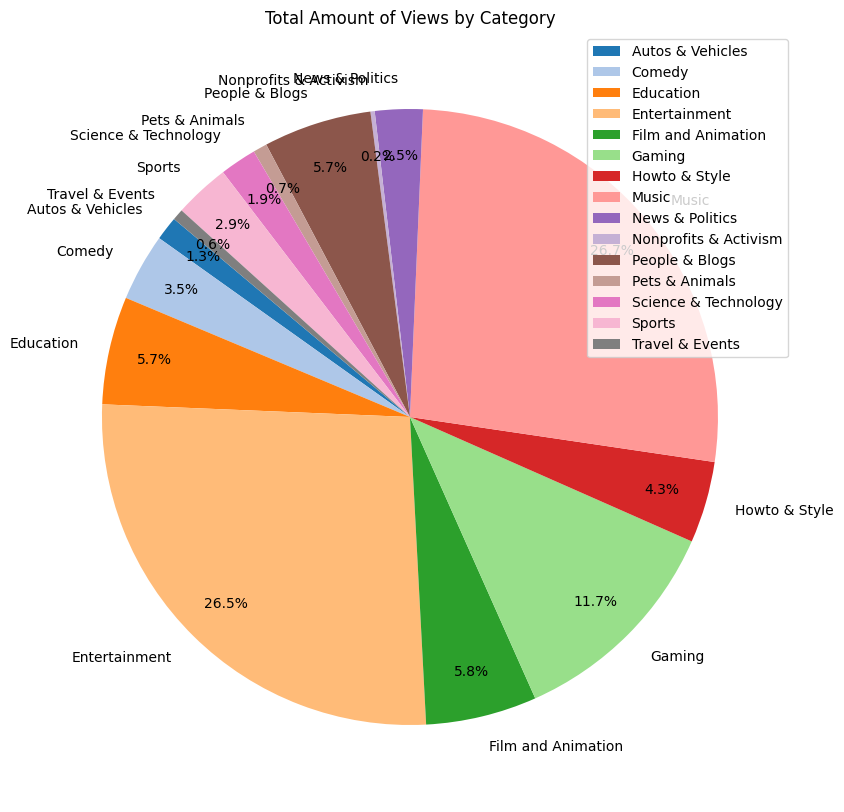

In [12]:
# Grab the last views value for each channel
last_views_df = df.sort_values('datetime').groupby('channel').tail(1) # because each channel has the total amount of views info in each video

# Group by category and sum the views
category_views = last_views_df.groupby('category')['views'].sum()

# Plot
plt.figure(figsize=(10, 10))
category_views_df = category_views.reset_index()
category_views_df.columns = ['category', 'views']
sns.set_palette('tab20')
plt.pie(category_views_df['views'], labels=category_views_df['category'], autopct='%1.1f%%', startangle=140, pctdistance=0.85)
plt.title('Total Amount of Views by Category')
plt.ylabel('')
plt.legend()
plt.show()

In [98]:
def pie_chart(df, top_n, x_column, y_column):
    # Grab the last views value for each channel
    last_views_df = df.sort_values('datetime').groupby(x_column).tail(1)

    channel_views = last_views_df.groupby(x_column)[y_column].sum()

    # Select the top N channels
    top_channels = channel_views.nlargest(top_n)

    # Plot
    top_channels_df = top_channels.reset_index()
    top_channels_df.columns = [x_column, y_column]
    plt.figure(figsize=(10, 10))
    plt.pie(top_channels_df[y_column] / 1_000_000, labels=top_channels_df[x_column], autopct=lambda p: f'{p:.1f}%\n({p*top_channels_df[y_column].sum()/100/1_000_000:.1f}M)', startangle=140, pctdistance=0.85)
    plt.title(f'Total Amount of {y_column} by Top {top_n} {x_column}')
    plt.ylabel('')
    plt.legend()
    plt.show()

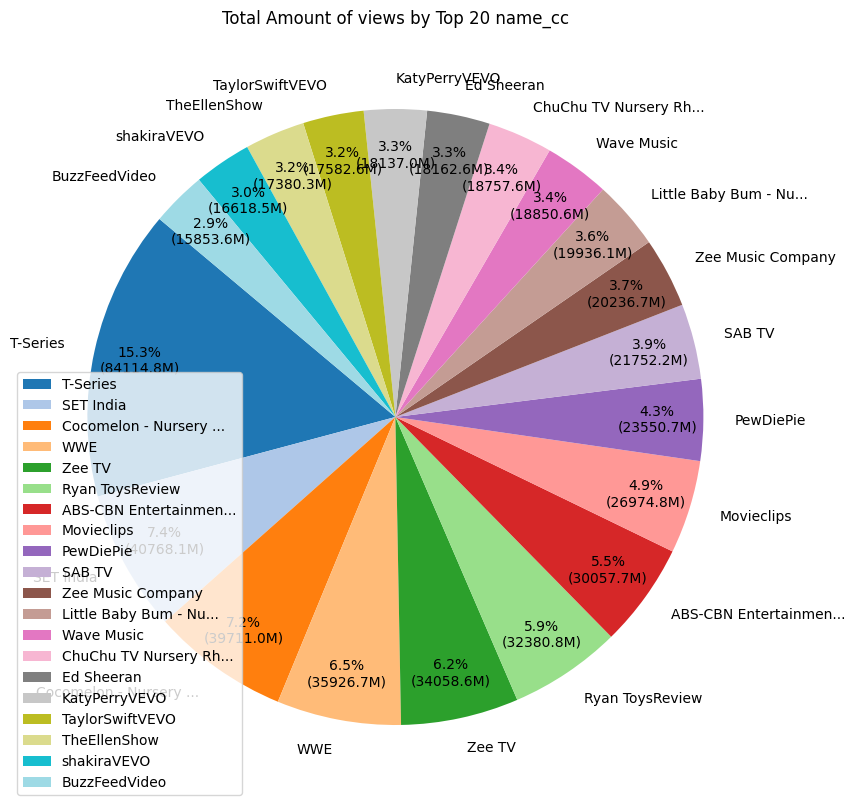

In [14]:
pie_chart(df, 20, 'name_cc', 'views')

The categories with most amount of views are:
- Music
- Entertainment
- Gaming
- Film & Animation
- Howto & Style
- Education
- Comedy
- Sports

## Seasonal analysis

In [52]:
df_seasonal = df.copy()[['datetime', 'delta_views', 'delta_subs', 'delta_videos']]
df_seasonal.set_index('datetime', inplace=True)
df_seasonal = df_seasonal.groupby(df_seasonal.index.date).sum()
df_seasonal.sort_index(inplace=True)
df_seasonal.index = pd.to_datetime(df_seasonal.index)

In [70]:
df_seasonal

,delta_views,delta_subs,delta_videos
2015-01-05,0.000000e+00,0.000000e+00,0
2015-01-12,9.585280e+05,7.572250e+02,5
2015-01-19,2.244557e+06,3.672278e+03,2
2015-01-26,3.037340e+06,3.118589e+03,6
2015-02-02,2.844401e+06,3.153633e+03,8
...,...,...,...
2019-09-02,5.953994e+10,1.964966e+08,308080
2019-09-09,5.728625e+10,1.854070e+08,319564
2019-09-16,5.860837e+10,1.610858e+08,318292
2019-09-23,5.914767e+10,1.524982e+08,322002


In [53]:
from datetime import datetime, timedelta

deltas = df_seasonal.index.to_series().diff()

# Filter diffs
gaps = deltas[deltas > timedelta(days=1)]

# Print results
print(f'{len(gaps)} gaps with average gap duration: {gaps.mean()}')

print("Unique gaps:", gaps.value_counts())

print("Total amount of dates:", df_seasonal.index.nunique())

247 gaps with average gap duration: 6 days 15:38:37.408906882
Unique gaps: 7 days    161
6 days     86
Name: count, dtype: int64
Total amount of dates: 334


**Majority of data is weekly but there are some exemptions (6 days), so we will do a resampling to weekly data.**

In [108]:
# We do a resampling because our dataset is not perfectly weekly, there are some error values that are daily or every 6 days
df_seasonal = df_seasonal.resample('W').mean(
)
    
df_seasonal.index.to_series().diff().dt.days.value_counts()

7.0    247
Name: count, dtype: int64

In [101]:
from statsmodels.tsa.seasonal import seasonal_decompose

def plot_decomposition(df_seasonal, y_column, weekly_period=13):
    # by default quarterly seasonality is assumed

    decompose_result_mult = seasonal_decompose(df_seasonal[y_column], model="additive", period=weekly_period)
    decompose_result_mult.plot()
    plt.show()

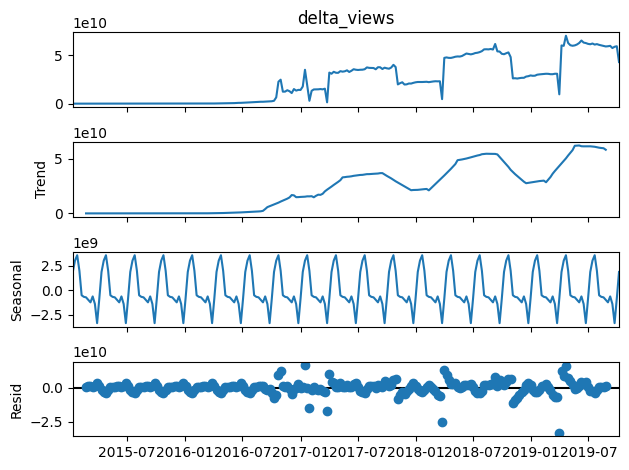

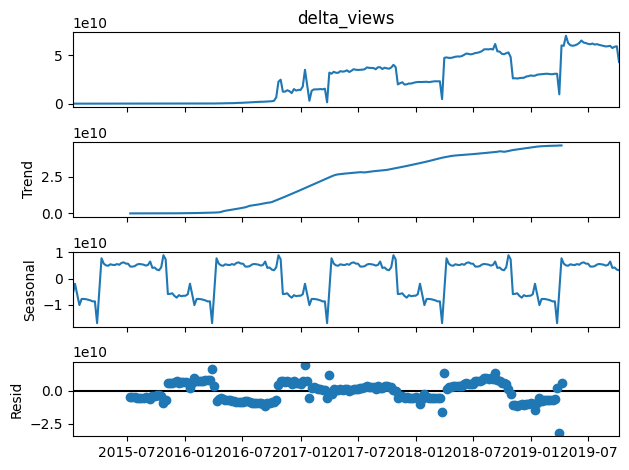

In [110]:
plot_decomposition(df_seasonal, 'delta_views')
plot_decomposition(df_seasonal, 'delta_views', weekly_period=52)

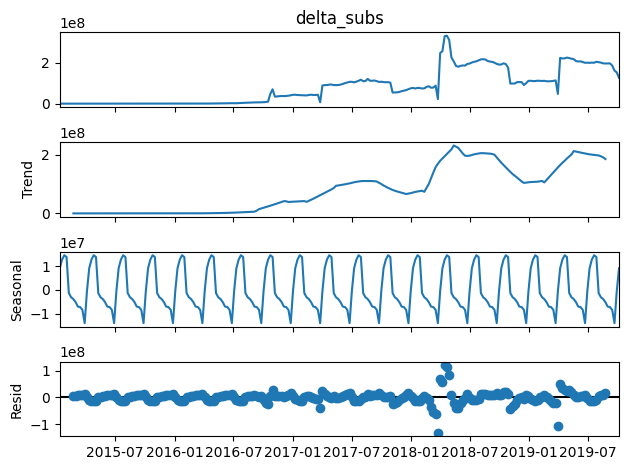

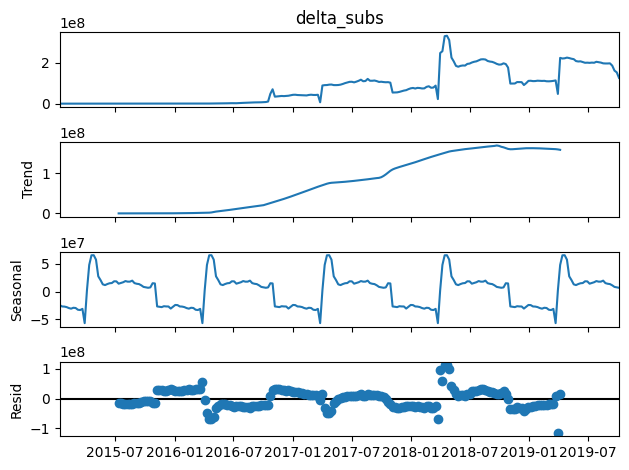

In [111]:
plot_decomposition(df_seasonal, 'delta_subs')
plot_decomposition(df_seasonal, 'delta_subs', weekly_period=52)

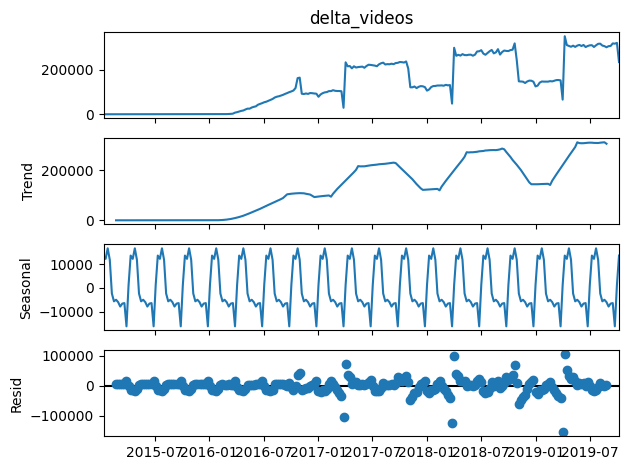

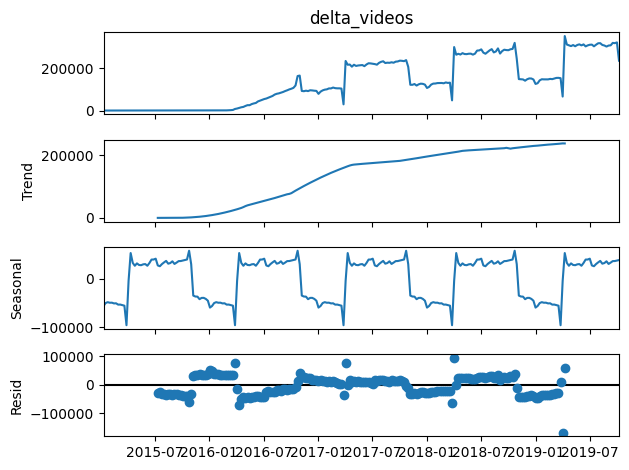

In [114]:
plot_decomposition(df_seasonal, 'delta_videos')
plot_decomposition(df_seasonal, 'delta_videos', weekly_period=52)

We have an upward trend and we have quarterly and yearly seasonlities in the dataset.

# Sport analysis

In [55]:
sport_df_orig = df[df['category'] == 'Sports']

In [56]:
sport_df = sport_df_orig.copy()
sport_df.sort_values(by='datetime', inplace=True)
sport_df.reset_index(drop=True, inplace=True)

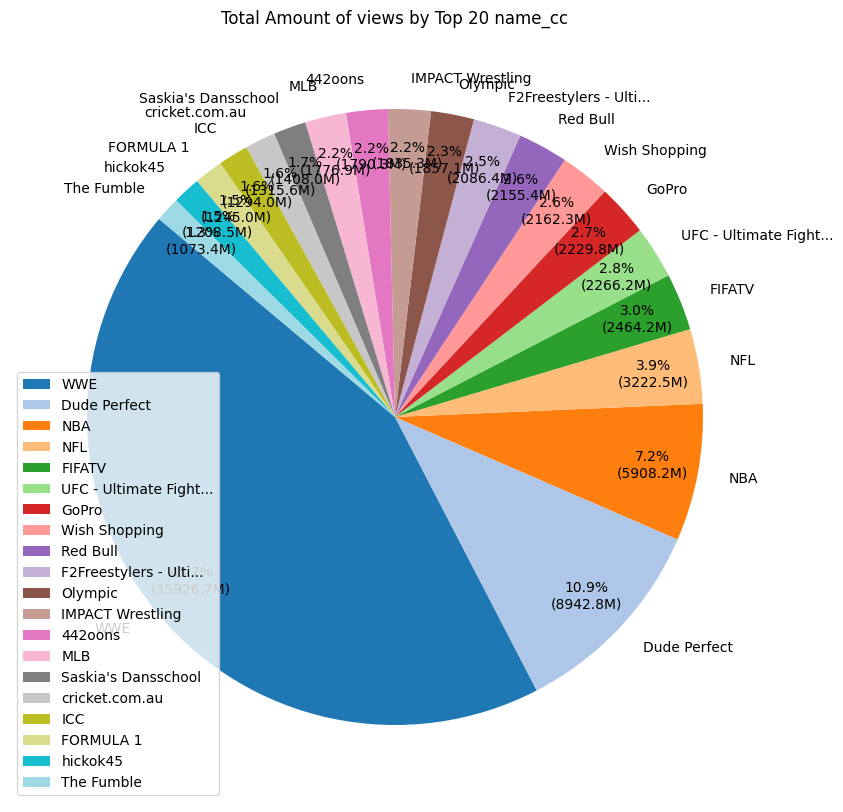

In [17]:
pie_chart(sport_df, 20, 'name_cc', 'views')

The biggest sport channels are:
- WWE
- Dude Perfect
- NBA
- NFL
- Fifa TV
- UFC

## Plot whole timeline

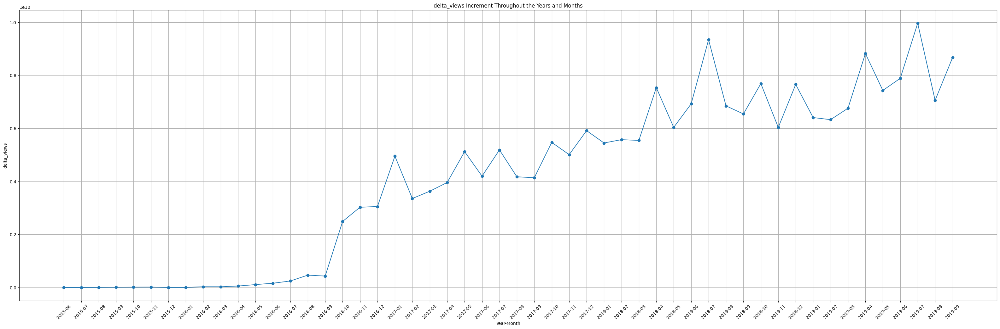

In [18]:
plot_whole_timeline(sport_df, "delta_views")

We always have majority of times peaks on the 4th, 7th and 12th month

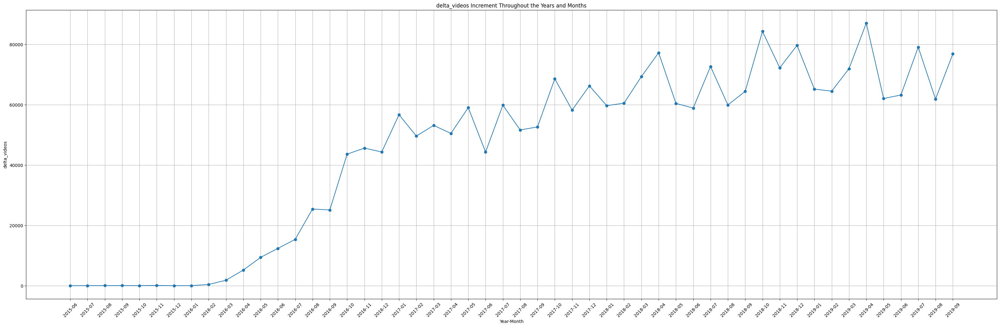

In [19]:
plot_whole_timeline(sport_df, "delta_videos")


Majority of times we have peaks on the 4th, 7th 10th and 12th month

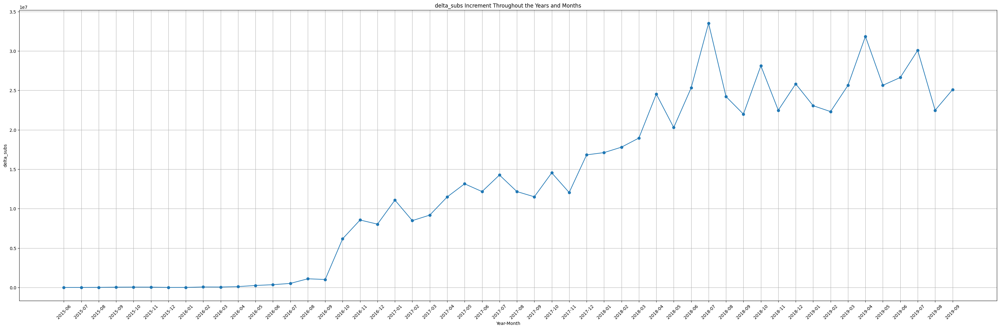

In [20]:
plot_whole_timeline(sport_df, "delta_subs")

Majority of times we have peaks on the 4th, 7th 10th and 12th month

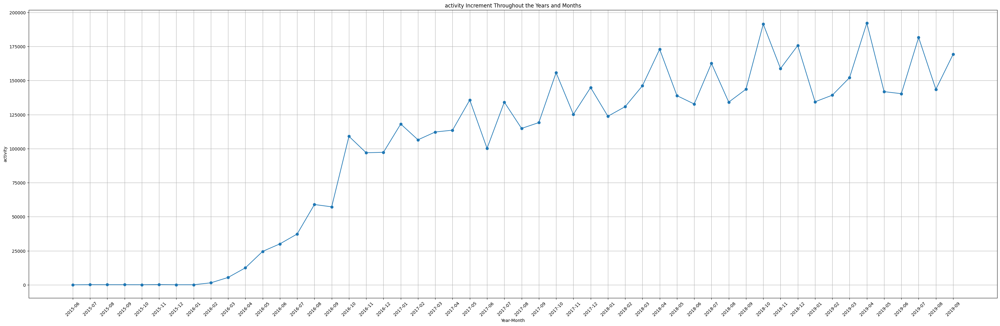

In [21]:
plot_whole_timeline(sport_df, "activity")

## Plot yearly information

In [106]:
def bar_plot_date(df, x_column, y_column):
    # Group by year and sum the delta_views
    date_delta_views = sport_df.groupby(x_column)[y_column].sum().reset_index()

    # Plot the bar chart
    plt.figure(figsize=(12, 6))
    plt.bar(date_delta_views[x_column], date_delta_views[y_column], color='skyblue')
    plt.title(f'{x_column} {y_column}')
    plt.xlabel(x_column)
    plt.ylabel(y_column)
    plt.xticks(date_delta_views[x_column])
    plt.grid(axis='y')
    plt.show()

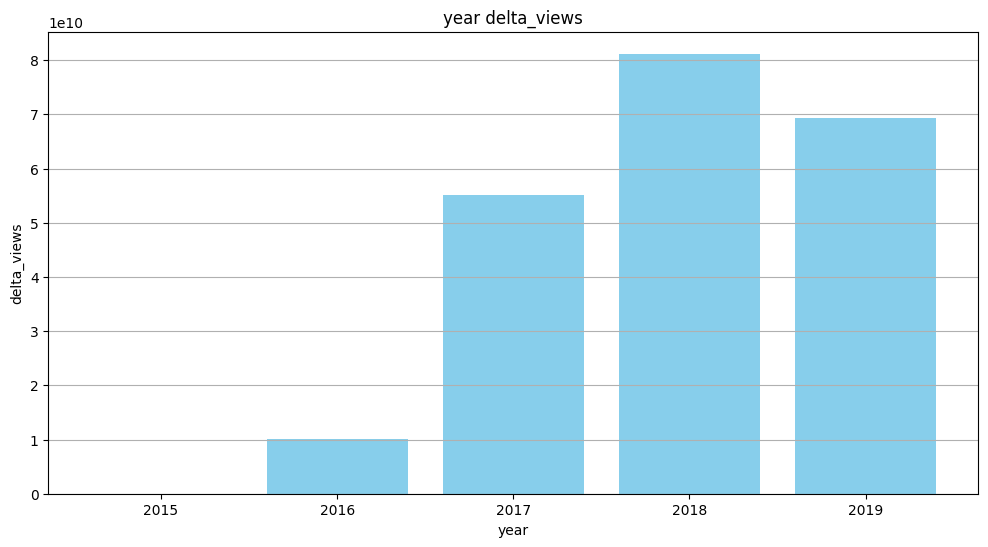

In [23]:
bar_plot_date(sport_df, 'year', 'delta_views')

In [24]:
sport_df.groupby('year')['delta_views'].sum()

year
2015    4.080618e+07
2016    1.008232e+10
2017    5.510963e+10
2018    8.118722e+10
2019    6.932615e+10
Name: delta_views, dtype: float64

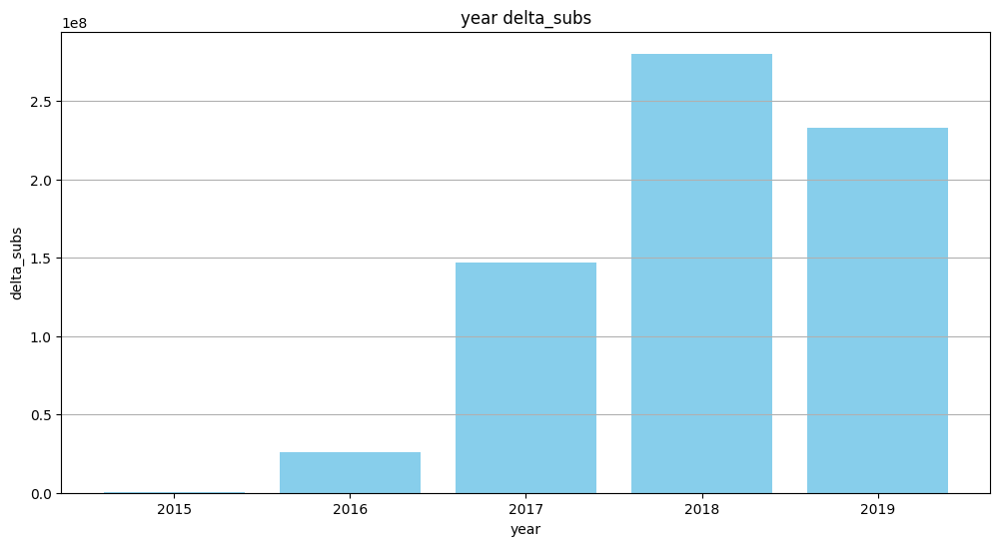

In [25]:
bar_plot_date(sport_df, 'year', 'delta_subs')

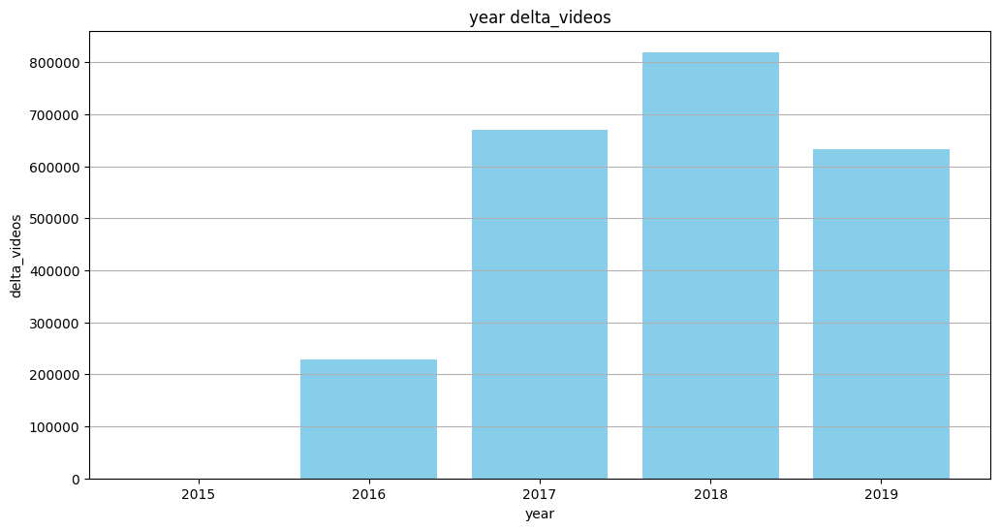

In [26]:
bar_plot_date(sport_df, 'year', 'delta_videos')

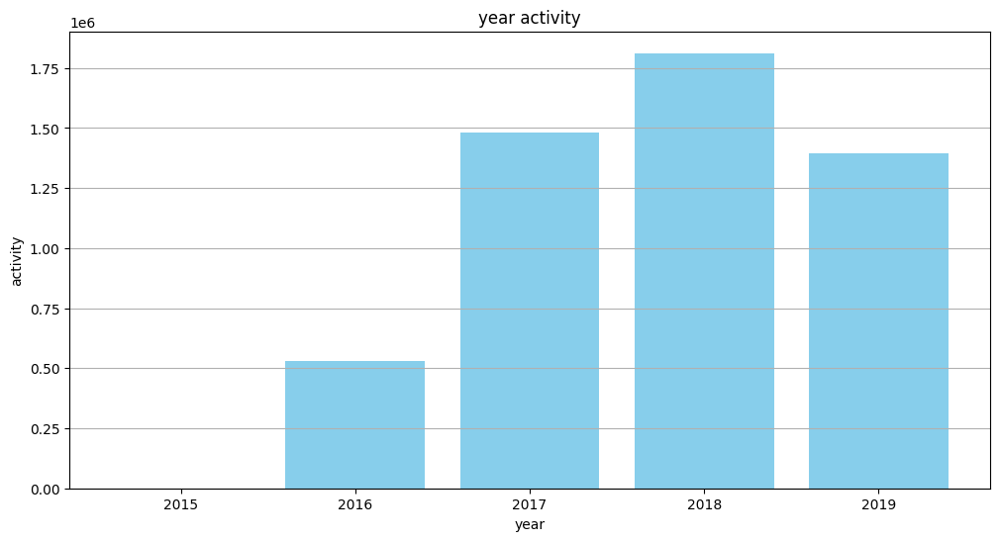

In [27]:
bar_plot_date(sport_df, 'year', 'activity')

## Plot monthly and daily information by year

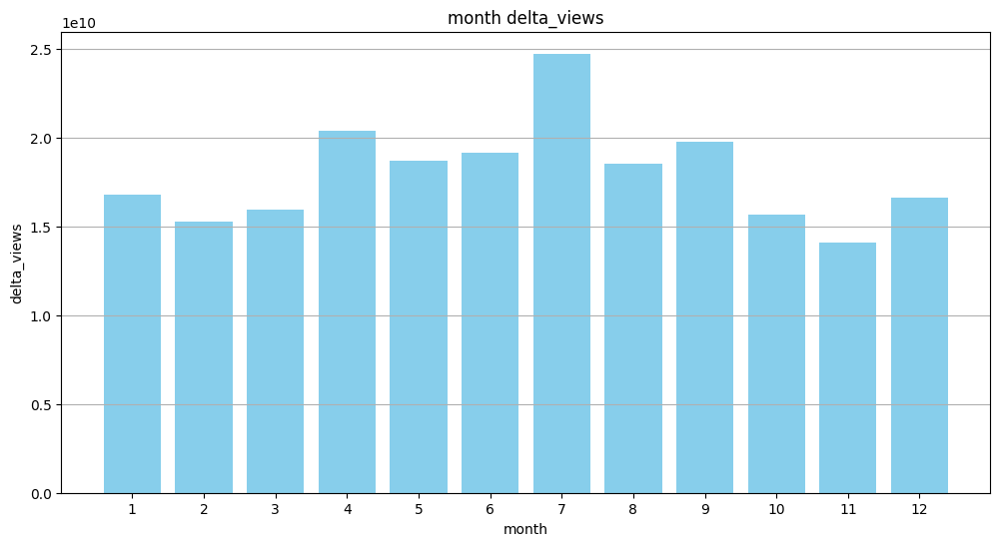

In [28]:
bar_plot_date(sport_df, 'month', 'delta_views')

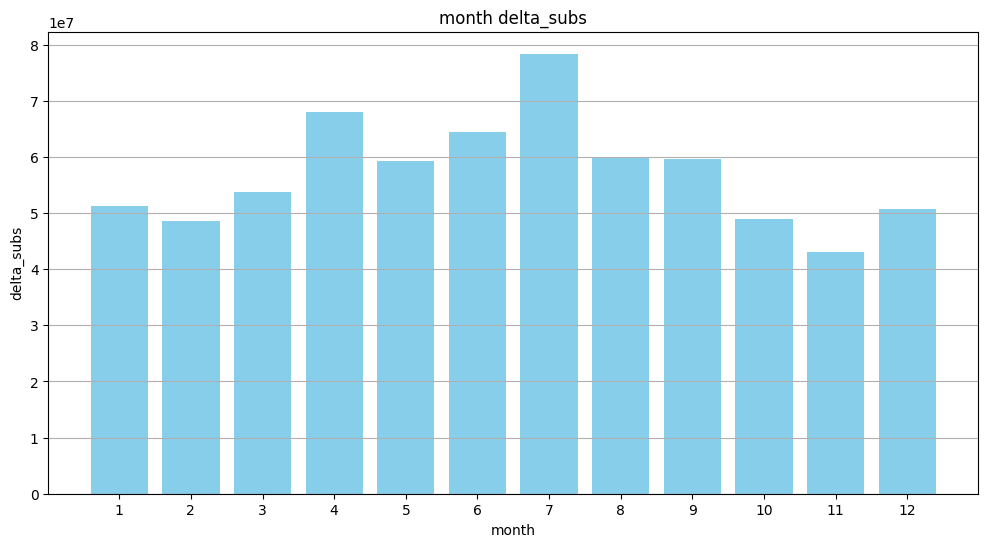

In [29]:
bar_plot_date(sport_df, 'month', 'delta_subs')

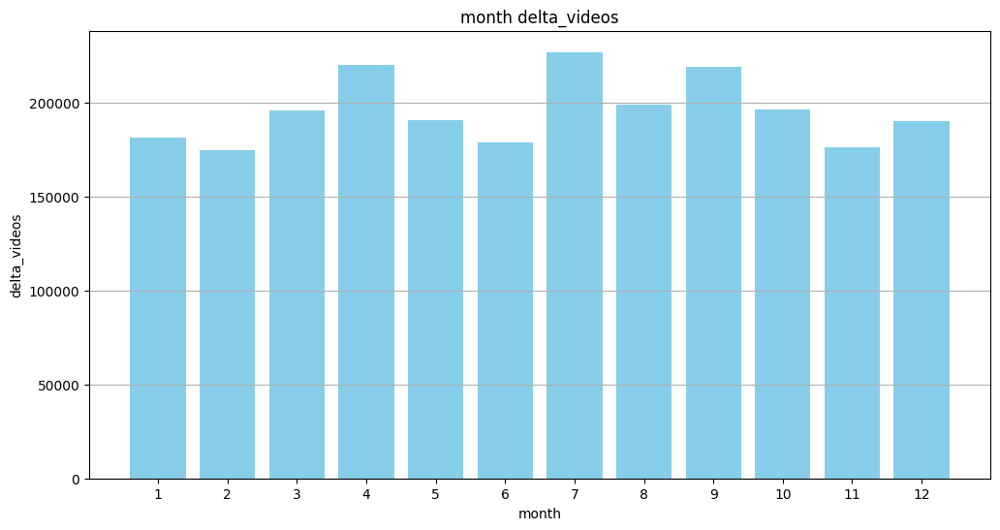

In [30]:
bar_plot_date(sport_df, 'month', 'delta_videos')

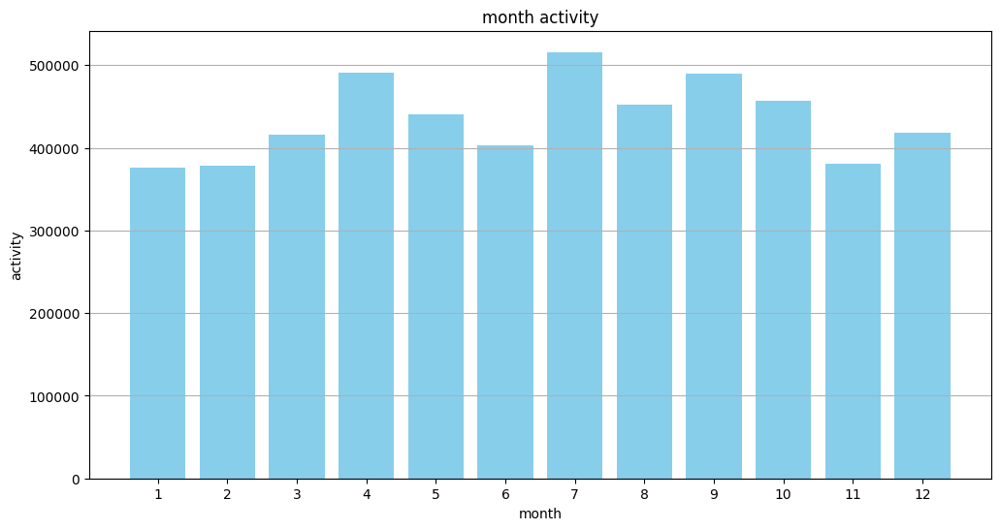

In [31]:
bar_plot_date(sport_df, 'month', 'activity')

It seems we get a repeated pattern for each feature, where in the 7th month everything peaks

In [107]:
def graph_groupby_time(df, x_column):
    grouped_df = df.groupby(['year', 'month', 'week'])[
        x_column].sum().reset_index()

    # Pivot the table to have years as columns and months/weeks as rows
    pivot_df = grouped_df.pivot_table(
        index=['month', 'week'], columns='year', values=x_column, fill_value=0)

    pivot_df.plot(kind='line', figsize=(15, 8))
    plt.title(f'{x_column} by Year, Month, and Week')
    plt.xlabel('Month and Week')
    plt.ylabel(x_column)
    plt.legend(title='Year')
    plt.show()

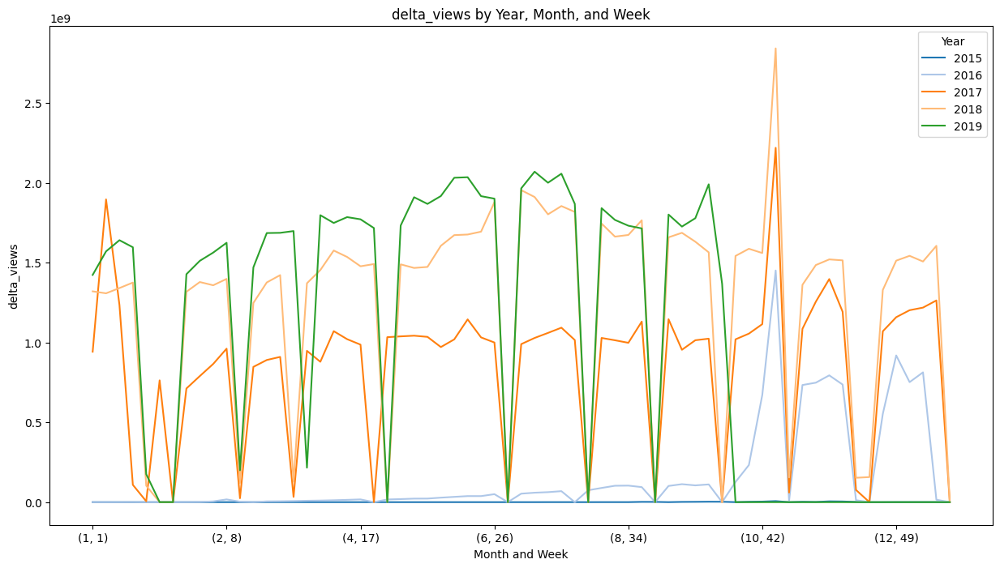

In [33]:
graph_groupby_time(sport_df, 'delta_views')

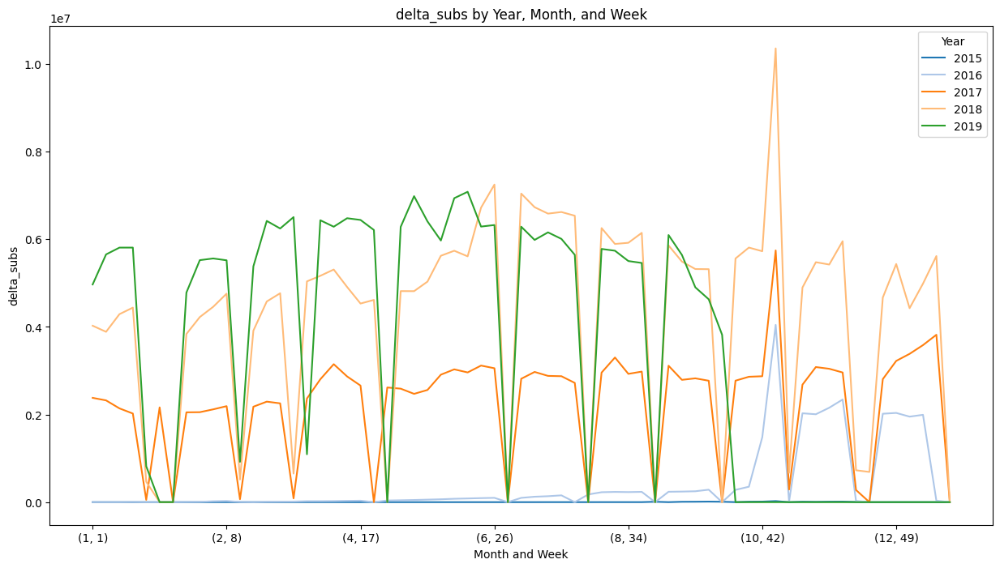

In [34]:
graph_groupby_time(sport_df, 'delta_subs')

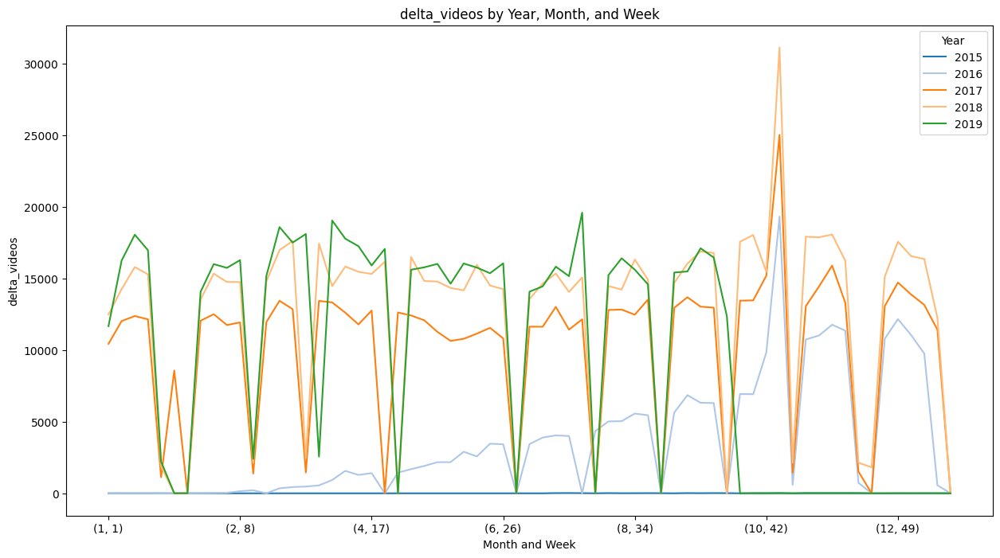

In [35]:
graph_groupby_time(sport_df, 'delta_videos')

In [108]:
def graph_plot_time(df, date_type="month", x_column="delta_views", years=None):
    if years is not None:
        df = df[df['year'].isin(years)]
    
    time_data = df.groupby(['year', date_type])[x_column].sum().reset_index()

    # Create a pivot table to have years as columns and months as rows
    pivot_data = time_data.pivot(index=date_type, columns='year', values=x_column).fillna(0)

    # Plot the data
    pivot_data.plot(kind='line', figsize=(15, 8))
    plt.title(f'{x_column} by {date_type} for Each Year')
    plt.xlabel(f'{date_type.capitalize()}')
    plt.ylabel(x_column)
    plt.xticks(rotation=0)
    plt.legend(title='Year')
    # plt.yscale('log')
    plt.grid(axis='y')
    plt.show()

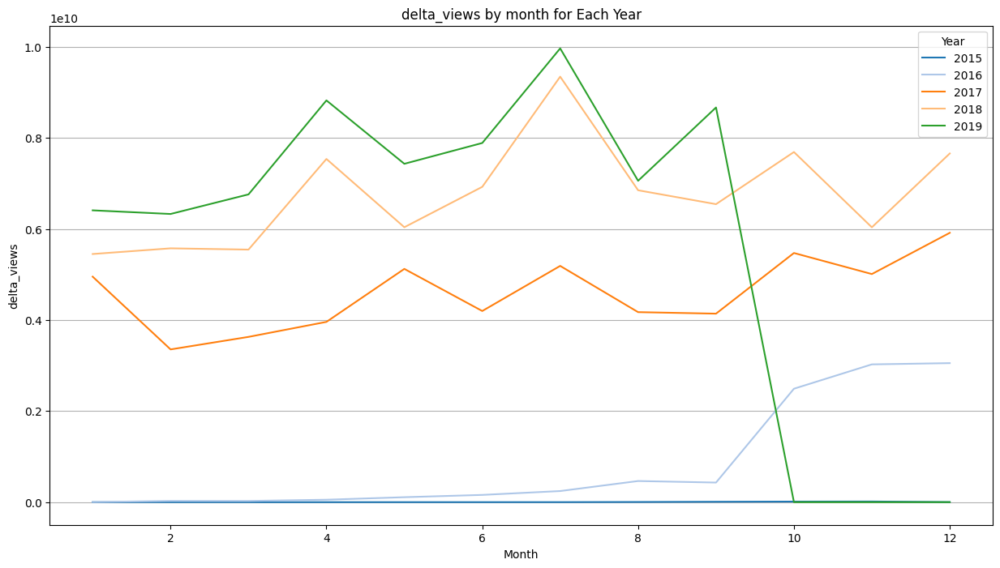

In [37]:
graph_plot_time(sport_df, "month", "delta_views")

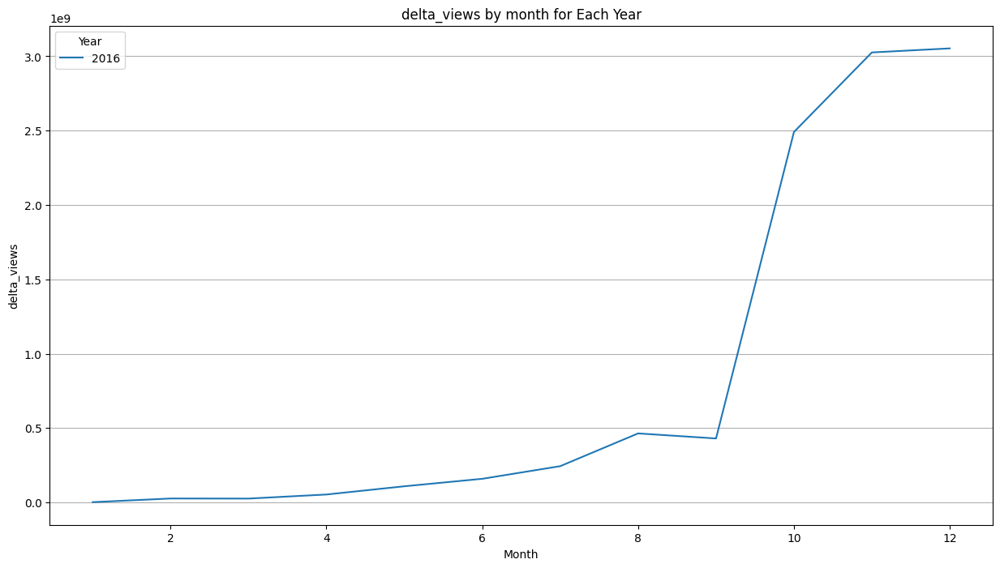

In [38]:
graph_plot_time(sport_df, "month", "delta_views", years=[2016])

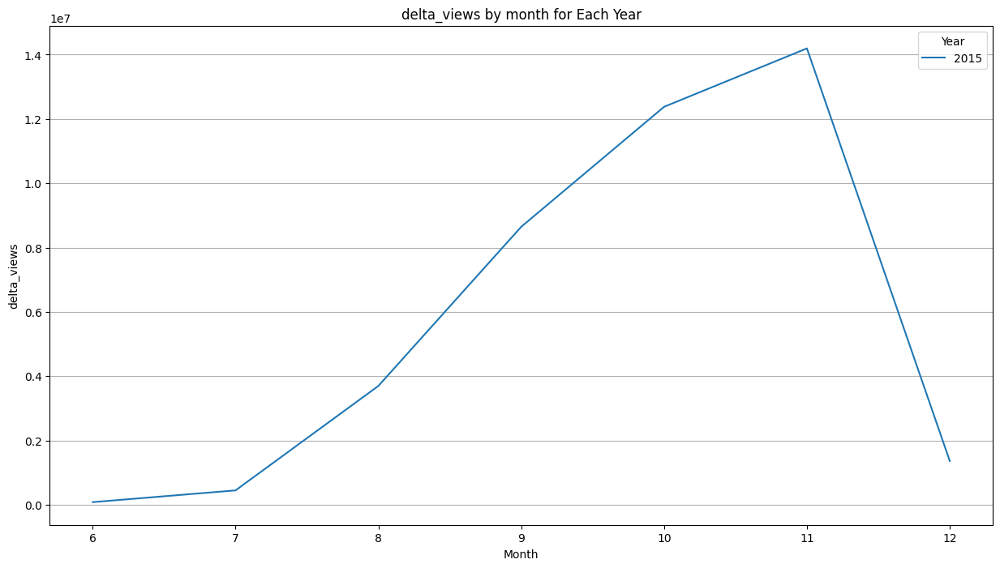

In [39]:
graph_plot_time(sport_df, "month", "delta_views", years=[2015])

In [40]:
import warnings

def plot_top_channels_by_month(df, months, x_column, y_column, top_n=20):
    for month in months:
        month_df = df[df['month'] == month]

        month_channel_views = month_df.groupby([x_column, 'year'])[y_column].sum().reset_index()

        top_channels = month_channel_views.groupby(x_column)[y_column].sum().nlargest(top_n).index
        top_month_channels = month_channel_views[month_channel_views[x_column].isin(top_channels)]

        # Sort the DataFrame by y_column in descending order
        top_month_channels = top_month_channels.sort_values(by=y_column, ascending=False)

        plt.figure(figsize=(12, 6))
        sns.barplot(x=y_column, y=x_column, hue='year', data=top_month_channels, palette='viridis')
        plt.title(f'Top {top_n} Channels for Month {month}')
        plt.xlabel(y_column.replace('_', ' ').capitalize())
        plt.ylabel(x_column.replace('_', ' ').capitalize())
        plt.legend(title='Year')
        plt.show()

        warnings.filterwarnings('ignore')

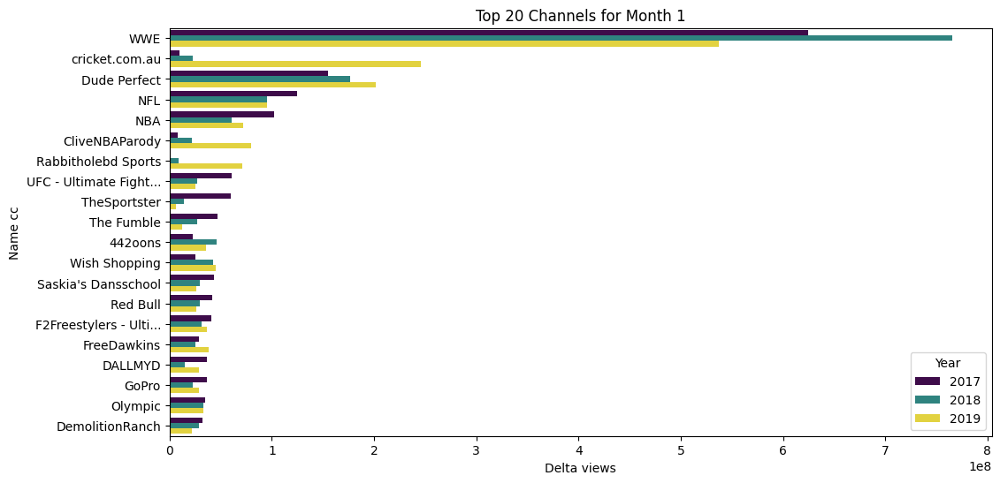

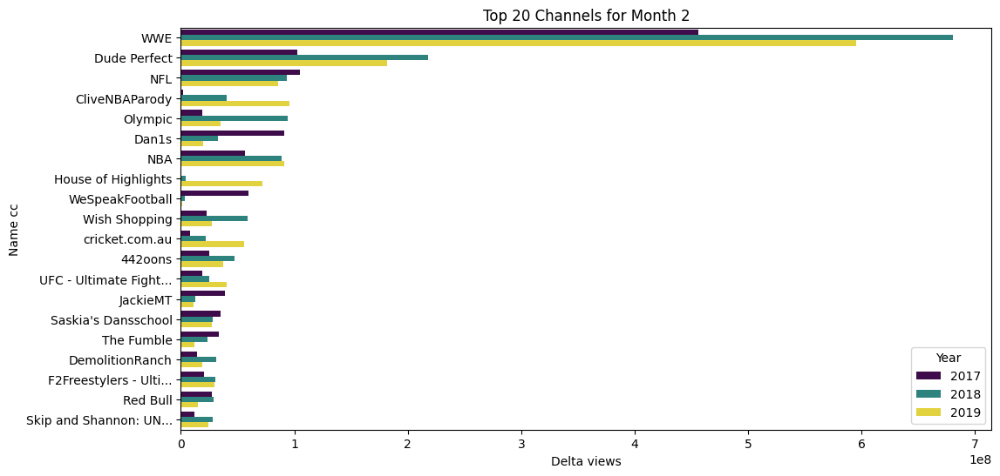

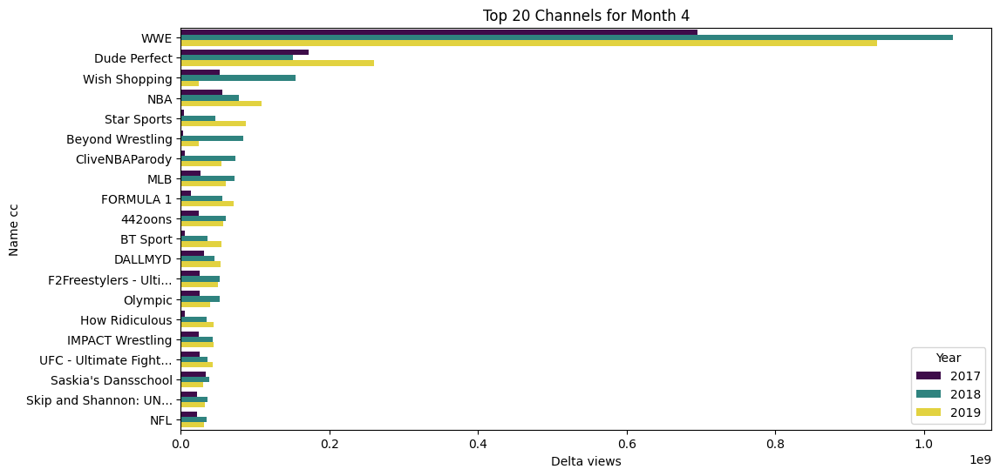

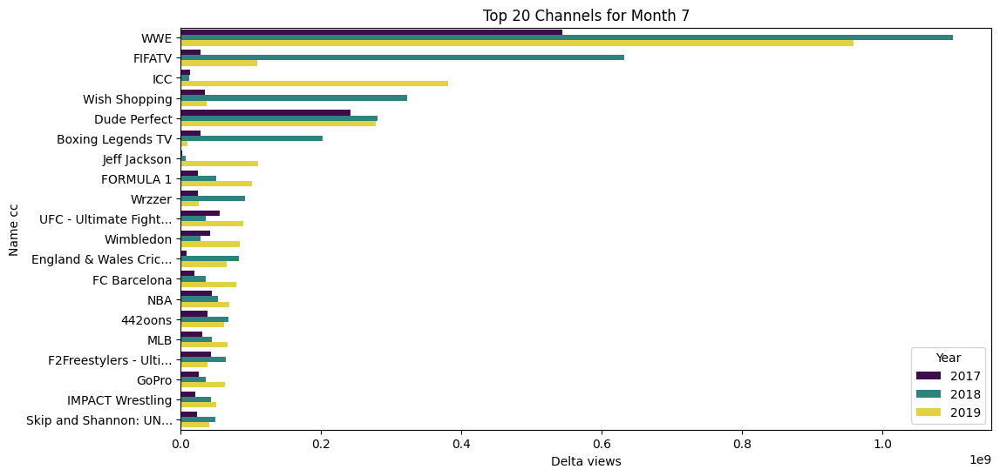

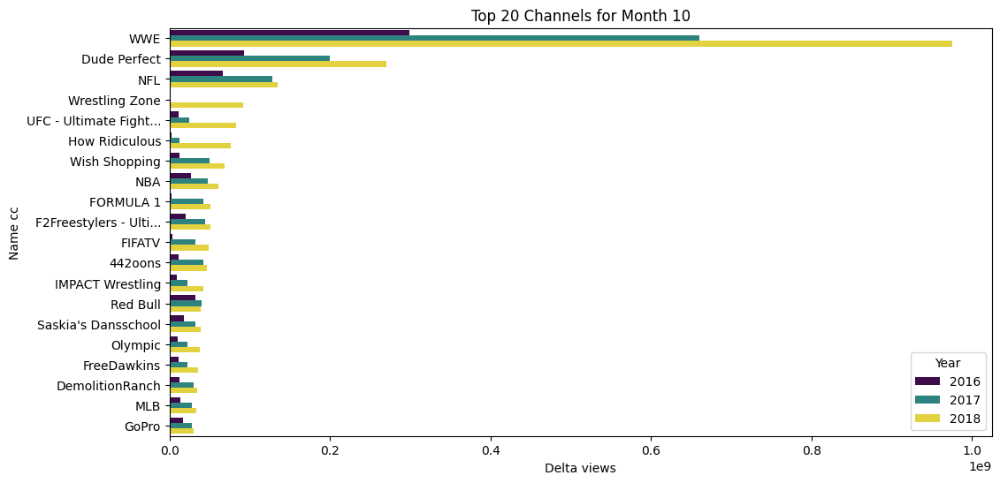

In [130]:
plot_top_channels_by_month(sport_df, [1, 2, 4, 7, 10], 'name_cc', 'delta_views')

- NFL has a lot of views on the 1th, 2th and 10th month
  - playoffs are on january
  - Regular season starts on september
  - Superbowl is in february
- Fifa has a lot of views in the 7th month
  - In 2018 the world cup in france (thats why it has a lot of views in that year)
- MLB (baseball) has a lot of views in the 4th month
- NBA has a lot of views in the 4, 7 and 10th month
- Formula 1 has a lot of views in the 4, 7 and 10th month
- UFC gets a lot of views in the 7 and 10th month
- Cricket had something big in the 1th month in 2019

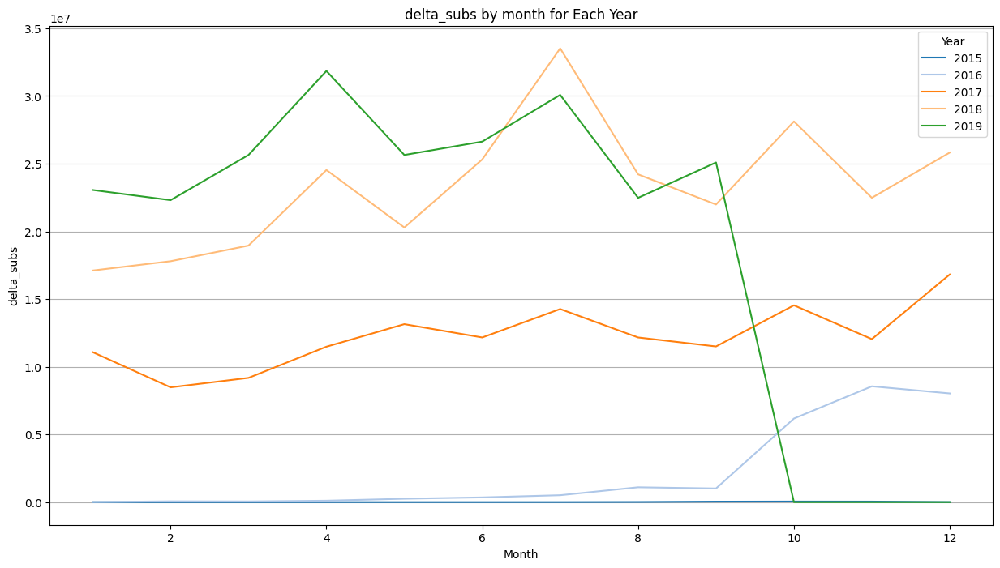

In [42]:
graph_plot_time(sport_df, "month", "delta_subs")

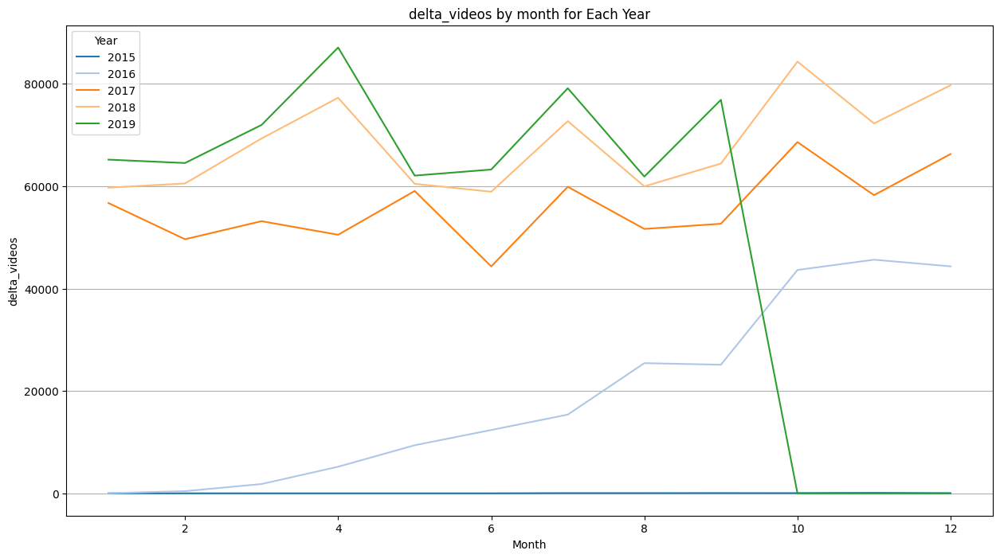

In [43]:
graph_plot_time(sport_df, "month", "delta_videos")

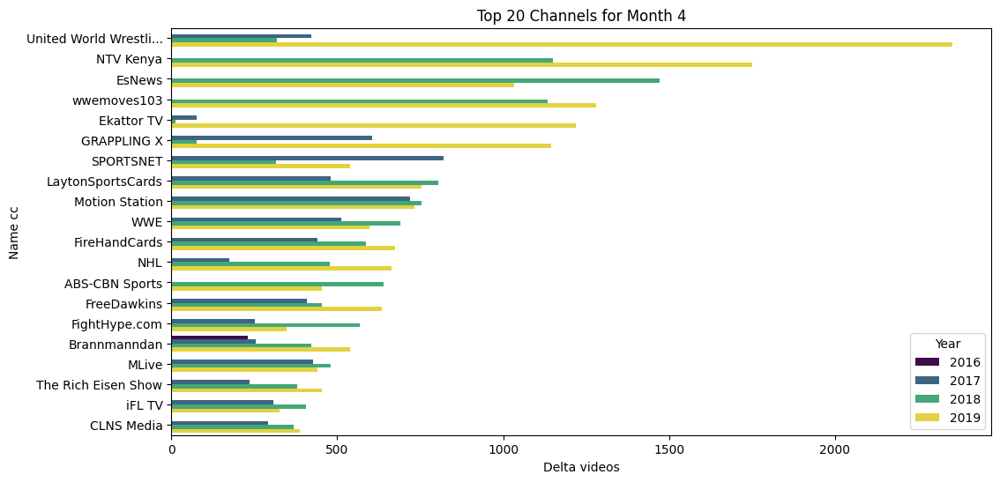

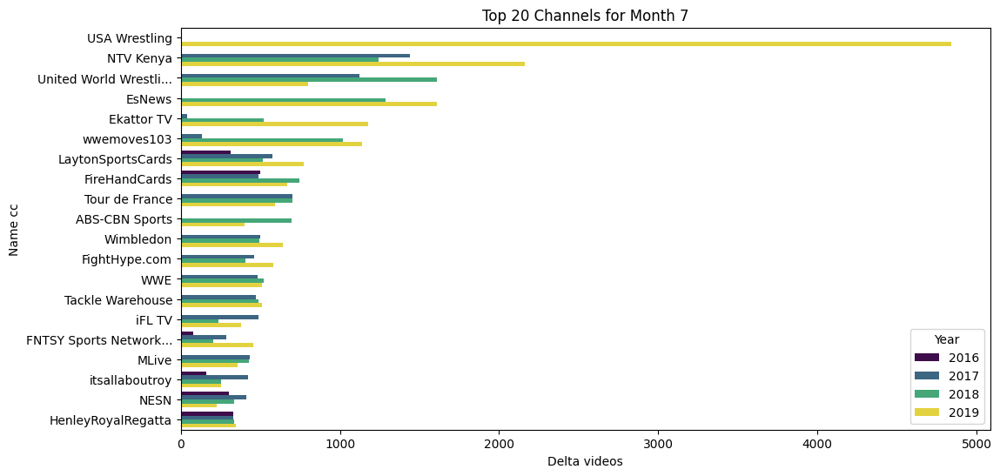

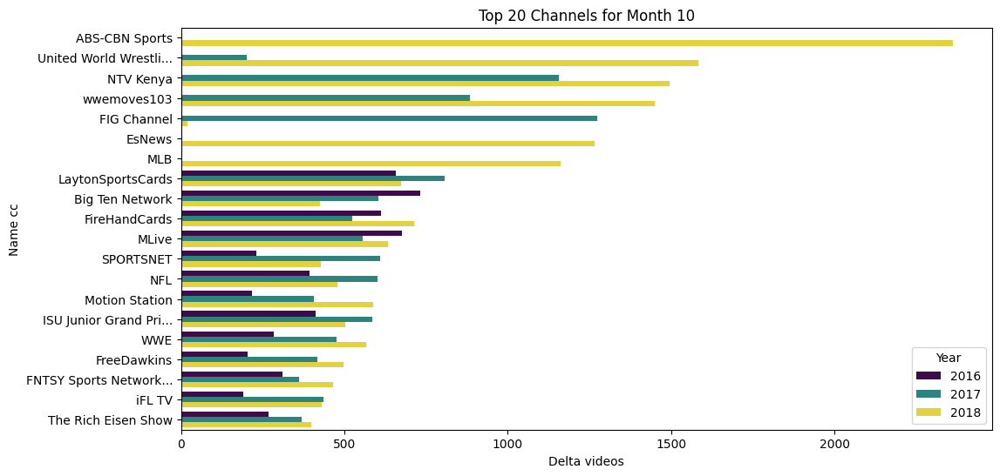

In [44]:
plot_top_channels_by_month(sport_df, [4, 7, 10], 'name_cc', 'delta_videos')

## Graph showing the top 10 days in which we get the most amount of views for each year and month

*Each year has its own y scale*

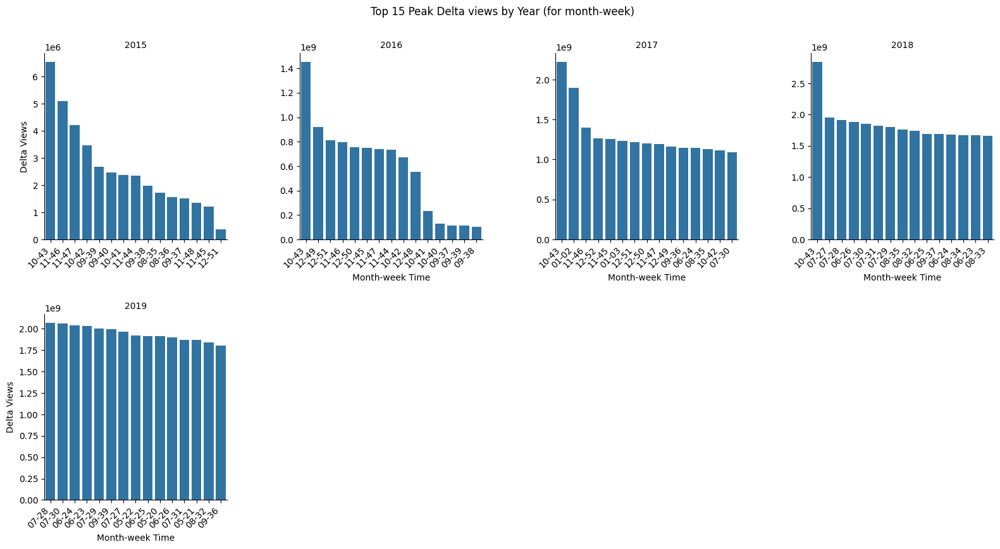

Year: 2015
 year  month  day  delta_views           name_cc
 2015     11   15 4.740958e+06 Sport Vines World
 2015     11   22 3.654632e+06 Sport Vines World
 2015     10   12 3.287535e+06 Sport Vines World
 2015     10   19 3.188580e+06 Sport Vines World
 2015     10   25 2.975231e+06 Sport Vines World
 2015      9   21 2.507756e+06 Sport Vines World
 2015      9   28 2.260272e+06 Sport Vines World
 2015     10    5 2.110530e+06 Sport Vines World
 2015     11    1 2.056044e+06 Sport Vines World
 2015      9   14 1.821537e+06 Sport Vines World
 2015      8   24 1.591507e+06 Sport Vines World
 2015      8   31 1.416712e+06 Sport Vines World
 2015      9    7 1.364918e+06 Sport Vines World
 2015     11   29 1.005030e+06 Sport Vines World
 2015     11    8 8.979040e+05 Sport Vines World


Year: 2016
 year  month  day  delta_views      name_cc
 2016     12   11 1.413475e+08          WWE
 2016     12   25 1.049169e+08          WWE
 2016     10   30 1.041371e+08          WWE
 2016     11   2

In [129]:
import warnings
warnings.filterwarnings('ignore')

# Combine month and day into a single column
sport_df['month_week'] = sport_df['month'].astype(str).str.zfill(2) + '-' + sport_df['week'].astype(str).str.zfill(2)

year_month_day_time_view_count = sport_df.groupby(['year', 'month_week'])['delta_views'].sum().reset_index()

# Top 15 peak view counts by year
peak_view_count_by_year_time = year_month_day_time_view_count.groupby('year').apply(lambda x: x.nlargest(15, 'delta_views')).reset_index(drop=True)

# Plot
g = sns.FacetGrid(peak_view_count_by_year_time, col="year", col_wrap=4, height=4, sharex=False, sharey=False)
g.map_dataframe(sns.barplot, x='month_week', y='delta_views')
g.set_titles("{col_name}")
g.set_xticklabels(rotation=45)
g.set_axis_labels("Month-week Time", "Delta Views")
for ax in g.axes.flat:
    for label in ax.get_xticklabels():
        label.set_rotation(45)
        label.set_ha('right')
g.figure.subplots_adjust(hspace=0.4, wspace=0.4)
g.figure.suptitle('Top 15 Peak Delta views by Year (for month-week)', y=1.05)
plt.show()

# Display the top 15 channels names peak view counts by year
for year in sport_df['year'].unique():
    print(f"Year: {year}")
    print(sport_df[sport_df['year'] == year].nlargest(15, 'delta_views')[
          ['year', 'month', 'day', 'delta_views', 'name_cc']].to_string(index=False))
    print("\n")

## Seasonal analysis

In [58]:
df_sports_seasonal = sport_df[['datetime', 'delta_views', 'delta_subs', 'delta_videos']].copy()
df_sports_seasonal.set_index('datetime', inplace=True)
df_sports_seasonal = df_sports_seasonal.groupby(df_sports_seasonal.index.date).sum()
df_sports_seasonal.sort_index(inplace=True)
df_sports_seasonal.index = pd.to_datetime(df_sports_seasonal.index)

In [59]:
from datetime import datetime, timedelta

deltas = df_sports_seasonal.index.to_series().diff()

# Filter diffs
gaps = deltas[deltas > timedelta(days=1)]

# Print results
print(f'{len(gaps)} gaps with average gap duration: {gaps.mean()}')

print("Unique gaps:", gaps.value_counts())

print("Total amount of dates:", df_sports_seasonal.index.nunique())

226 gaps with average gap duration: 6 days 15:30:15.929203539
Unique gaps: 7 days    146
6 days     80
Name: count, dtype: int64
Total amount of dates: 307


In [ ]:
# We do a resampling because our dataset is not perfectly weekly, there are some error values that every 6 days
df_sports_seasonal = df_sports_seasonal.resample('W').mean(
)
    
df_sports_seasonal.index.to_series().diff().dt.days.value_counts()

7.0    226
Name: count, dtype: int64

### Delta views seasonal analysis

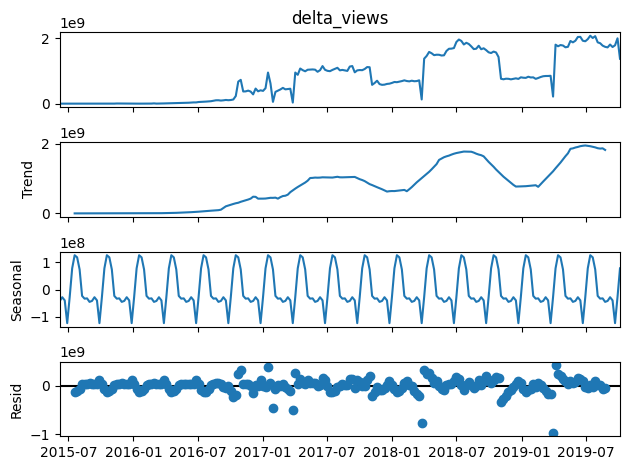

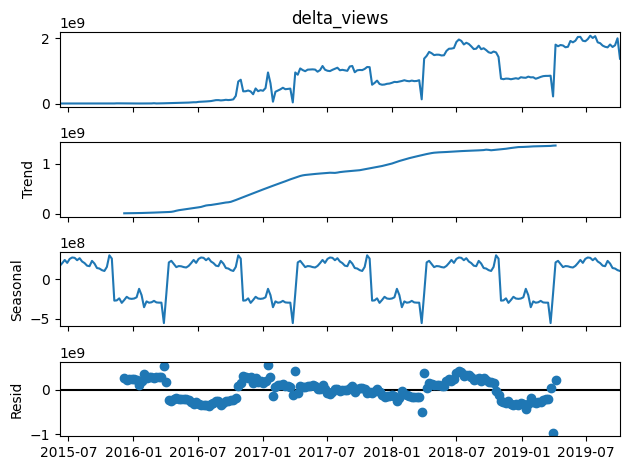

In [ ]:
plot_decomposition(df_sports_seasonal, 'delta_views') # Quarterly seasonality
plot_decomposition(df_sports_seasonal, 'delta_views', weekly_period=52) # Yearly seasonality

### Delta subs seasonal analysis

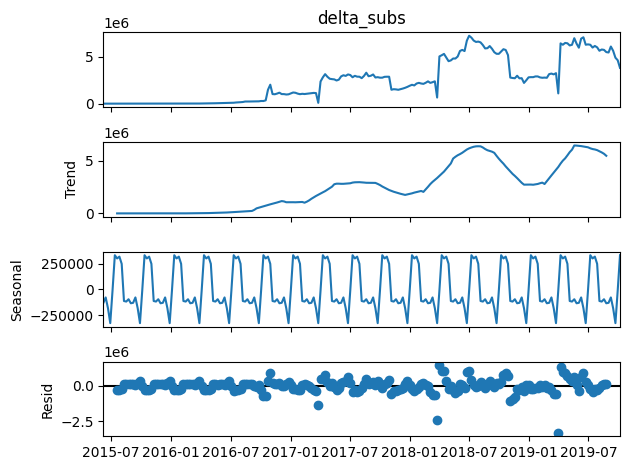

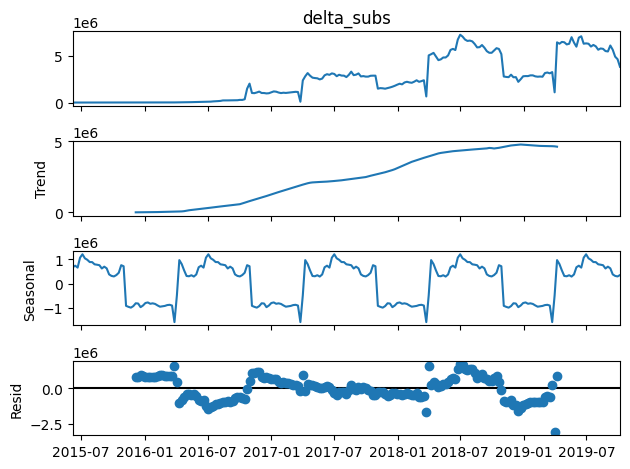

In [17]:
plot_decomposition(df_sports_seasonal, 'delta_subs')
plot_decomposition(df_sports_seasonal, 'delta_subs', weekly_period=52)

### Delta videos seasonal analysis

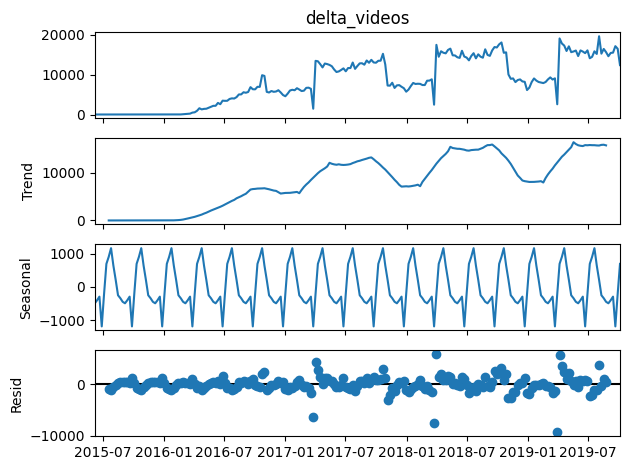

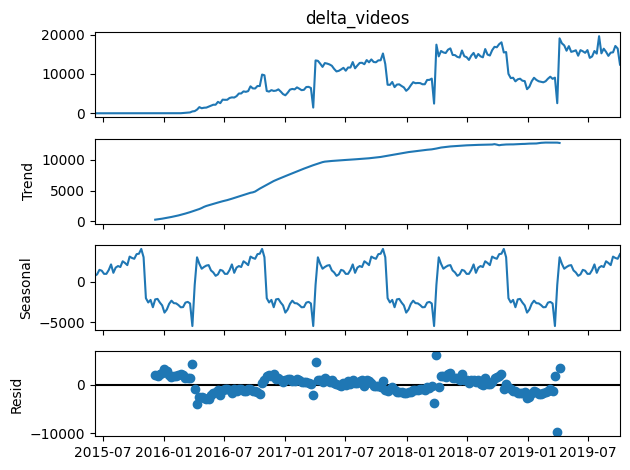

In [18]:
plot_decomposition(df_sports_seasonal, 'delta_videos')
plot_decomposition(df_sports_seasonal, 'delta_videos', weekly_period=52)

We can see that for the sport dataset there is a quarterly and yearly seasonality.

# American football analysis

We only do the analysis in the sport category for american footbal

In [296]:
filtered_df_sport_category = pd.read_parquet('filtered_sport_category_without_description_column_metadata.parquet') # only do analysis in sport category for american football

In [297]:
filtered_df_sport_category['upload_date'] = pd.to_datetime(filtered_df_sport_category['upload_date'])
filtered_df_sport_category['year'] = filtered_df_sport_category['upload_date'].dt.year
filtered_df_sport_category['month'] = filtered_df_sport_category['upload_date'].dt.month
filtered_df_sport_category['day'] = filtered_df_sport_category['upload_date'].dt.day

# sort values by date
filtered_df_sport_category.sort_values(by='upload_date', inplace=True)
filtered_df_sport_category.reset_index(drop=True, inplace=True)

In [298]:
filtered_df_sport_category

,categories,channel_id,crawl_date,dislike_count,display_id,duration,like_count,tags,title,upload_date,view_count,year,month,day
0,Sports,UCs0ACZIa1m4ecu2zijr-8Sg,2019-11-02 05:58:49.815667,123.0,VaLXzI92t9M,60,4848.0,"youtube,crazy,stunt,backflip,COBALTGRUV,jumpin...",First Back Flip on Youtube!,2005-05-24,291474.0,2005,5,24
1,Sports,UCSXWt3Q5KZPTo_3Xjh-gkVQ,2019-11-14 00:16:20.587973,275.0,uSMy78BzZ9s,208,4423.0,"Skateboard,Skateboarding,Skate,trick,tips,Bret...",Skateboard trick tip video,2005-10-27,1700461.0,2005,10,27
2,Sports,UCusD6cPVuc9F9m3L50jCNiA,2019-11-11 18:44:52.507502,3.0,mGN9vh0i-zg,58,311.0,skateboarding,nka skatelab part,2005-11-27,12745.0,2005,11,27
3,Sports,UCSXWt3Q5KZPTo_3Xjh-gkVQ,2019-11-14 00:16:09.611858,79.0,6LgfyUeFlzw,122,6839.0,"Brett,Novak,Tim,Pool,manual,Skateboarding,skat...",Tim Pool - Day at a Chicago Warehouse,2006-01-19,130326.0,2006,1,19
4,Sports,UCSXWt3Q5KZPTo_3Xjh-gkVQ,2019-11-14 00:16:08.374187,1.0,5CUUgxH6xcI,109,6.0,"Brett,Novak,Bret,Alex,Lutz,Quality,Skateboardi...",Newer old Alex Lutz footy,2006-01-31,3820.0,2006,1,31
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4354407,Sports,UCSAys3yHQjH5n8y082xgHNg,2019-10-29 20:15:30.831802,0.0,sFrATmJ5y2s,1093,19.0,"Jim Cornette,Monday Nitro,WCW,Conrad Thompson,...",Tony Schiavone Calls Vader vs Dustin Rhodes f...,2019-10-28,335.0,2019,10,28
4354408,Sports,UC650u4npJNtyVbBGscP3Zfg,2019-11-20 22:24:26.555035,1.0,NNZlaGACKyg,1390,100.0,"Realtree,chasing november,chasing november 201...","S4E23: Holiday Buck Success, Missouri Bow Buck",2019-10-29,8702.0,2019,10,29
4354409,Sports,UC650u4npJNtyVbBGscP3Zfg,2019-11-20 22:24:25.927339,4.0,ch1iLWBZ9CA,1464,98.0,"Realtree,hunting,bill jordan,camouflage,huntin...","S4E24: New Years Day Success, Season’s Finale",2019-10-30,5792.0,2019,10,30
4354410,Sports,UCSAys3yHQjH5n8y082xgHNg,2019-11-23 15:34:20.110278,1.0,36w5skJiU78,454,25.0,"Jim Cornette,Monday Nitro,WCW,Conrad Thompson,...",Tony Schiavone calls Alundra Blayze vs Malia H...,2019-11-11,750.0,2019,11,11


In [299]:
american_football_df = helpers.keyword_searcher(
    filtered_df_sport_category, ['american football', 'nfl', 'super bowl'])

In [300]:
# Grab the channels that have more than 40% American football content

channel_football_content = american_football_df.groupby('channel_id').size() / filtered_df_sport_category.groupby('channel_id').size() * 100

# Filter channels with 40% or more American football content
channels_40_percent_football = channel_football_content[channel_football_content >= 40].index

In [301]:
american_football_df_timeseries = df[df['channel'].isin(channels_40_percent_football)]

In [302]:
american_football_df_timeseries.head()

,channel,category,datetime,views,delta_views,subs,delta_subs,videos,delta_videos,activity,name_cc,year,month,day,week,is_sports,post_treatment,interaction
2265,UC3LLYYAQFZaqEDKpYE3TXHg,Entertainment,2016-01-04,1436580.75,8382.75,6119.250,0.000,568,0,4,MicrowaveMeShow,2016,1,4,1,0,0,0
2379,UC3LLYYAQFZaqEDKpYE3TXHg,Entertainment,2016-01-11,1454536.75,17956.00,6168.250,49.000,569,1,3,MicrowaveMeShow,2016,1,11,2,0,0,0
2419,UCrq9TWEFtluCW3s5_b_GBxQ,Nonprofits & Activism,2016-01-11,4352701.25,7337.25,13020.750,0.000,434,0,7,David Williams,2016,1,11,2,0,0,0
2585,UC3LLYYAQFZaqEDKpYE3TXHg,Entertainment,2016-01-18,1468735.00,14198.25,6143.750,0.000,573,4,5,MicrowaveMeShow,2016,1,18,3,0,0,0
2625,UCrq9TWEFtluCW3s5_b_GBxQ,Nonprofits & Activism,2016-01-18,4378077.75,25376.50,13119.875,99.125,434,0,5,David Williams,2016,1,18,3,0,0,0


The American Football Calendar
---

**January**
- **Playoffs**: The NFL playoffs begin, culminating in the Super Bowl, which typically occurs in early February. Teams compete in a single-elimination format to determine the conference champions.
- **Pro Bowl**: Held in late January, this exhibition game features star players from the NFL.

**February**
- **Super Bowl**: The championship game of the NFL season is held, drawing significant national attention and viewership.
- **Post-Season Activities**: Following the Super Bowl, teams evaluate their rosters and prepare for the off-season.

**March**
- **Free Agency**: The NFL’s free agency period begins, allowing teams to sign players whose contracts have expired. This is a critical time for teams to strengthen their rosters.
- **NFL Draft Preparation**: Teams start preparing for the NFL Draft by evaluating college prospects.

**April**
- **NFL Draft**: Typically held in late April, this event allows teams to select eligible college players to join their rosters. It’s a major focus for fans and analysts alike.

**May**
- **Rookie Minicamps**: Teams hold minicamps for newly drafted rookies and undrafted free agents to integrate them into the team.
- **OTAs (Organized Team Activities)**: These voluntary workouts allow teams to practice with players.

**June**
- **OTAs Continue**: Teams focus on skill development and team building.
- **Mandatory Minicamps**: Many teams hold mandatory minicamps where all players participate.

**July**
- **Training Camp**: Training camps begin at the end of July, where teams prepare for the upcoming season through rigorous training and practice sessions.

**August**
- **Preseason Games**: Teams play exhibition games to evaluate players and finalize their rosters, typically held over three weeks.

**September**
- **Regular Season Kickoff**: The NFL regular season starts in early September, with each team playing 17 games over an 18-week period.

**October**
- **Regular Season Continues**: The regular season is in full swing, with teams competing weekly. This month often features intense rivalries and critical matchups.

**November**
- **Midseason Analysis**: As teams approach the halfway point of the season, analysts assess playoff potentials and team performances.

**December**
- **Regular Season Conclusion**: The regular season concludes in early January, often with key matchups that determine playoff positions.

---

August  
- August 1: Hall of Fame Game (typically first Thursday in August)  
- August 1-4: Hall of Fame Weekend  
- August 8-11: First Preseason Weekend  
- August 15-18: Second Preseason Weekend  
- August 22-25: Third Preseason Weekend  
- August 27: Roster reduction deadline to 53 players  

September  
- September 1: Final day of preseason training camp  
- September 5: NFL regular season begins (typically first Thursday after Labor Day)  
- First Sunday of September: First full slate of regular season games  

October  
- International Games in London (typically three Sundays in October)  

November  
- November 5: NFL trade deadline  
- Fourth Thursday: Thanksgiving Day games  

December  
- Regular season games continue  
- December 25: Christmas Day games (when applicable)  

January  
- First Sunday: Final regular season games  
- Second weekend: Super Wild Card Weekend (January 11-13 for 2025 season)  
- Third weekend: Divisional Playoff Games (January 18-19 for 2025 season)  
- Fourth Sunday: Conference Championship Games (January 26 for 2025 season)  

February  
- First Sunday: Pro Bowl Games  
- Second Sunday: Super Bowl (February 9 for Super Bowl LIX in 2025)  

Key dates by phase:  

Preseason  
- Typically starts with Hall of Fame Game (first Thursday in August)  
- Three weekends of preseason games in mid-to-late August  

Regular Season  
- Starts first Thursday after Labor Day  
- Runs for 18 weeks, ending in early January  

Playoffs  
- Start second weekend of January  
- Wild Card Round: Second weekend of January  
- Divisional Round: Third weekend of January  
- Conference Championships: Fourth Sunday of January  

Super Bowl  
- Second Sunday in February  



## Pie chart general info

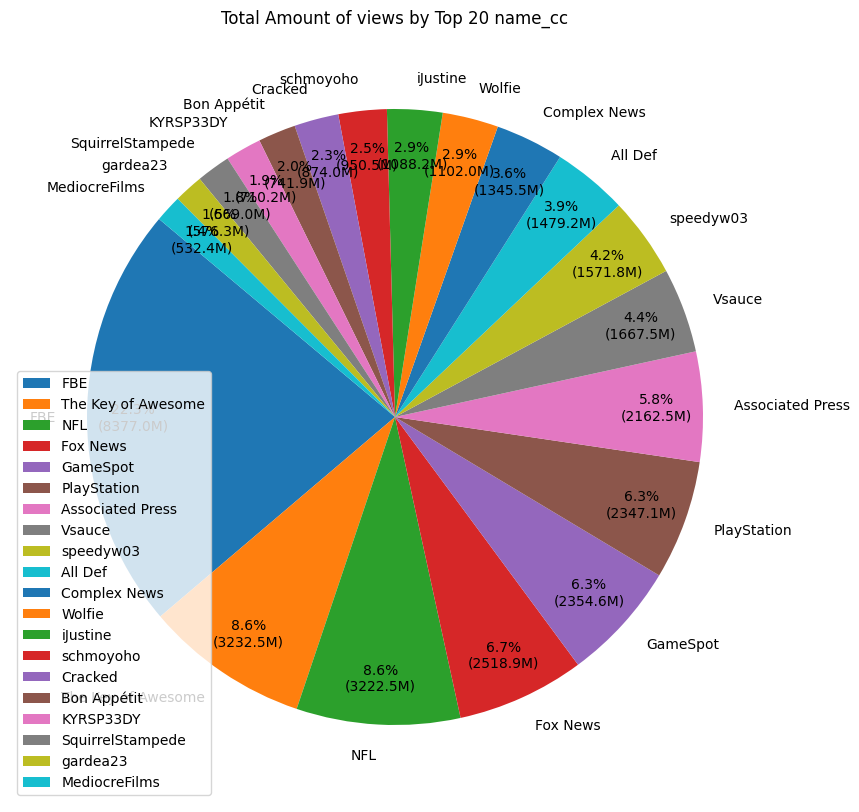

In [303]:
pie_chart(american_football_df_timeseries, 20, 'name_cc', 'views')

## Plot whole timeline

/var/folders/dy/b1b3v71j30715q_7sr29yn6h0000gn/T/ipykernel_56865/1186553642.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['year_month'] = df['year'].astype(


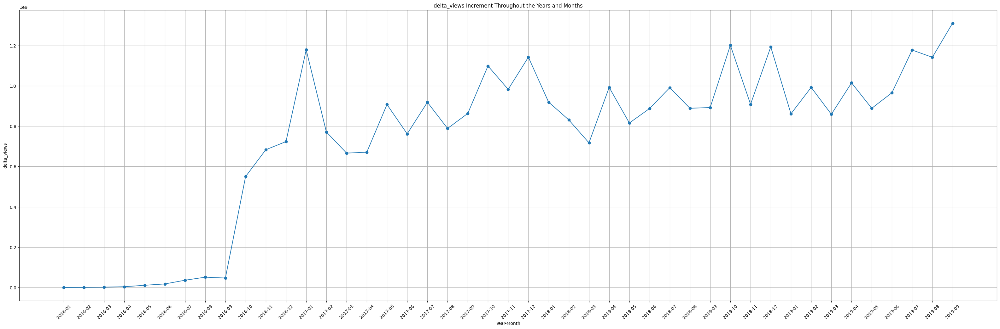

In [304]:
plot_whole_timeline(american_football_df_timeseries, "delta_views")

/var/folders/dy/b1b3v71j30715q_7sr29yn6h0000gn/T/ipykernel_56865/1186553642.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['year_month'] = df['year'].astype(


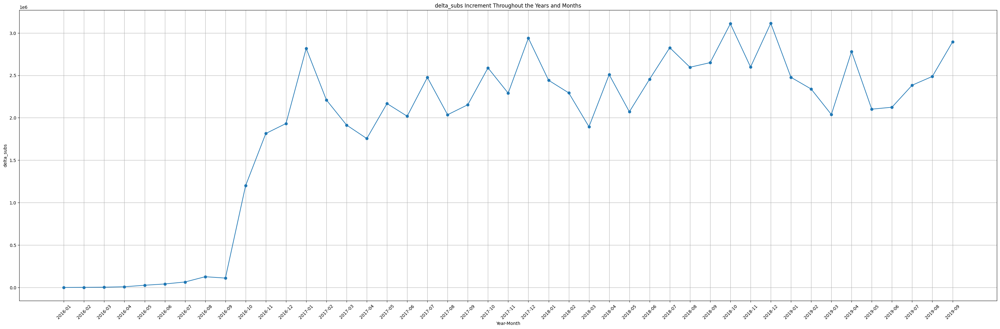

In [305]:
plot_whole_timeline(american_football_df_timeseries, "delta_subs")

/var/folders/dy/b1b3v71j30715q_7sr29yn6h0000gn/T/ipykernel_56865/1186553642.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['year_month'] = df['year'].astype(


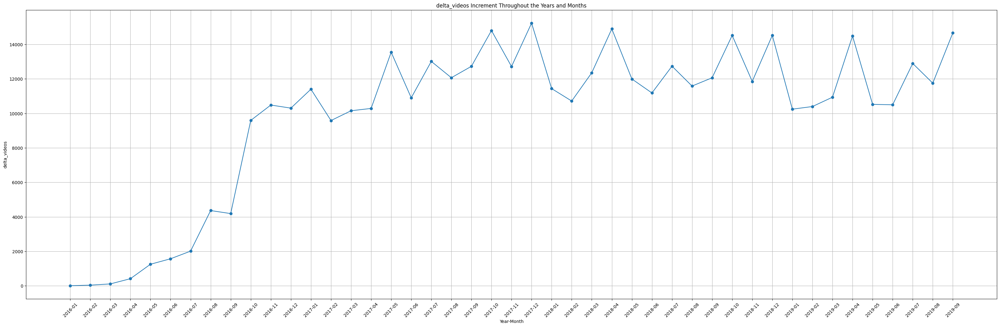

In [306]:
plot_whole_timeline(american_football_df_timeseries, "delta_videos")

## Plot monthly and daily information by year

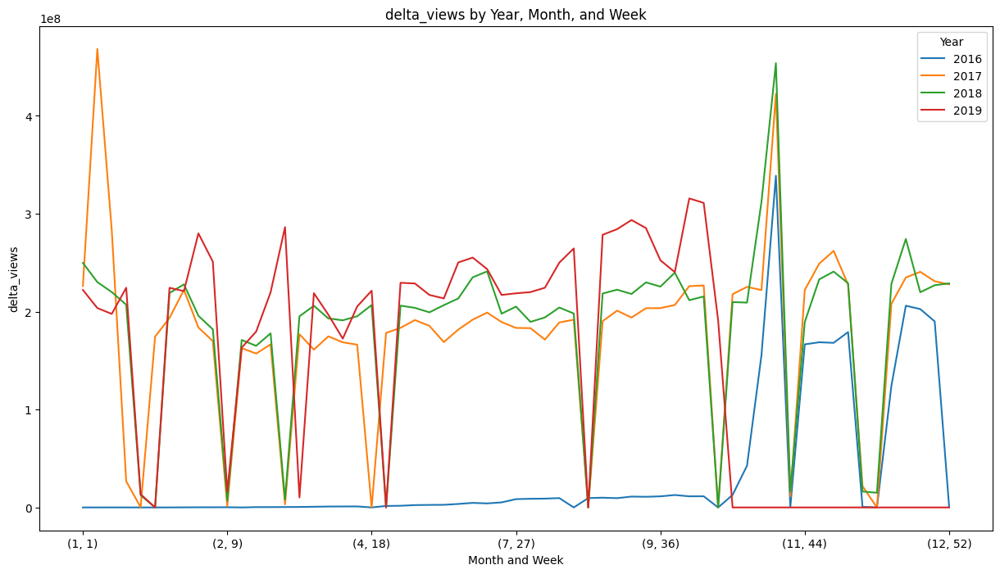

In [307]:
graph_groupby_time(american_football_df_timeseries, 'delta_views')

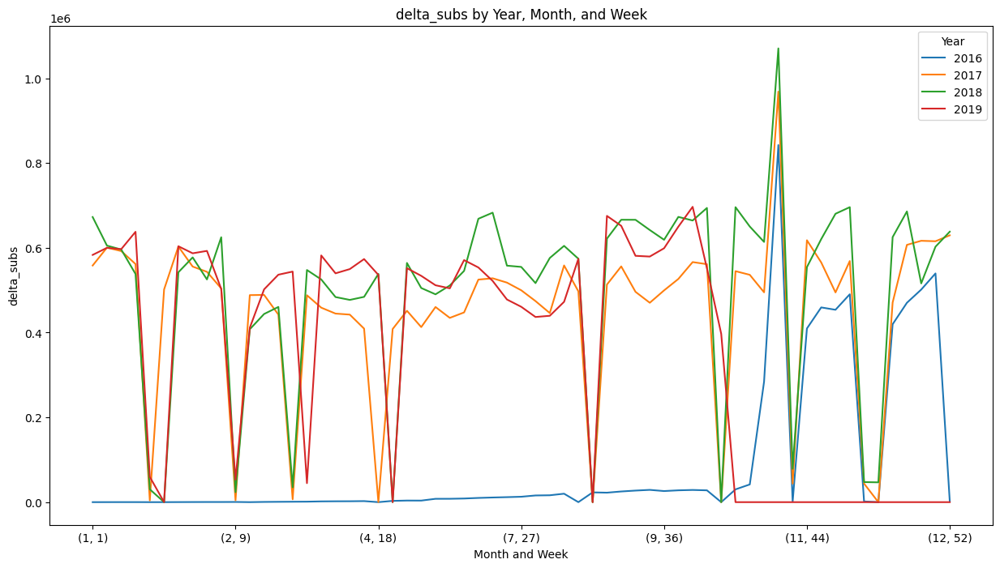

In [308]:
graph_groupby_time(american_football_df_timeseries, 'delta_subs')

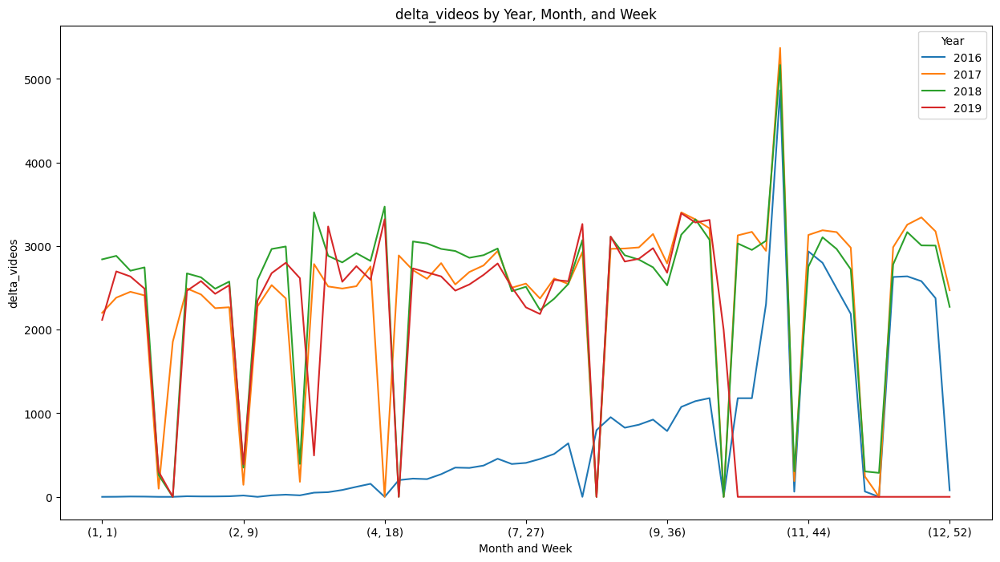

In [309]:
graph_groupby_time(american_football_df_timeseries, 'delta_videos')

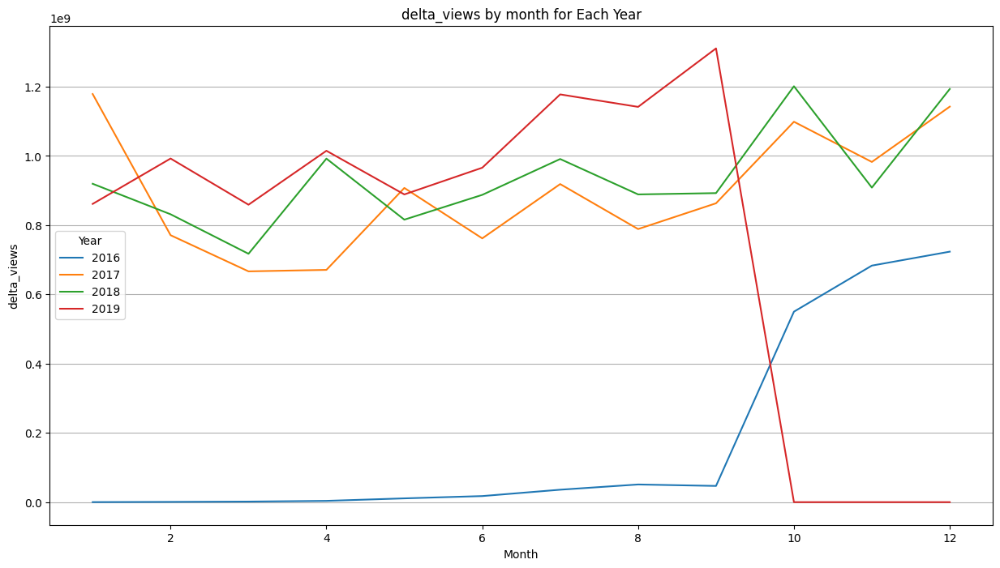

In [310]:
graph_plot_time(american_football_df_timeseries, "month", "delta_views")

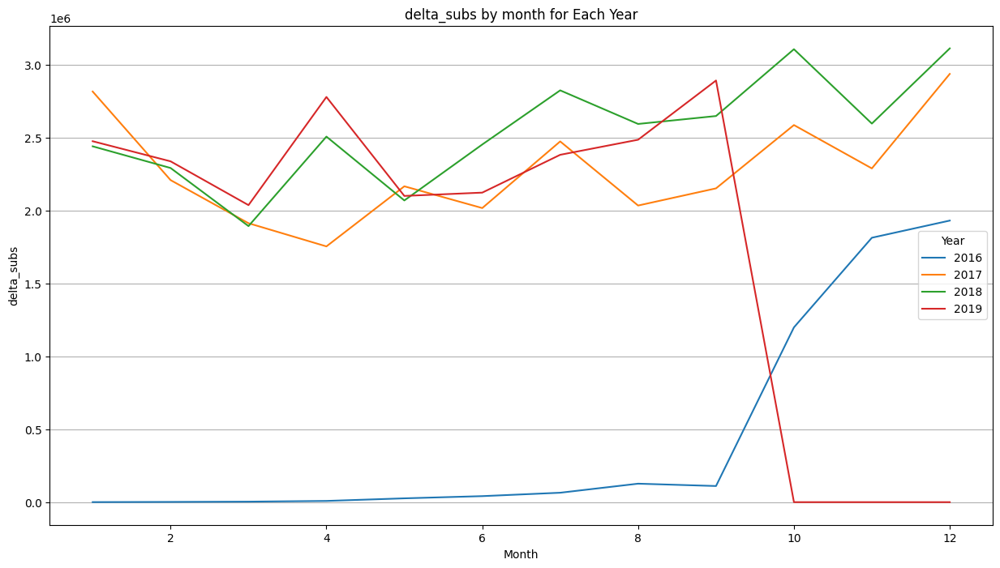

In [311]:
graph_plot_time(american_football_df_timeseries, "month", "delta_subs")

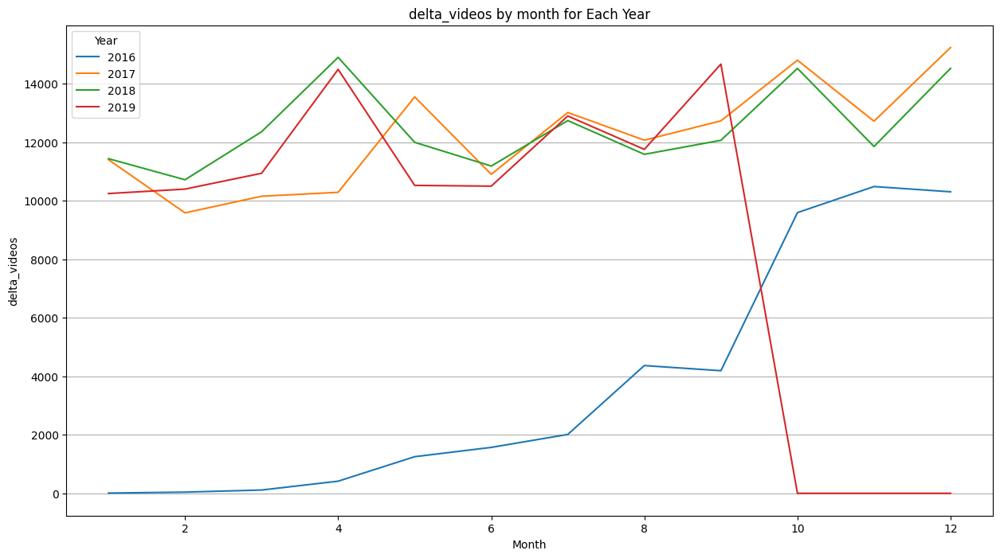

In [312]:
graph_plot_time(american_football_df_timeseries, "month", "delta_videos")

In [313]:
def graph_groupby_time_day_spans(df, x_column):
    grouped_df = df.groupby(['year', 'month', 'week', 'day'])[x_column].sum().reset_index()

    # Pivot the table to have years as columns and months/days as rows
    pivot_df = grouped_df.pivot_table(index=['month', 'week', 'day'], columns='year', values=x_column, fill_value=0)

    pivot_df.plot(kind='line', figsize=(15, 8))
    plt.title(f'{x_column} by Year, Month, and Day')
    plt.xlabel('Month and Day')
    plt.ylabel(x_column)

    # do spans for american football (not 100% exact dates)
    # nfl draft
    apr_1_index = pivot_df.index.get_loc((4, 14, 1))
    apr_30_index = pivot_df.index.get_loc((4, 18, 30))
    plt.axvspan(apr_1_index, apr_30_index, color='orange', alpha=0.3, label='NFL Draft')

    # nfl season
    sep_1_index = pivot_df.index.get_loc((9, 36, 2))
    dec_31_index = pivot_df.index.get_loc((12, 52, 31))
    plt.axvspan(sep_1_index, dec_31_index, color='green', alpha=0.3, label='NFL Season')

    # playoffs 
    jan_1_index = pivot_df.index.get_loc((1, 1, 1))
    jan_31_index = pivot_df.index.get_loc((1, 4, 27))
    plt.axvspan(jan_1_index, jan_31_index, color='blue', alpha=0.3, label='Playoffs')

    # superbowl happened between these dates for year 2005 to 2019
    feb_1_index = pivot_df.index.get_loc((2, 5, 1))
    feb_7_index = pivot_df.index.get_loc((2, 6, 8))
    plt.axvspan(feb_1_index, feb_7_index, color='red', alpha=0.3, label='Super Bowl')

    plt.legend(title='Year')

    plt.show()

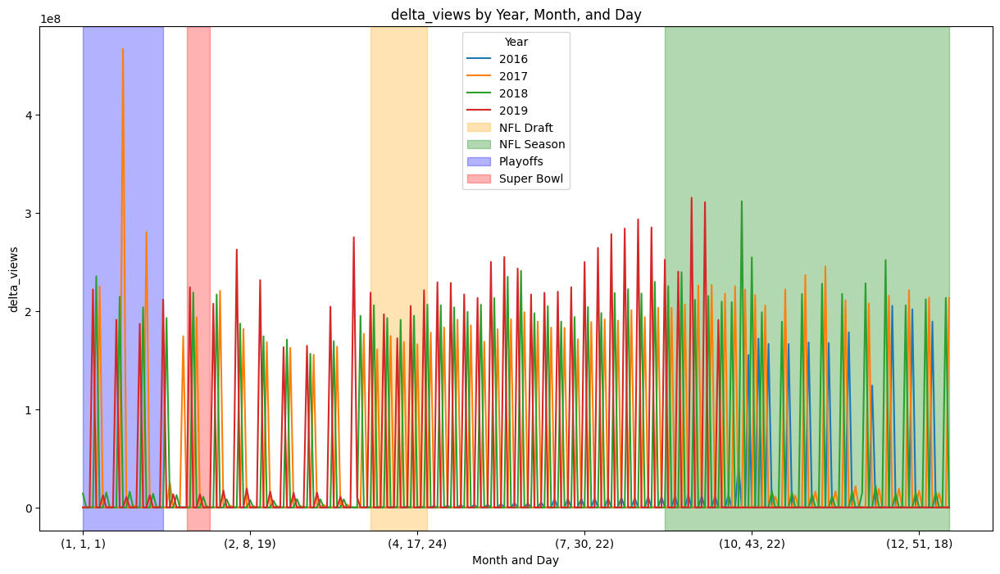

In [314]:
graph_groupby_time_day_spans(american_football_df_timeseries, 'delta_views')

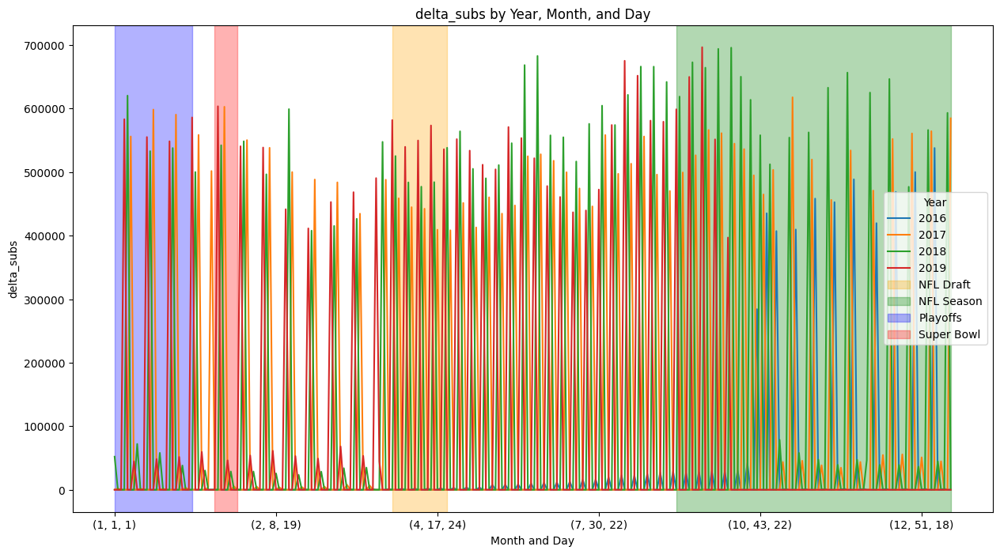

In [315]:
graph_groupby_time_day_spans(american_football_df_timeseries, 'delta_subs')

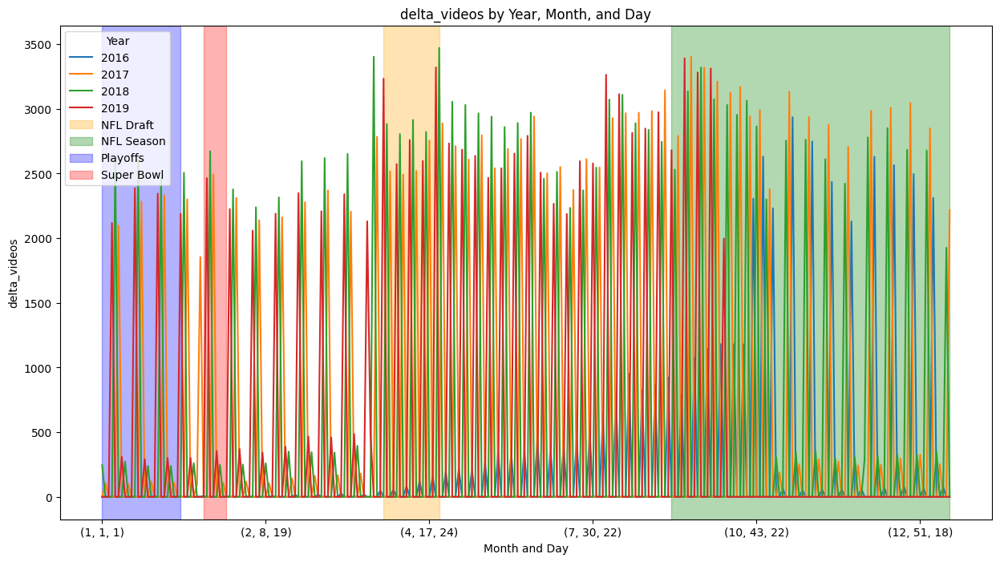

In [316]:
graph_groupby_time_day_spans(american_football_df_timeseries, 'delta_videos')

# Football

We only do analysis on the sport category for football

In [317]:
# filtered_df_sport_category = pd.read_parquet('filtered_sport_metadata(by_tags_and_title)_without_description_column.parquet')
filtered_df_sport_category = pd.read_parquet('filtered_sport_category_without_description_column_metadata.parquet')

In [318]:
filtered_df_sport_category['upload_date'] = pd.to_datetime(filtered_df_sport_category['upload_date'])
filtered_df_sport_category['year'] = filtered_df_sport_category['upload_date'].dt.year
filtered_df_sport_category['month'] = filtered_df_sport_category['upload_date'].dt.month
filtered_df_sport_category['day'] = filtered_df_sport_category['upload_date'].dt.day

# sort values by date
filtered_df_sport_category.sort_values(by='upload_date', inplace=True)
filtered_df_sport_category.reset_index(drop=True, inplace=True)

In [319]:
football_df = helpers.keyword_searcher(
    filtered_df_sport_category, ['football', 'soccer', 'futbol', 'world cup', 'worldcup'])

In [320]:
# Grab the channels that have more than 40% 

channel_football_content = football_df.groupby('channel_id').size() / filtered_df_sport_category.groupby('channel_id').size() * 100

# Filter channels with 40% or more
channels_40_percent_football = channel_football_content[channel_football_content >= 40].index

football_df_timeseries = df[df['channel'].isin(channels_40_percent_football)]
football_df_timeseries.head()

,channel,category,datetime,views,delta_views,subs,delta_subs,videos,delta_videos,activity,name_cc,year,month,day,week,is_sports,post_treatment,interaction
698,UCyCTtyAUOliulO9mXBnMnHA,Sports,2015-08-24,5.615977e+06,1591506.750,48608.000000,0.000000,2,0,0,Sport Vines World,2015,8,24,35,1,0,0
715,UCyCTtyAUOliulO9mXBnMnHA,Sports,2015-08-31,7.032689e+06,1416712.250,56997.777778,8389.777778,2,0,0,Sport Vines World,2015,8,31,36,1,0,0
771,UCyCTtyAUOliulO9mXBnMnHA,Sports,2015-09-07,8.397607e+06,1364918.375,64906.250000,7908.472222,2,0,0,Sport Vines World,2015,9,7,37,1,0,0
825,UCyCTtyAUOliulO9mXBnMnHA,Sports,2015-09-14,1.021914e+07,1821537.125,74047.000000,9140.750000,2,0,0,Sport Vines World,2015,9,14,38,1,0,0
893,UCyCTtyAUOliulO9mXBnMnHA,Sports,2015-09-21,1.272690e+07,2507755.500,85658.000000,11611.000000,2,0,0,Sport Vines World,2015,9,21,39,1,0,0


Football Calendar

- World cup 2018
  - June 14 - July 15
- Euro 2016
    - June 10 - July 10
- Uefa Champions League
    - September 17 - May 6

## Pie chart general info

/opt/homebrew/Caskroom/miniforge/base/envs/torch/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 2361 (\N{DEVANAGARI LETTER HA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/torch/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Matplotlib currently does not support Devanagari natively.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/torch/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 2352 (\N{DEVANAGARI LETTER RA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniforge/base/envs/torch/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 2326 (\N{DEVANAGARI LETTER KHA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


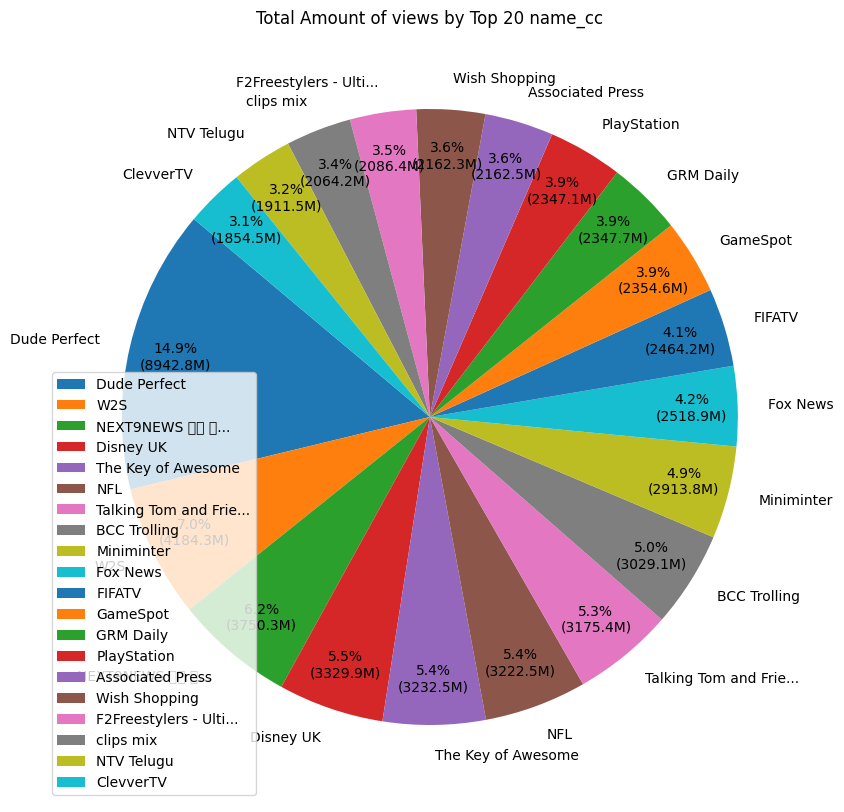

In [321]:
pie_chart(football_df_timeseries, 20, 'name_cc', 'views')

## Plot whole timeline

/var/folders/dy/b1b3v71j30715q_7sr29yn6h0000gn/T/ipykernel_56865/1186553642.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['year_month'] = df['year'].astype(


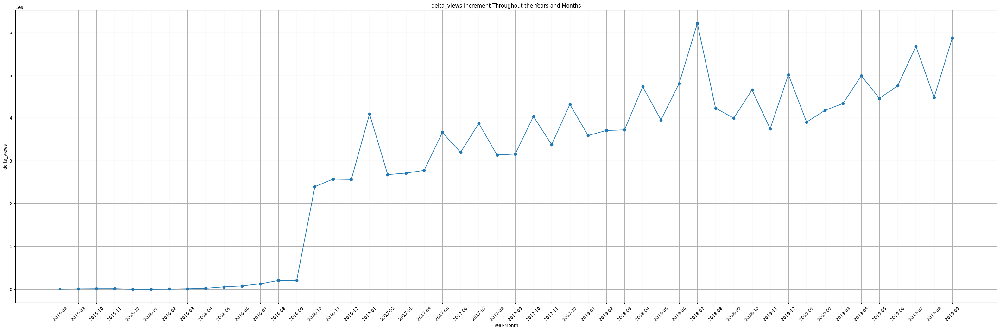

In [322]:
plot_whole_timeline(football_df_timeseries, "delta_views")

/var/folders/dy/b1b3v71j30715q_7sr29yn6h0000gn/T/ipykernel_56865/1186553642.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['year_month'] = df['year'].astype(


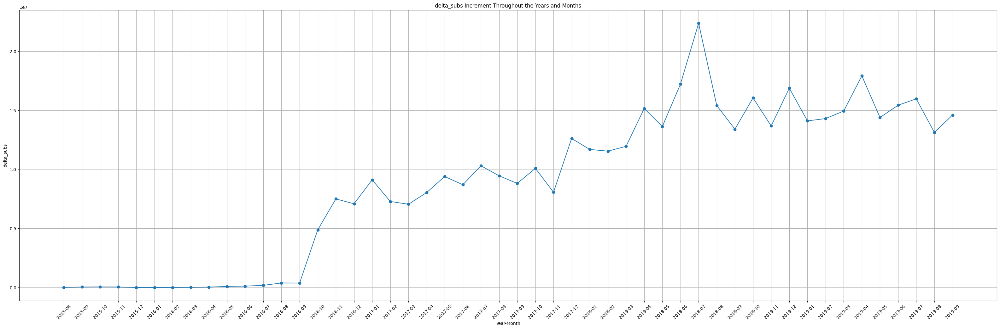

In [323]:
plot_whole_timeline(football_df_timeseries, "delta_subs")

/var/folders/dy/b1b3v71j30715q_7sr29yn6h0000gn/T/ipykernel_56865/1186553642.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['year_month'] = df['year'].astype(


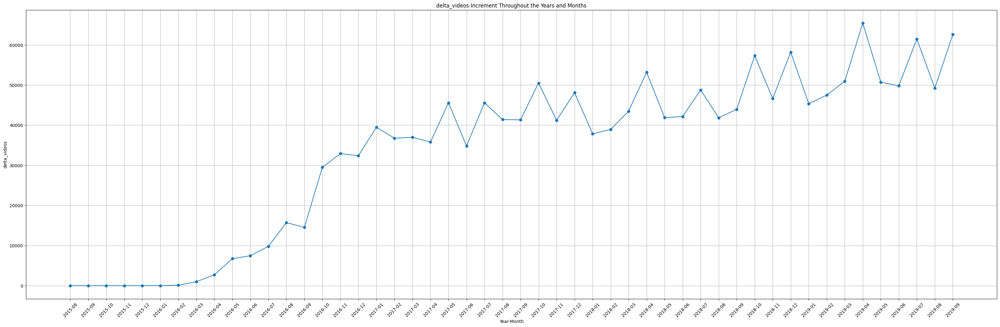

In [324]:
plot_whole_timeline(football_df_timeseries, "delta_videos")

## Plot monthly and daily information by year

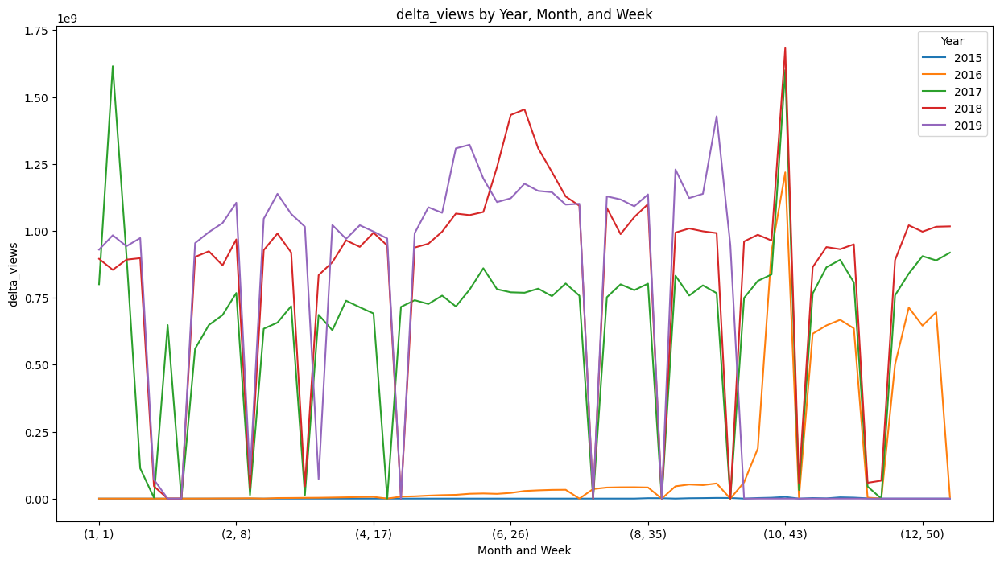

In [325]:
graph_groupby_time(football_df_timeseries, 'delta_views')

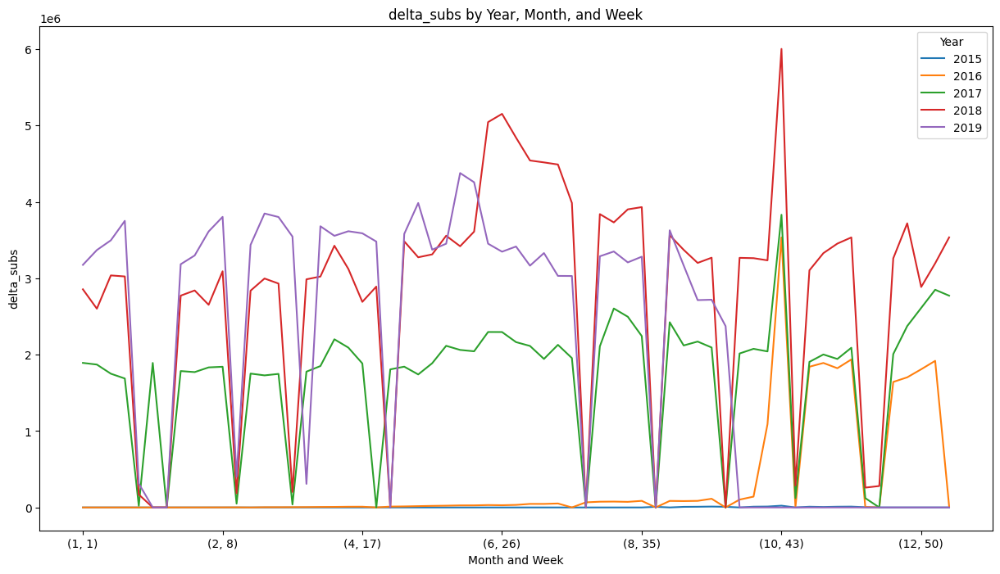

In [326]:
graph_groupby_time(football_df_timeseries, 'delta_subs')

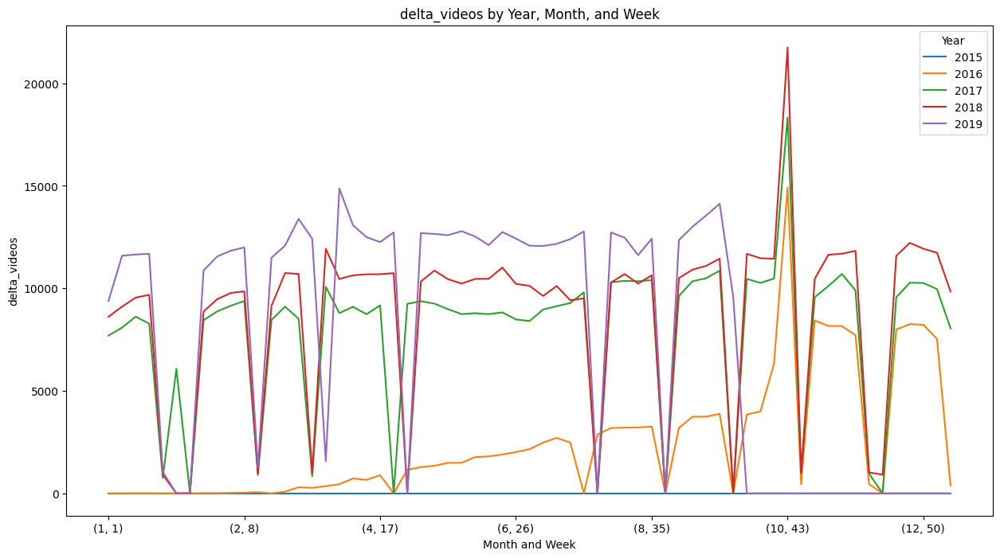

In [327]:
graph_groupby_time(football_df_timeseries, 'delta_videos')

### Monthly information

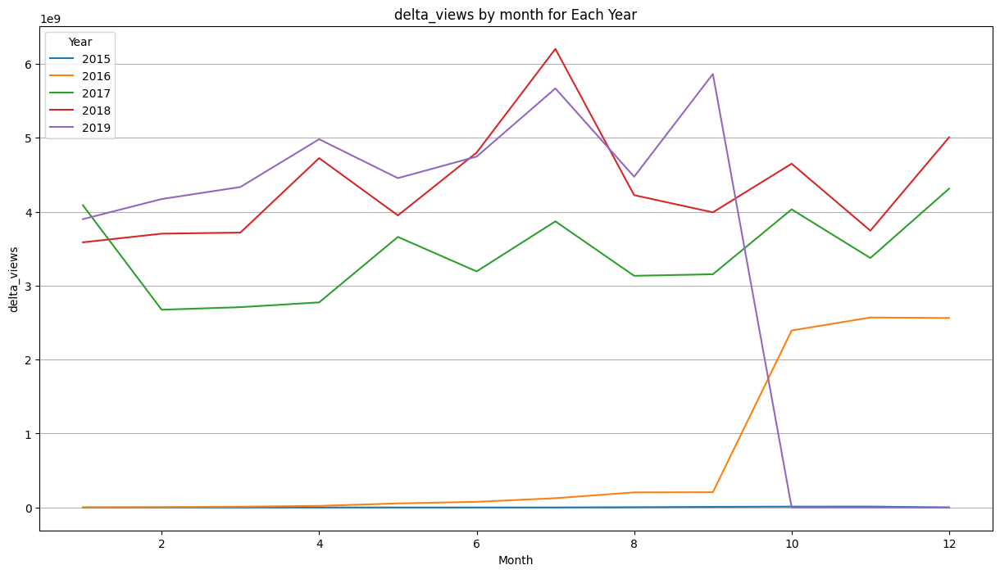

In [328]:
graph_plot_time(football_df_timeseries, "month", "delta_views")

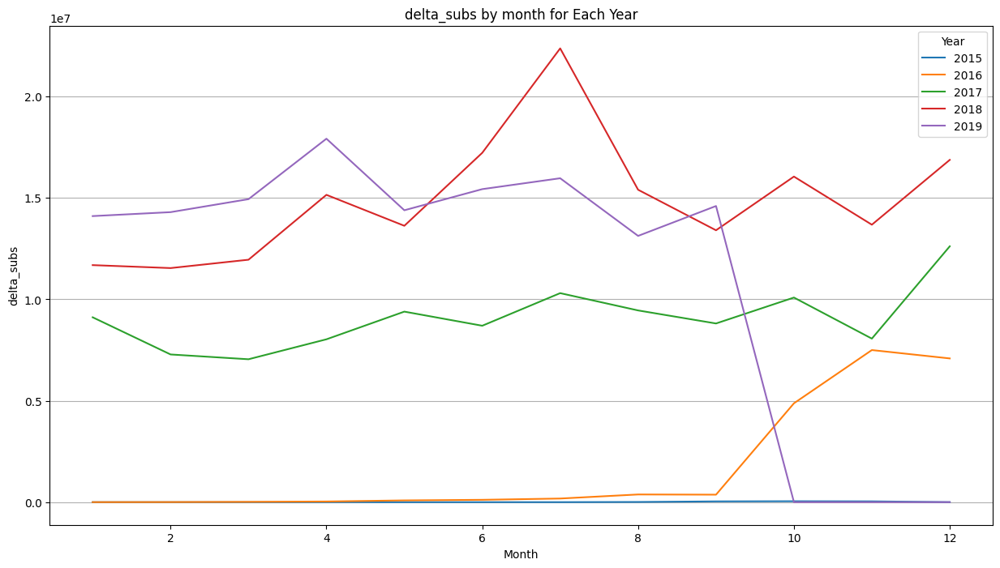

In [329]:
graph_plot_time(football_df_timeseries, "month", "delta_subs")

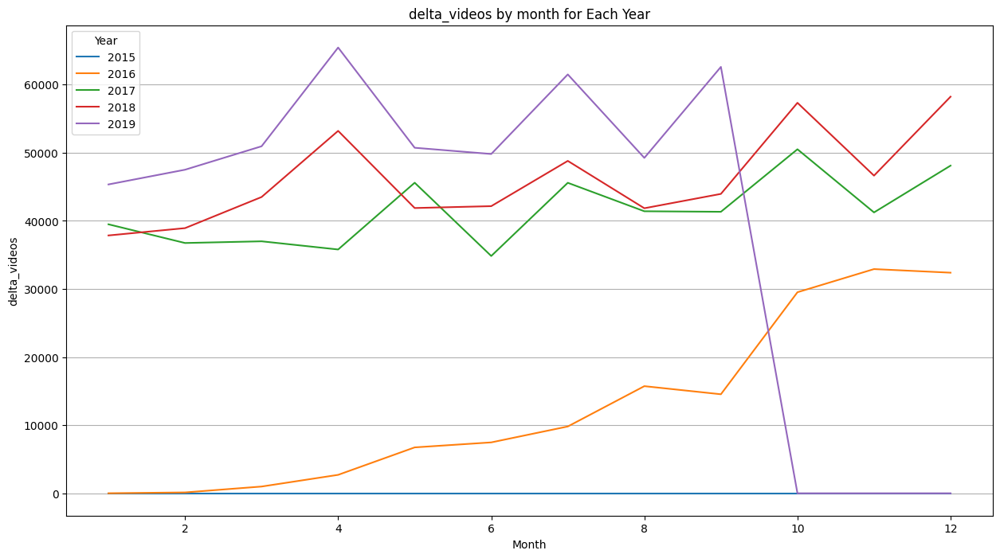

In [330]:
graph_plot_time(football_df_timeseries, "month", "delta_videos")

In [331]:
def graph_groupby_time_day_spans(df_orig, x_column):
    df = df_orig.copy()
    
    grouped_df = df.groupby(['year', 'month', 'week', 'day'])[x_column].sum().reset_index()

    # Pivot the table to have years as columns and months/days as rows
    pivot_df = grouped_df.pivot_table(index=['month', 'week', 'day'], columns='year', values=x_column, fill_value=0)

    pivot_df.plot(kind='line', figsize=(15, 8))
    plt.title(f'{x_column} by Year, Month, and Day')
    plt.xlabel('Month and Day')
    plt.ylabel(x_column)

    # do spans for american football (not 100% exact dates)
    # world cup 2018
    june_14_index = pivot_df.index.get_loc((6, 24, 12))
    july_15_index = pivot_df.index.get_loc((7, 29, 15))
    plt.axvspan(june_14_index, july_15_index, color='red', alpha=0.3, label='World Cup 2018')

    # print(pivot_df.index.get_loc((6, 24,)).start)
    # Euro 2016
    jun_10_index = pivot_df.index.get_loc((6, 23, 4))
    jul_10_index = pivot_df.index.get_loc((7, 28, 9))
    plt.axvspan(jun_10_index, jul_10_index, color='orange', alpha=0.3, label='Euro 2016')

    # UEFA Champions League
    september_17_index = pivot_df.index.get_loc((9, 37, 12))
    may_6_index = pivot_df.index.get_loc((5, 18, 2))
    plt.axvspan(september_17_index, may_6_index, color='brown', alpha=0.2, label='UEFA Champions League')

    plt.legend(title='Year')

    plt.show()

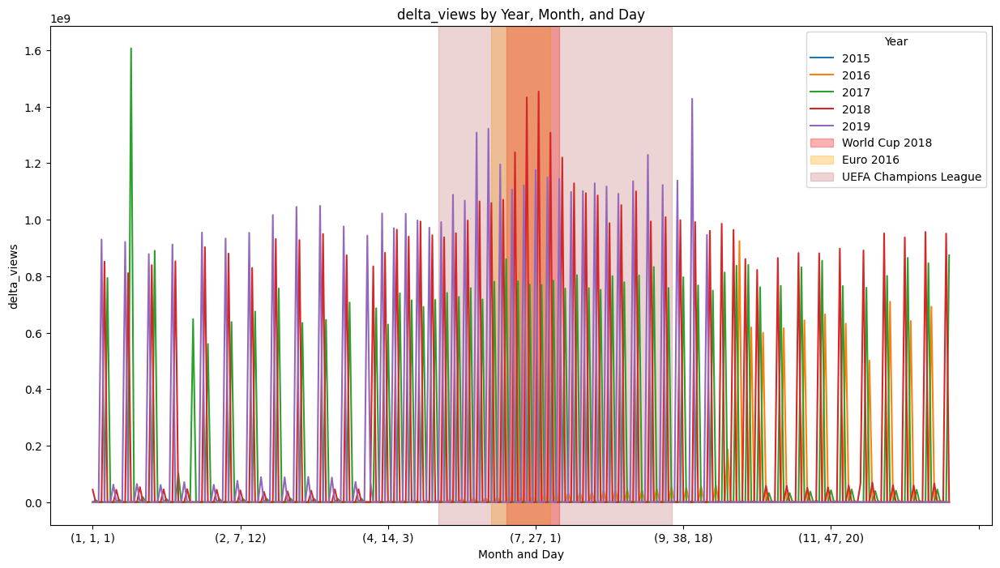

In [332]:
graph_groupby_time_day_spans(football_df_timeseries, 'delta_views')

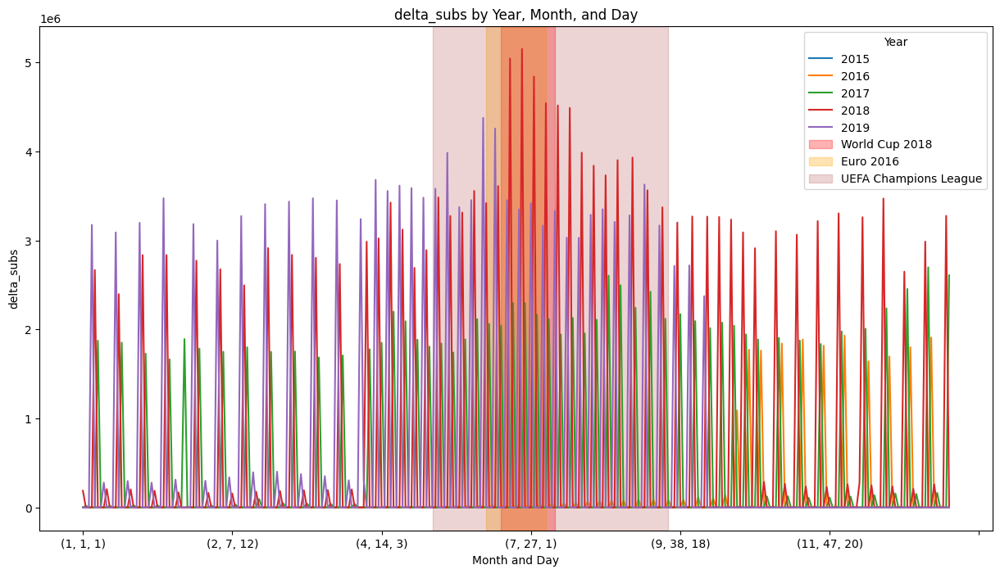

In [333]:
graph_groupby_time_day_spans(football_df_timeseries, 'delta_subs')

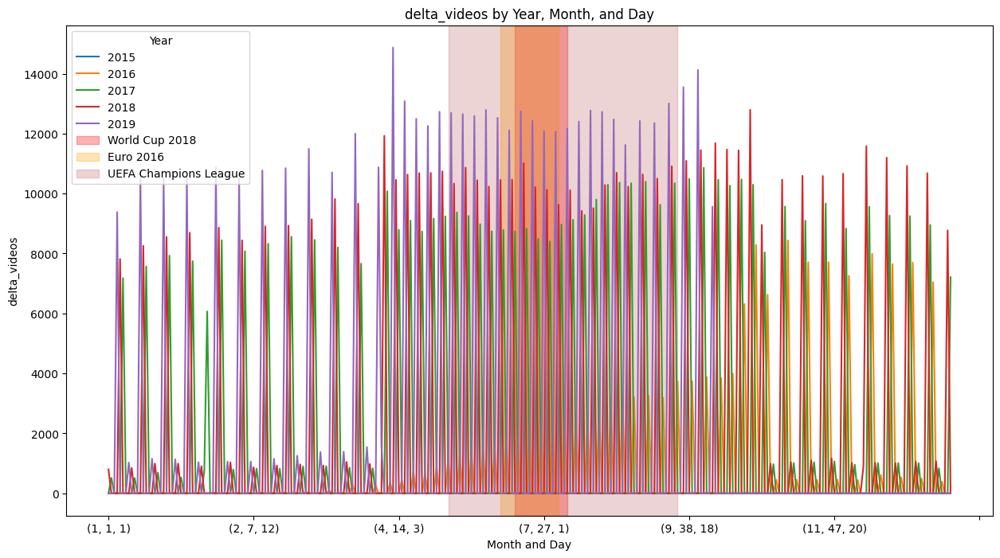

In [334]:
graph_groupby_time_day_spans(football_df_timeseries, 'delta_videos')

## Correlation matrix

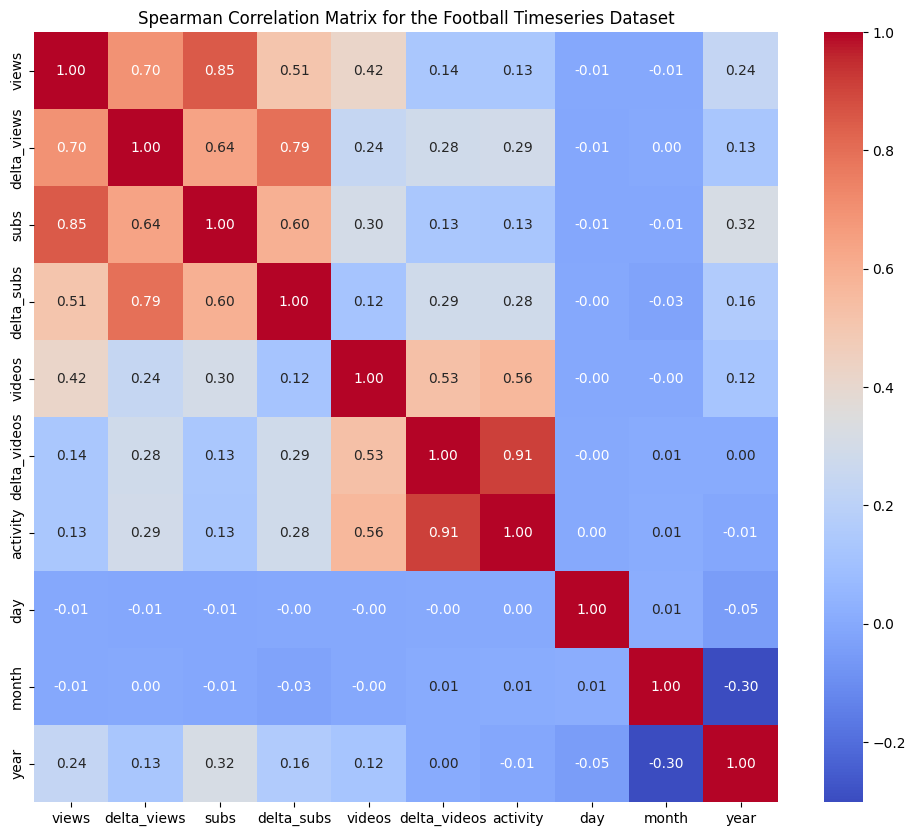

In [352]:
football_correlation_dataset = football_df_timeseries[['views', 'delta_views', 'subs', 'delta_subs', 'videos', 'delta_videos', 'activity', 'day', 'month', 'year']]

spearman_corr_matrix = football_correlation_dataset.corr(method='spearman')


plt.figure(figsize=(12, 10))
sns.heatmap(spearman_corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Spearman Correlation Matrix for the Football Timeseries Dataset')
plt.show()

## Difference in difference analysis

We want to study the effect of a treatment (an event) on a treatment group (sport football) versus a control group (non sports channels)

In [ ]:
import statsmodels.formula.api as smf

def diff_in_diff(df_orig, y_column, x_column, event_date, event_name, offset_months=4):
    # Column for event (0 before the event, 1 after the event)
    df = df_orig[[y_column, x_column, "category"]].copy()

    df.set_index(y_column, inplace=True)
    df.index = pd.to_datetime(df.index)

    # df = df.groupby(df.index.date).sum()
    # is is correct to make a sum here, or would it be better to do a mean?
    df.sort_index(inplace=True)
    df.index = pd.to_datetime(df.index)
    
    start_date = event_date - pd.DateOffset(months=offset_months)
    end_date = event_date + pd.DateOffset(months=offset_months)
    df = df[(df.index >= start_date) & (df.index <= end_date)]

    # make it weekly because we know the dataset is not perfectly weekly
    # df = df.resample('W').mean()

    df[event_name] = np.where(df.index >= event_date, 1, 0)
    df["is_sports"] = np.where(df["category"] == "Sports", 1, 0)

    # Create a new column for the interaction term
    df['interaction'] = df[event_name] * df["is_sports"]

    # Check for missing values in the variables
    print("Missing values\n", df[[x_column, 'is_sports',
          event_name, 'interaction']].isnull().sum())

    df = df.dropna(subset=[x_column, 'is_sports', event_name, 'interaction'])

    # Fit the linear regression model
    model = smf.ols(f'{x_column} ~ is_sports + {event_name} + interaction', data=df).fit()

    # Create summary for visualization
    summary = df.groupby([event_name, 'is_sports'])[
        x_column].mean().reset_index()

    summary['Group'] = summary['is_sports'].apply(
        lambda x: 'Sports' if x == 1 else 'Control')

    summary['Period'] = summary[event_name].apply(
        lambda x: 'Post-Treatment' if x == 1 else 'Pre-Treatment')
    

    # Always use orange for sports and skyblue for control
    pallete_plt = {'Sports': 'orange', 'Control': 'skyblue'}
    pallete_plt_fitted = {'Sports_fitted': 'darkorange', 'Control_fitted': 'dodgerblue'}

    # Bar Plot
    sns.barplot(x='Period', y=x_column, hue='Group', data=summary, palette=pallete_plt, hue_order=['Control', 'Sports'])
    plt.title(f'Average {x_column.replace("_", " ").capitalize()} by Group and Period')
    plt.ylabel(f'Average {x_column.replace("_", " ").capitalize()}')
    plt.show()

    # Plots are done with weekly data
    # Time Series Plot
    time_summary = df.groupby([y_column, "is_sports"])[[x_column]].mean().reset_index().copy()
    time_summary.sort_values(by=y_column, inplace=True)
    # Resample the data to weekly frequency
    time_summary_copy = time_summary.copy()
    time_summary_copy.set_index(y_column, inplace=True)
    time_summary_copy.index = pd.to_datetime(time_summary_copy.index)

    # Resample the data to weekly frequency because it isn't perfectly weekly ( we have majority of weekly data, but some are daily and others are every 6 days)
    weekly_sports = time_summary_copy[time_summary_copy['is_sports'] == 1].resample('W').mean()
    weekly_control = time_summary_copy[time_summary_copy['is_sports'] == 0].resample('W').mean()

    # Plot the resampled data
    plt.figure(figsize=(14, 7))
    plt.plot(weekly_sports.index, weekly_sports[x_column], label='Sports', marker='o', color=pallete_plt['Sports'])
    plt.plot(weekly_control.index, weekly_control[x_column], label='Control', marker='o', color=pallete_plt['Control'])
    plt.axvline(event_date, color='red', linestyle='--', label='Treatment Date')
    plt.title(f'{x_column} Over Time by Group (Weekly Resampled)')
    plt.xlabel('Date')
    plt.ylabel(f'Average {x_column.replace("_", " ").capitalize()}')
    plt.legend()
    plt.show()

    # plot model
    def plot_model_results_both_groups():
        df_model_visualize = df.copy()[[x_column]]
        df_model_visualize['fitted'] = model.fittedvalues
        df_model_visualize['residuals'] = model.resid

        df_model_visualize = df_model_visualize.groupby(df_model_visualize.index.date).sum()
        df_model_visualize.index = pd.to_datetime(df_model_visualize.index)
        df_model_visualize = df_model_visualize.resample('W').mean()


        plt.figure(figsize=(12, 6))
        plt.plot(df_model_visualize.index, df_model_visualize[x_column], label='Actual')
        plt.plot(df_model_visualize.index, df_model_visualize['fitted'], label='Fitted', linestyle='--')
        plt.axvline(event_date, color='red', linestyle='--', label='Event Date')
        plt.title(f'Difference in Difference Analysis: {event_name}')
        plt.xlabel('Date')
        plt.ylabel(x_column.replace('_', ' ').capitalize())
        plt.legend()
        plt.show()

    def plot_model_results_group_and_control():
        df_control = df[df['is_sports'] == 0].copy()
        df_sports = df[df['is_sports'] == 1].copy()

        # Do predictions with the model for both groups
        df_control['fitted'] = model.predict(df_control)
        df_sports['fitted'] = model.predict(df_sports)

        df_control = df_control[[x_column, 'fitted']]
        df_sports = df_sports[[x_column, 'fitted']]

        df_control.groupby(df_control.index.date).sum()
        df_control.index = pd.to_datetime(df_control.index)
        df_control = df_control.resample('W').mean()

        df_sports.groupby(df_sports.index.date).sum()
        df_sports.index = pd.to_datetime(df_sports.index)
        df_sports = df_sports.resample('W').mean()

        plt.figure(figsize=(12, 6))
        plt.plot(df_control.index, df_control[x_column], label='Control Actual', color=pallete_plt['Control'])
        plt.plot(df_control.index, df_control['fitted'], label='Control Fitted', linestyle='--', color=pallete_plt_fitted['Control_fitted'])

        plt.plot(df_sports.index, df_sports[x_column], label='Sports Actual', color=pallete_plt['Sports'])
        plt.plot(df_sports.index, df_sports['fitted'], label='Sports Fitted', linestyle='--', color=pallete_plt_fitted['Sports_fitted'])
        plt.axvline(event_date, color='red', linestyle='--', label='Event Date')
        plt.title(f'Difference in Difference Analysis: {event_name}')
        plt.xlabel('Date')
        plt.ylabel(x_column.replace('_', ' ').capitalize())
        plt.legend()
        plt.show()

    # box plot pre vs post
    def box_plot_pre_vs_post():
        df_boxplot = df.copy()
        df_boxplot['Period'] = df_boxplot[event_name].apply(
            lambda x: 'Post-Treatment' if x == 1 else 'Pre-Treatment')
        
        pallete_plt = {0: 'skyblue', 1: 'orange'} # 0 is control, 1 is sports

        plt.figure(figsize=(8, 6))
        sns.boxplot(x="Period", y=x_column, hue='is_sports', data=df_boxplot, palette=pallete_plt)
        plt.title('Boxplot of Delta Views by Group and Period')
        plt.ylabel('Delta Views')
        plt.show()

    # plot the difference in difference bars
    def difference_bars():
        df_diff_visualize = df.copy()[[x_column, 'is_sports']]
        df_diff_visualize['fitted'] = model.fittedvalues

        # difference of pre-event and post-event for control and sports
        control_diff = df_diff_visualize[(df_diff_visualize["is_sports"] == 0) & (df_diff_visualize.index < event_date)][x_column].mean() - df_diff_visualize[(df_diff_visualize["is_sports"] == 0) & (df_diff_visualize.index >= event_date)][x_column].mean()

        sports_diff = df_diff_visualize[(df_diff_visualize["is_sports"] == 1) & (df_diff_visualize.index < event_date)][x_column].mean() - df_diff_visualize[(df_diff_visualize["is_sports"] == 1) & (df_diff_visualize.index >= event_date)][x_column].mean()


        diff_in_diff_values = sports_diff - control_diff

        plt.figure(figsize=(10, 8))
        plt.bar(['Control', 'Sports'], [control_diff, sports_diff], color=[pallete_plt['Control'], pallete_plt['Sports']])
        plt.title(f'Difference in {x_column.capitalize()} Change (Pre vs. Post) "Negative values indicate an increase after the event"')
        plt.ylabel(f'Change in Average {x_column.capitalize()}')
        plt.xlabel('Group')
        plt.axhline(0, color='black', linewidth=0.8)
        plt.show()
    
    plot_model_results_both_groups()
    plot_model_results_group_and_control()
    box_plot_pre_vs_post()
    difference_bars()

    print(model.summary())

    print(f"P-values: {model.pvalues}")

    return model

Missing values
 delta_views       0
is_sports         0
World_Cup_2018    0
interaction       0
dtype: int64


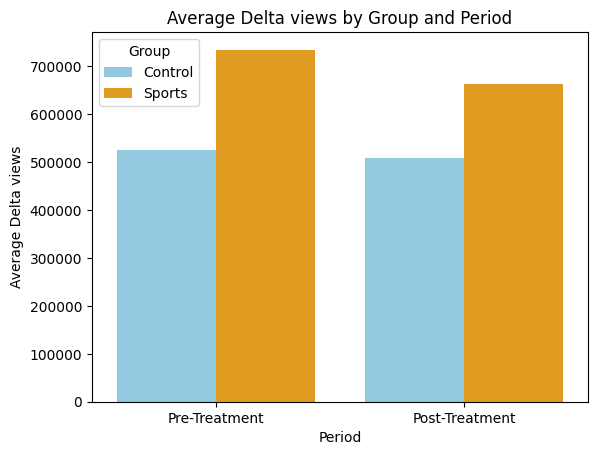

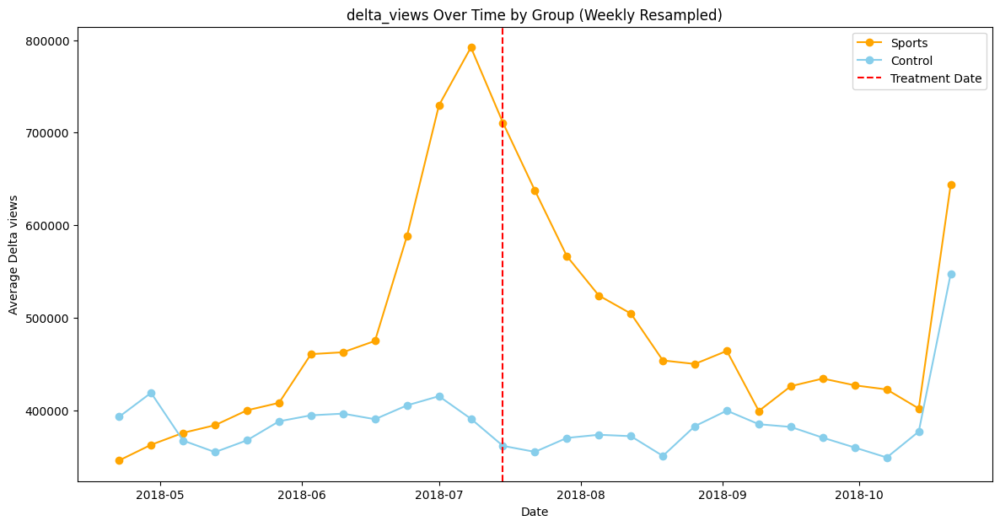

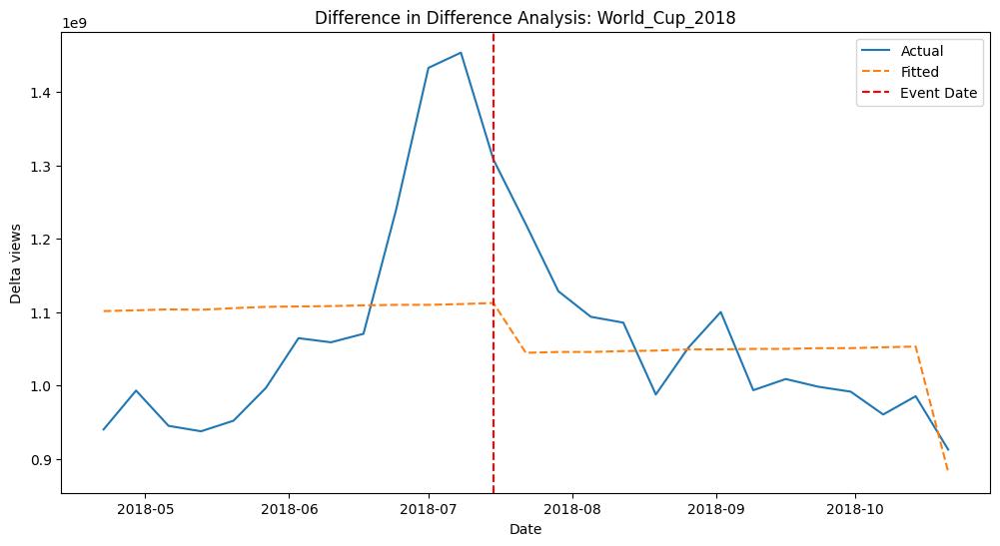

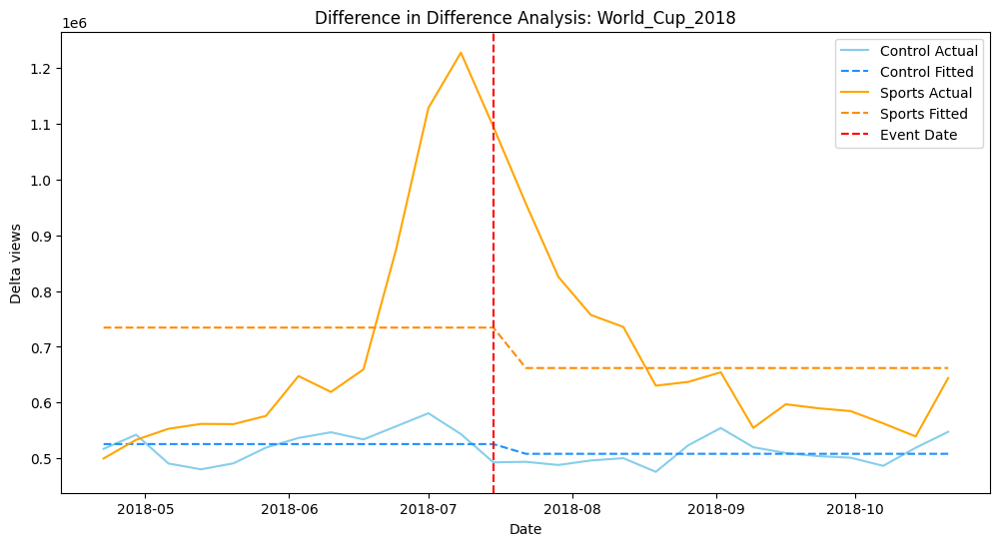

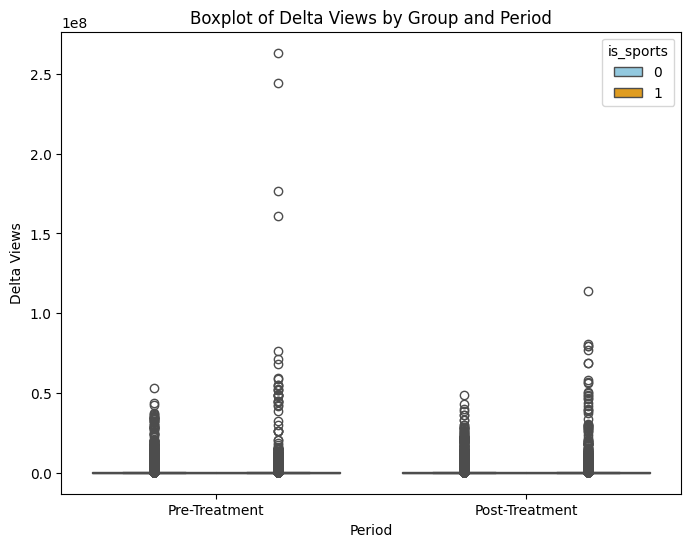

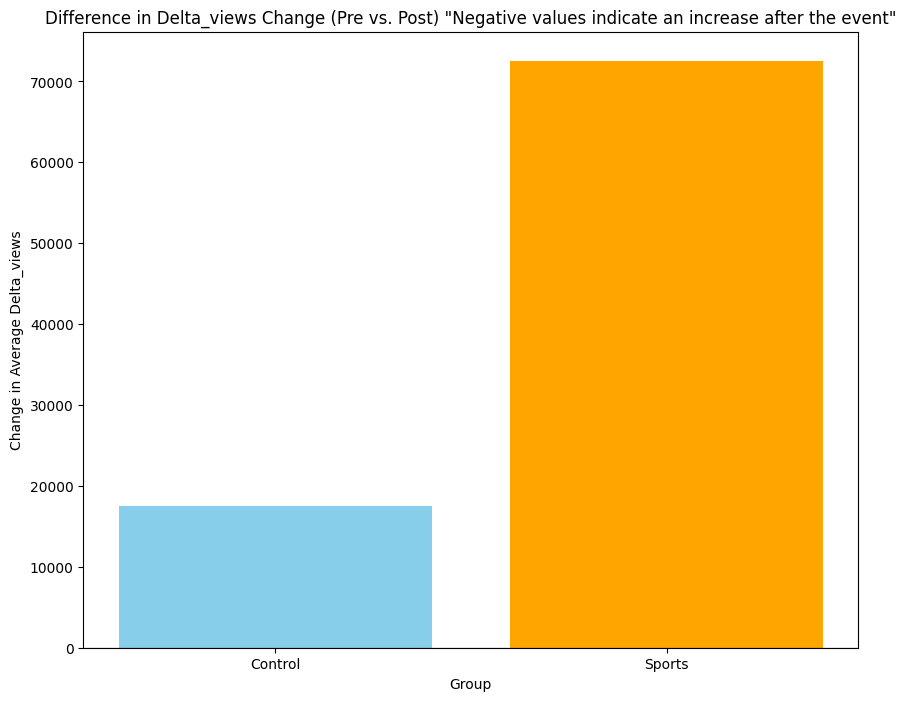

                            OLS Regression Results                            
Dep. Variable:            delta_views   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     12.65
Date:                Thu, 14 Nov 2024   Prob (F-statistic):           2.91e-08
Time:                        20:31:15   Log-Likelihood:            -8.1791e+05
No. Observations:               49856   AIC:                         1.636e+06
Df Residuals:                   49852   BIC:                         1.636e+06
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept       5.256e+05   2.58e+04     20.

In [470]:
diff_in_diff_model = diff_in_diff(football_df_timeseries, 'datetime', 'delta_views', pd.to_datetime('2018-07-15'), 'World_Cup_2018', 3)


Missing values
 delta_views     0
is_sports       0
Eurocup_2016    0
interaction     0
dtype: int64


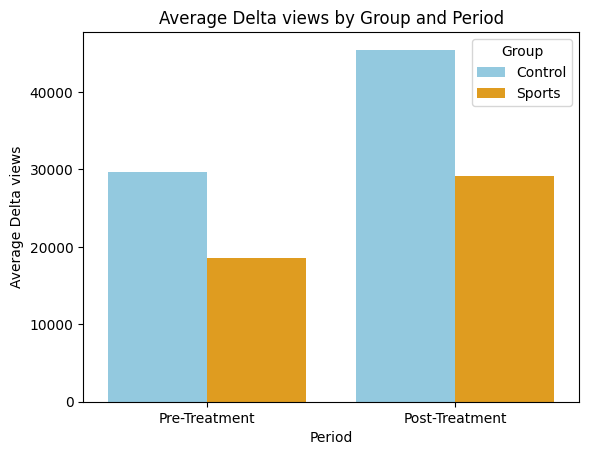

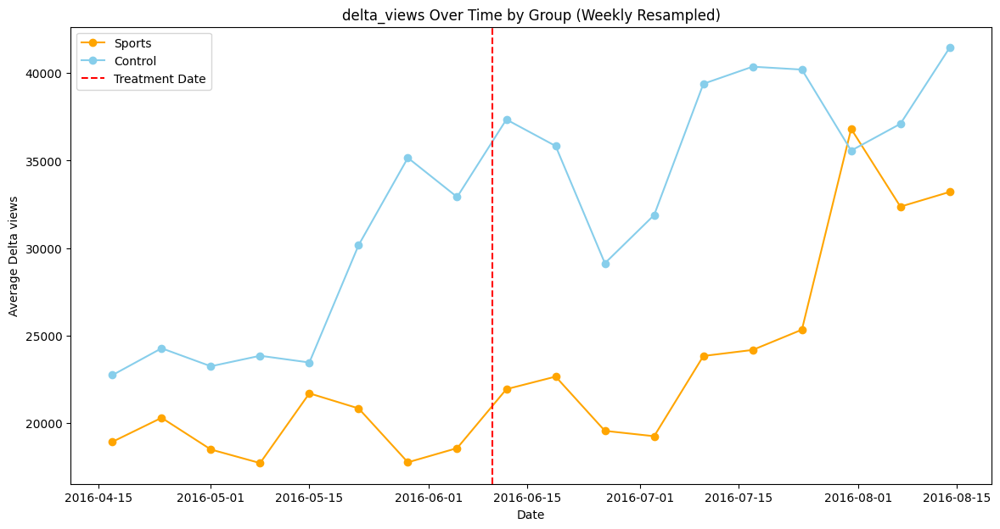

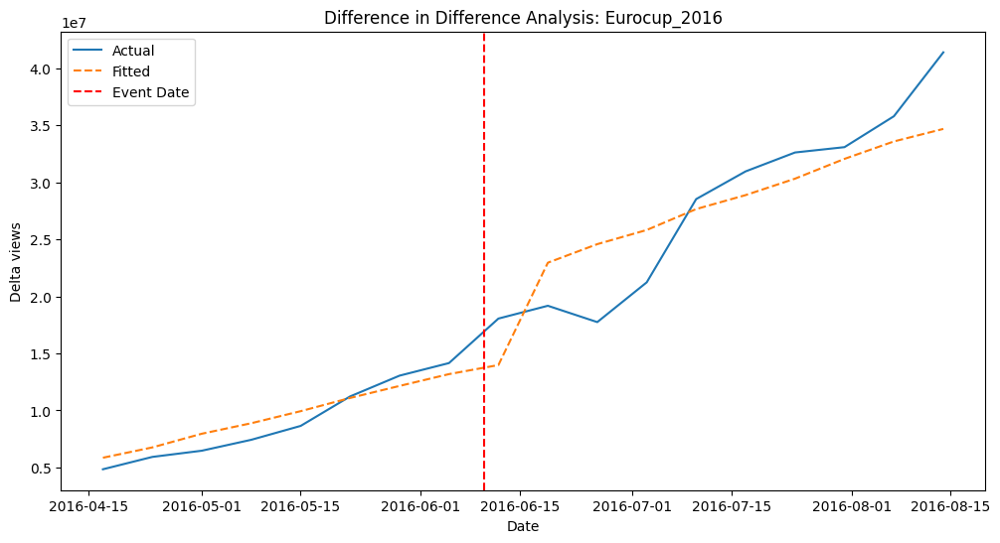

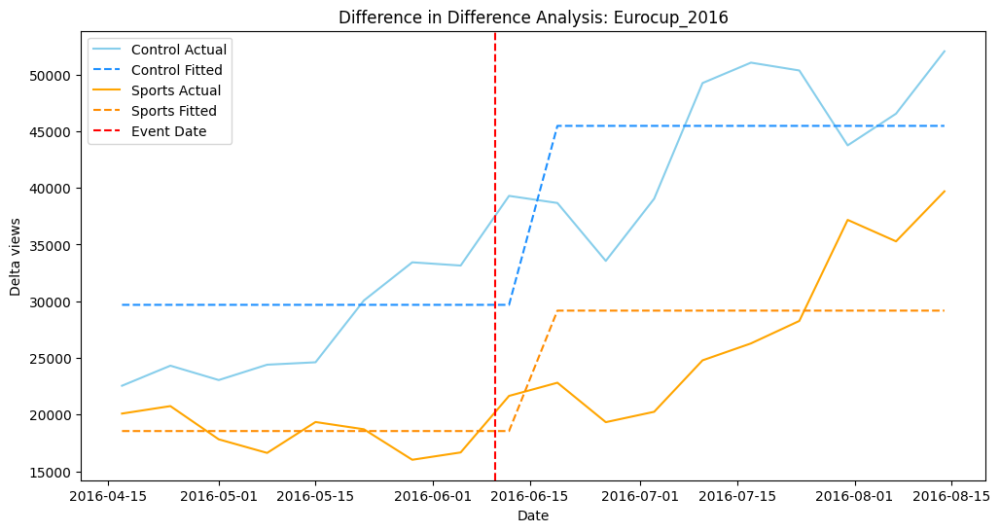

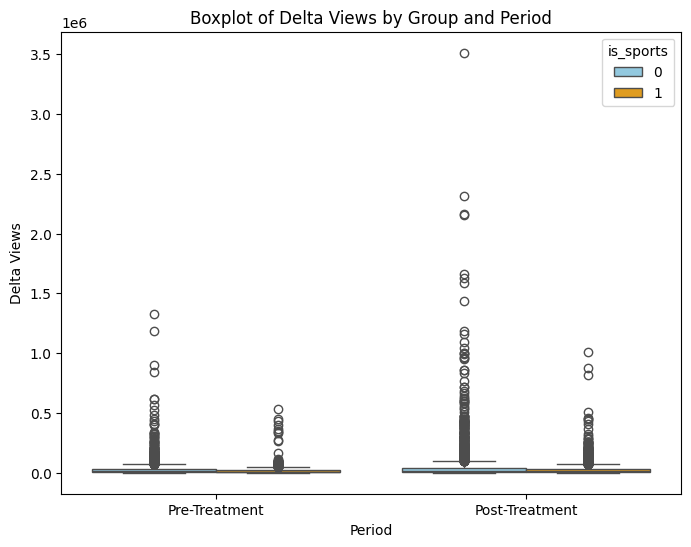

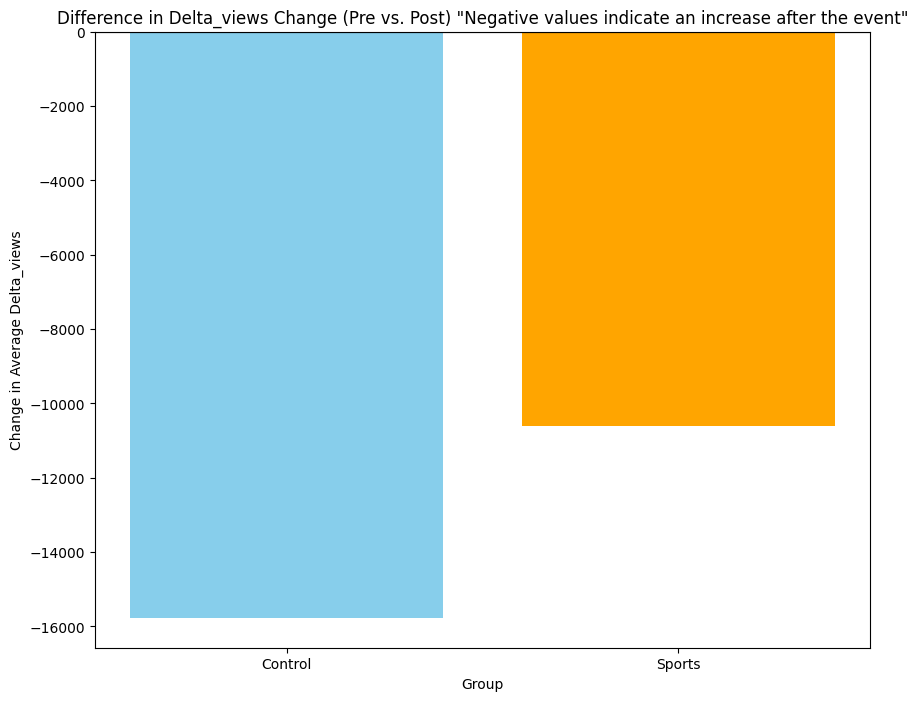

                            OLS Regression Results                            
Dep. Variable:            delta_views   R-squared:                       0.010
Model:                            OLS   Adj. R-squared:                  0.010
Method:                 Least Squares   F-statistic:                     32.56
Date:                Thu, 14 Nov 2024   Prob (F-statistic):           6.23e-21
Time:                        20:31:37   Log-Likelihood:            -1.2659e+05
No. Observations:                9829   AIC:                         2.532e+05
Df Residuals:                    9825   BIC:                         2.532e+05
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept     2.968e+04   1926.779     15.405   

In [471]:
diff_in_diff_model = diff_in_diff(football_df_timeseries, 'datetime', 'delta_views', pd.to_datetime('2016-06-10'), 'Eurocup_2016', 2)

# Difference in difference analysis for sports events
Difference in difference analysis on the whole timeseries dataset. We do an analysis on a treatment group (sport category) and a control group (non sport category) to see the effect of a sport event on the sport category.

2017-01

- NFL Playoffs – Key games leading up to the Super Bowl took place throughout January, engaging American football fans.
- Australian Open (Tennis) – Began on January 16, 2017; this Grand Slam tournament attracted significant global attention, especially with stars like Roger Federer and - Serena Williams competing.
- Transfer Window (Soccer) – The European soccer transfer window in January spurred rumors, analysis, and updates that are popular on sports channels.

2017-05

- UEFA Champions League Semifinals and Final – The semifinals concluded in early May, leading up to the final on June 3, with intense interest in teams like Real Madrid and Juventus.
- NBA Playoffs – The NBA playoffs were in full swing, capturing fans’ attention as teams competed to reach the Finals.
- Stanley Cup Playoffs (NHL) – The NHL playoffs were also ongoing, especially popular in North America.
- French Open (Tennis) – Started on May 28, 2017, kicking off another Grand Slam event that attracts global tennis fans.
- Formula 1 Monaco Grand Prix – Held on May 28, 2017, one of the most prestigious races in F1, drawing significant viewership

2017-10

- MLB World Series – The playoffs led to the World Series starting on October 24, 2017, with the Houston Astros ultimately winning against the Los Angeles Dodgers. Baseball fans were highly engaged during this period.
- NFL Regular Season – The NFL season was in full swing, drawing considerable attention in the U.S. as games intensified. NBA Season Start – The 2017-18 NBA season began on October 17, 2017, bringing excitement as fans followed opening games and team dynamics.
- NHL Regular Season – The NHL season had just started in early October, engaging hockey fans.
- European Soccer Leagues – Major European leagues, such as the English Premier League, La Liga, and Serie A, were well underway, generating global viewership and content around matches and player performance.

2018-04

- UEFA Champions League Quarterfinals – Big matches, like Manchester United vs. Barcelona, attracted global attention.
- NBA Playoffs Start – Began on April 13, engaging basketball fans.
- Masters Tournament – Tiger Woods won his first major in over a decade, creating huge buzz.
- MLB Season Kickoff – Early regular-season games for baseball fans.

2018-07
- FIFA World Cup Final: The final match of the FIFA World Cup in Russia took place on July 15, 2018, with France defeating Croatia.
- Wimbledon Finals: The Wimbledon tennis tournament concluded in July, with the finals happening on July 14 (women’s singles) and July 15 (men’s singles).
- Tour de France: The Tour de France began on July 7, 2018, and continued through the rest of the month.

2018-10

- MLB World Series – The playoffs led to the World Series starting on October 23, 2018, with the Boston Red Sox ultimately defeating the Los Angeles Dodgers. - This event attracts a lot of engagement from baseball fans.
- NFL Regular Season – The NFL season was in full swing, with fans closely following games and team performances.
- NBA Season Start – The 2018-19 NBA season began on October 16, 2018, bringing excitement as fans tuned in to watch opening games and new player lineups.
- NHL Regular Season – The NHL season also started in early October.
- European Soccer Leagues – Major European leagues, including the Premier League, La Liga, and Serie A, were in full action, with popular matches generating high viewership worldwide.

2019-04

- UEFA Champions League Quarterfinals – High-stakes matches, such as Manchester United vs. Barcelona and Tottenham vs. Manchester City, attracted global attention.
- NBA Playoffs Start – Began on April 13, 2019, engaging basketball fans eager to follow the postseason action.
- Masters Tournament (Golf) – From April 11 to April 14, 2019, Tiger Woods won his first major in over a decade, a historic victory that created significant media buzz.
- Start of MLB Season – The early regular season was underway, engaging baseball fans.
- Formula 1 Races – The Chinese Grand Prix on April 14, 2019, marked the 1000th race in F1 history, drawing attention from motorsports fans.


Olympics

- Rio 2016 Summer Olympics – The 2016 Summer Olympics in Rio de Janeiro, Brazil, took place from August 5 to August 21, 2016. (a small spike can be seen)
- PyeongChang 2018 Winter Olympics – The 2018 Winter Olympics in PyeongChang, South Korea, were held from February 9 to February 25, 2018. (no spikes can be seen)

## Football

### World cup 2018

#### Last match in World cup 2018 July 15, 2018

Last match in World Cup 2018 July 15th, 2018

Missing values
 delta_views       0
is_sports         0
World_Cup_2018    0
interaction       0
dtype: int64


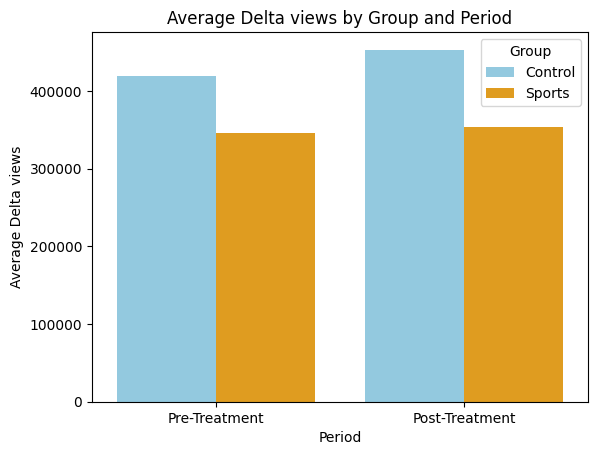

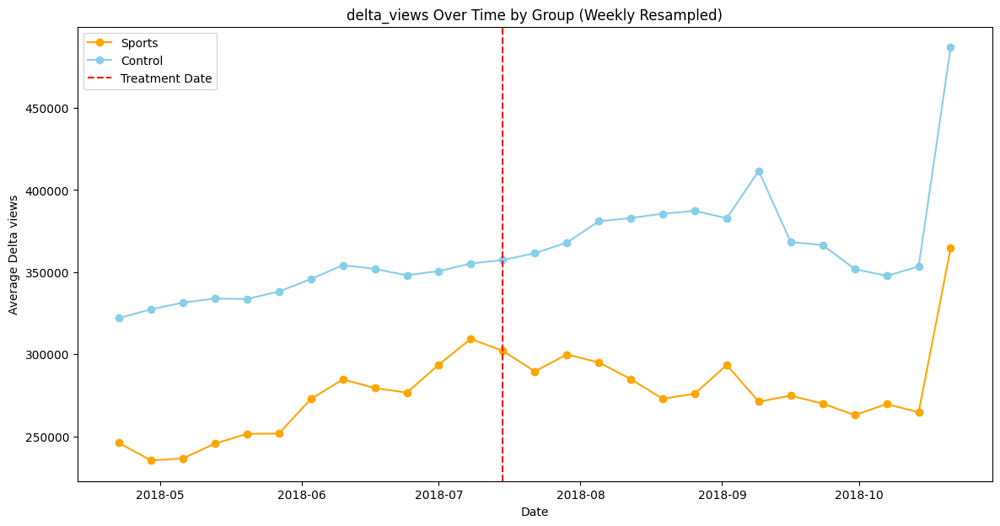

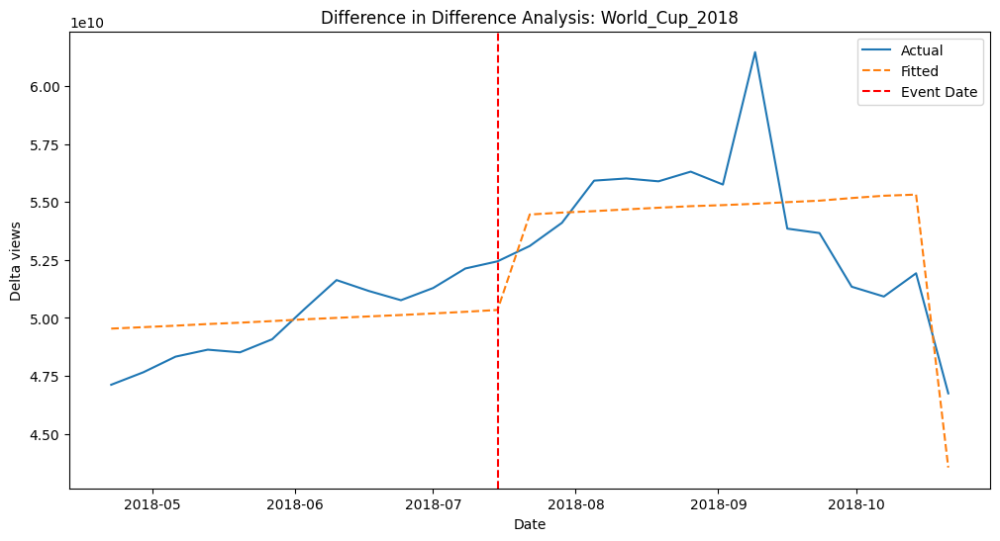

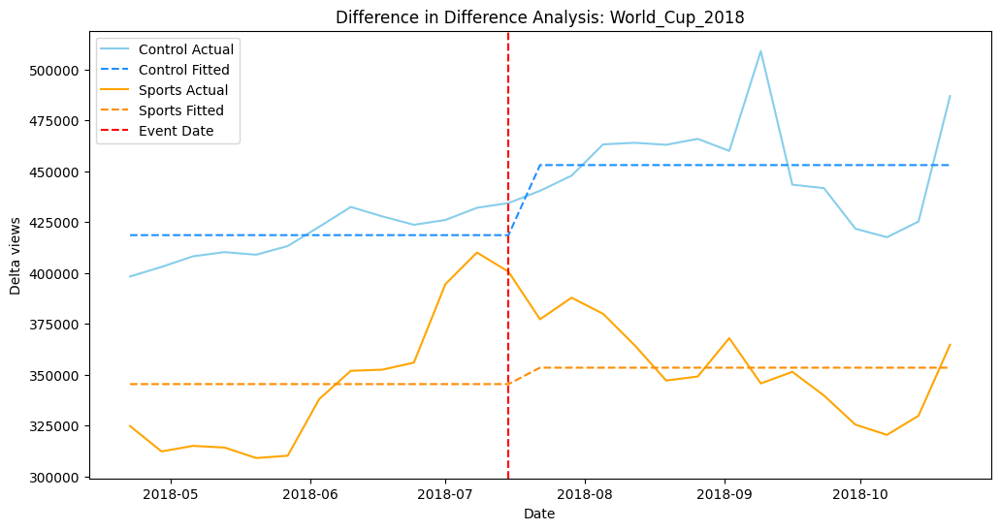

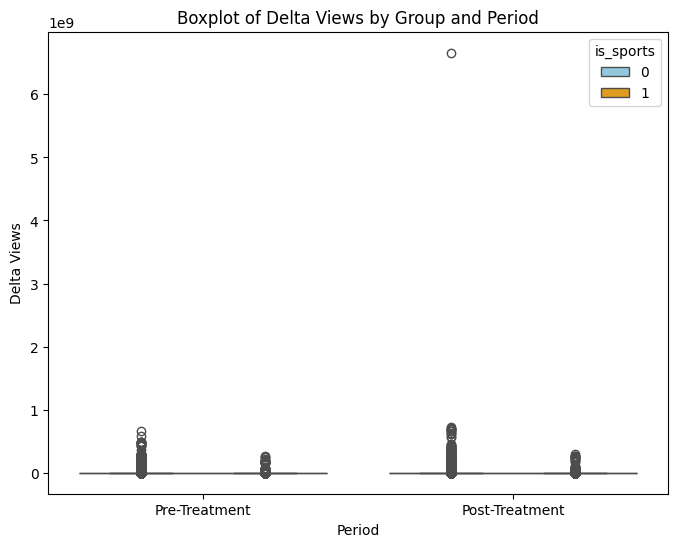

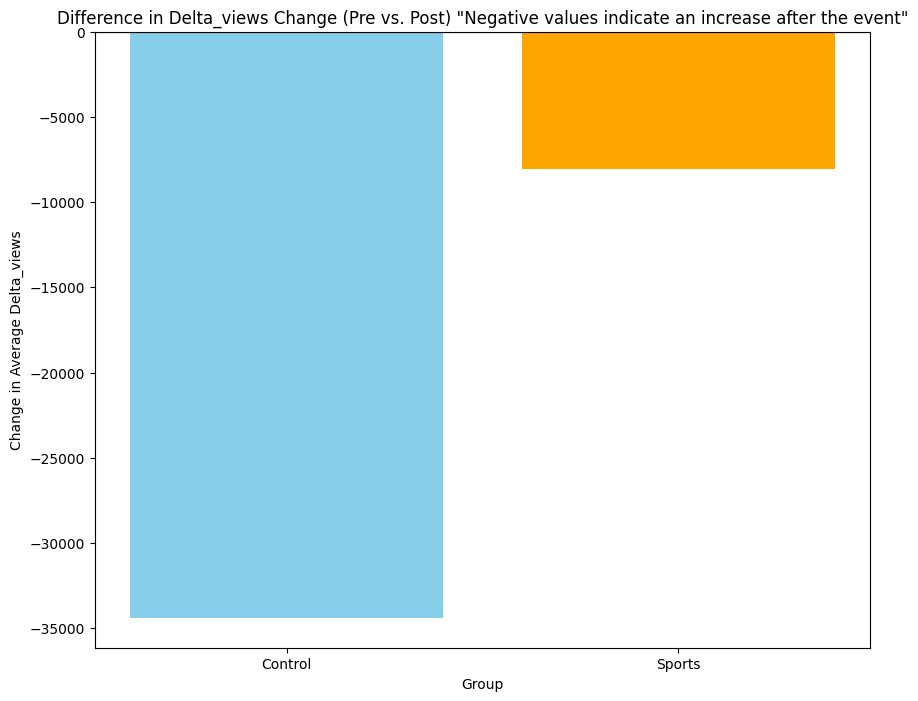

                            OLS Regression Results                            
Dep. Variable:            delta_views   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     22.60
Date:                Thu, 14 Nov 2024   Prob (F-statistic):           1.26e-14
Time:                        21:48:53   Log-Likelihood:            -5.4846e+07
No. Observations:             3247527   AIC:                         1.097e+08
Df Residuals:                 3247523   BIC:                         1.097e+08
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept       4.185e+05   4269.539     98.

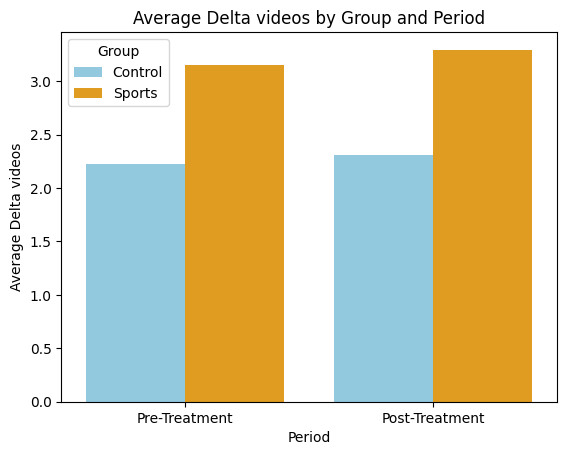

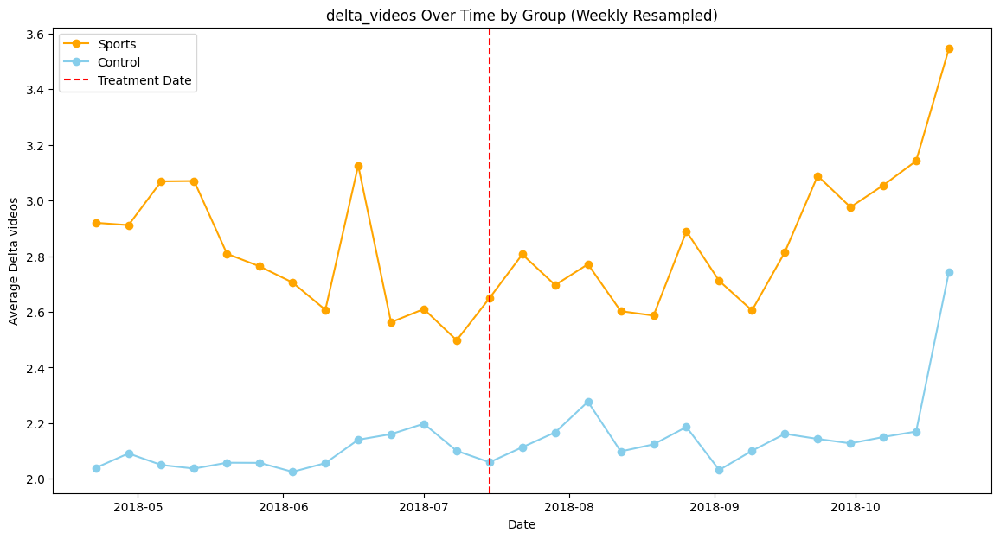

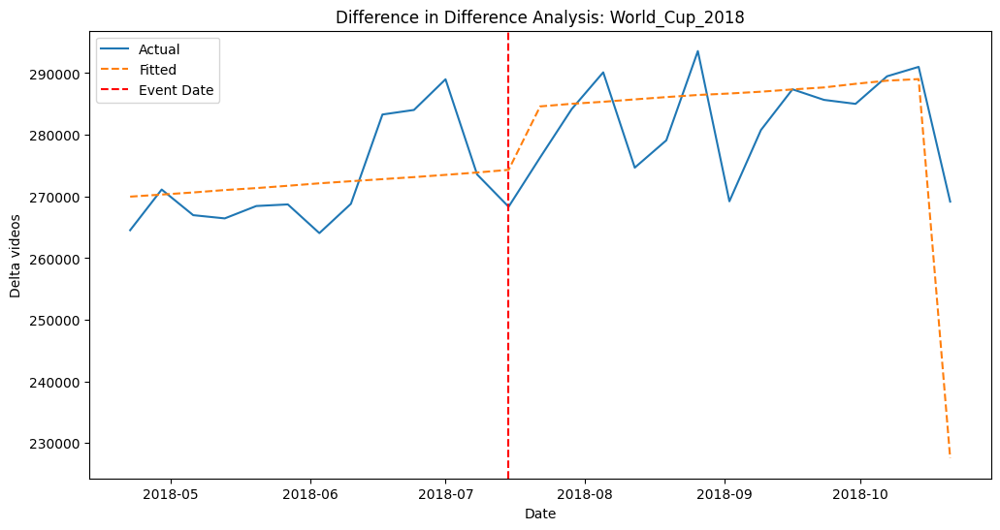

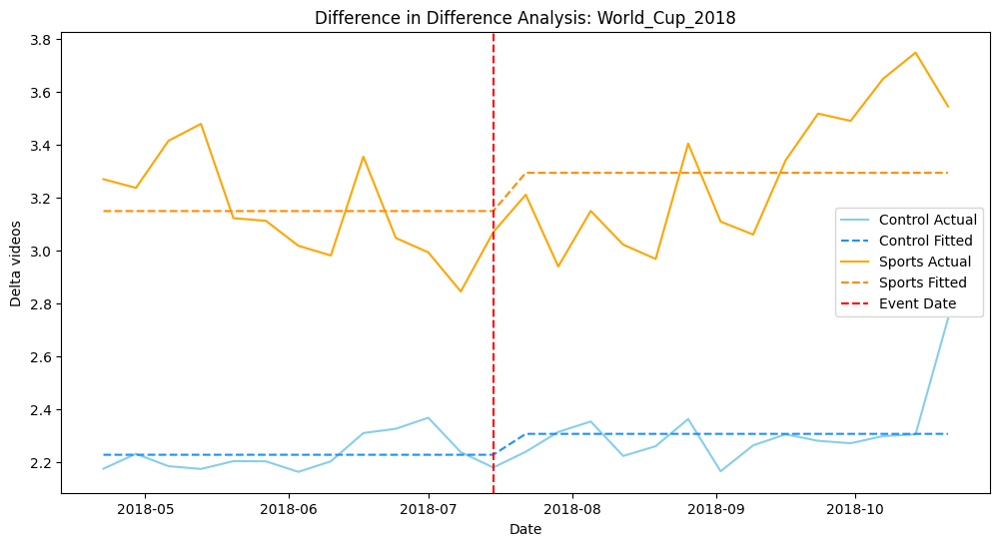

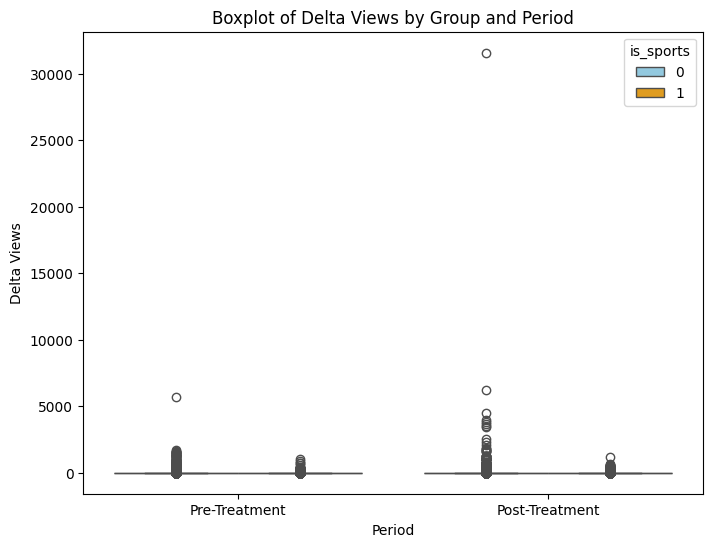

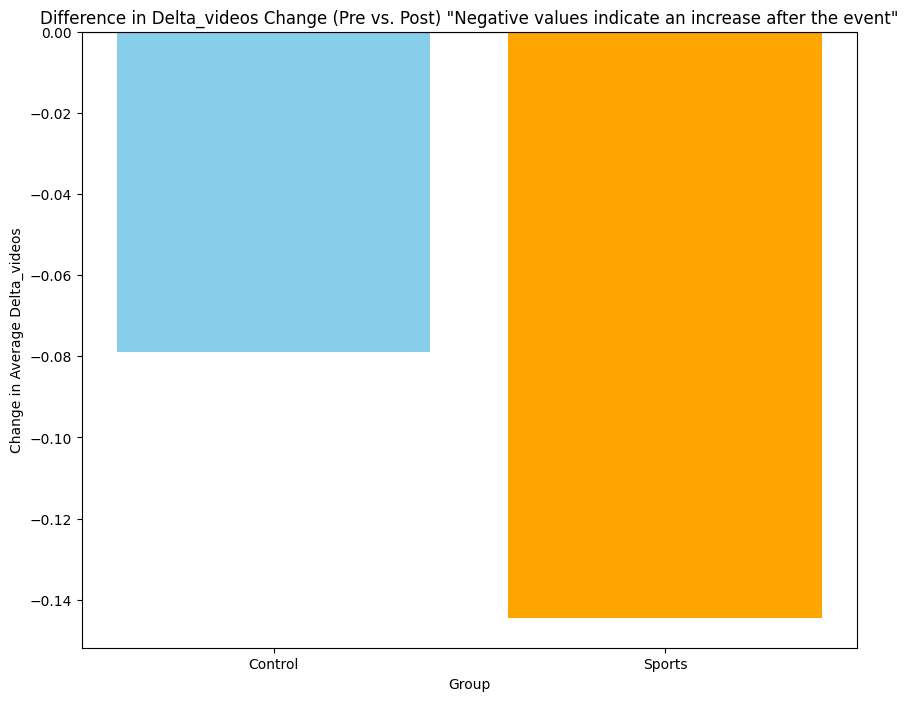

                            OLS Regression Results                            
Dep. Variable:           delta_videos   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     75.95
Date:                Thu, 14 Nov 2024   Prob (F-statistic):           4.03e-49
Time:                        21:49:02   Log-Likelihood:            -1.4752e+07
No. Observations:             3247527   AIC:                         2.950e+07
Df Residuals:                 3247523   BIC:                         2.950e+07
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept          2.2286      0.019    120.

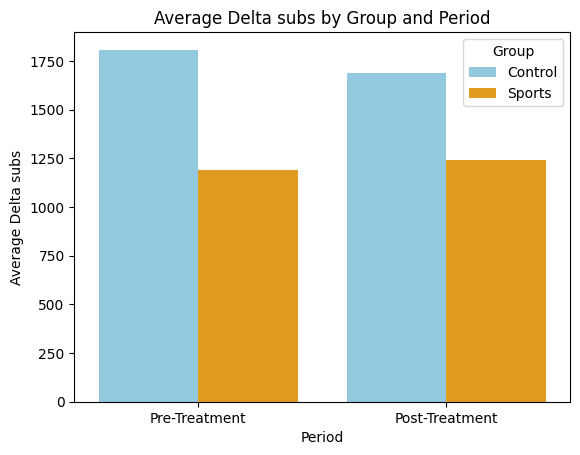

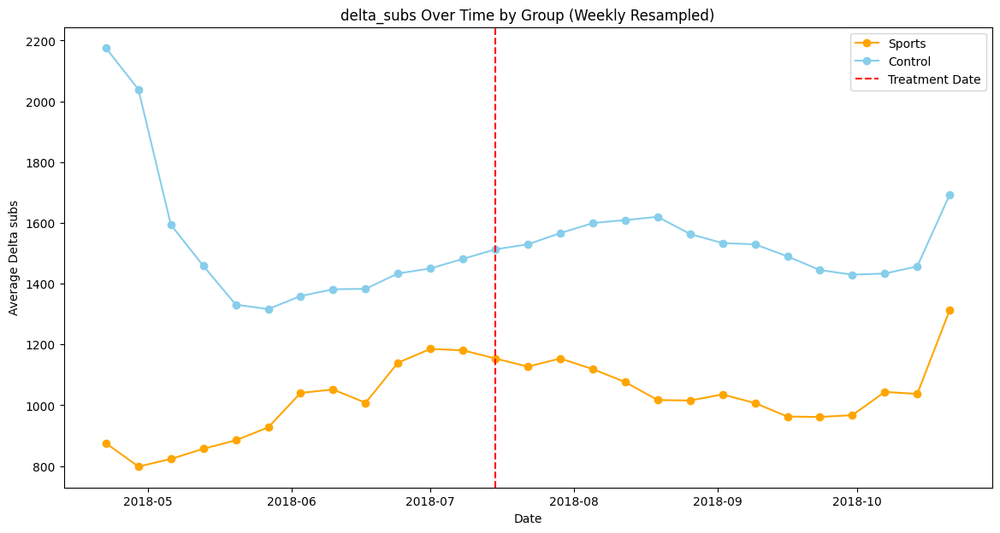

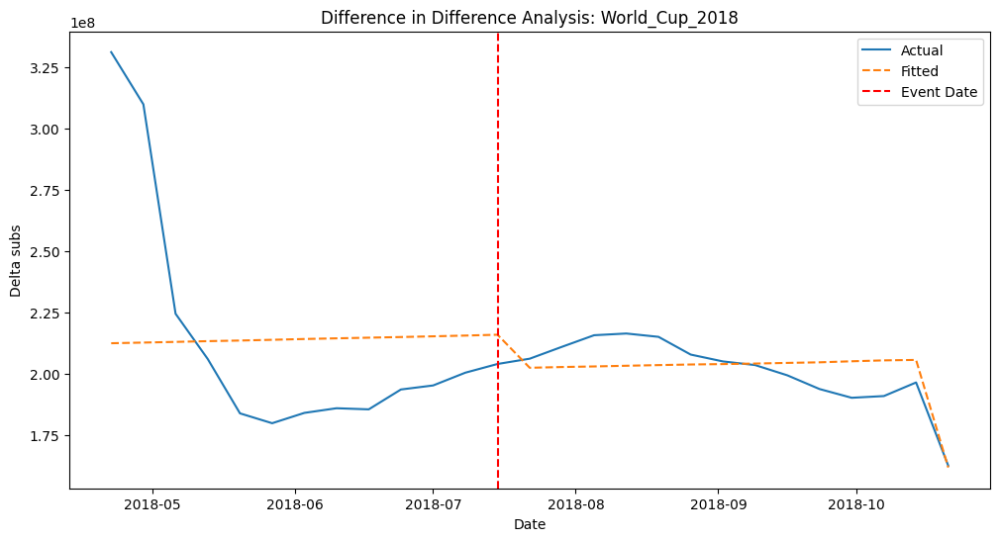

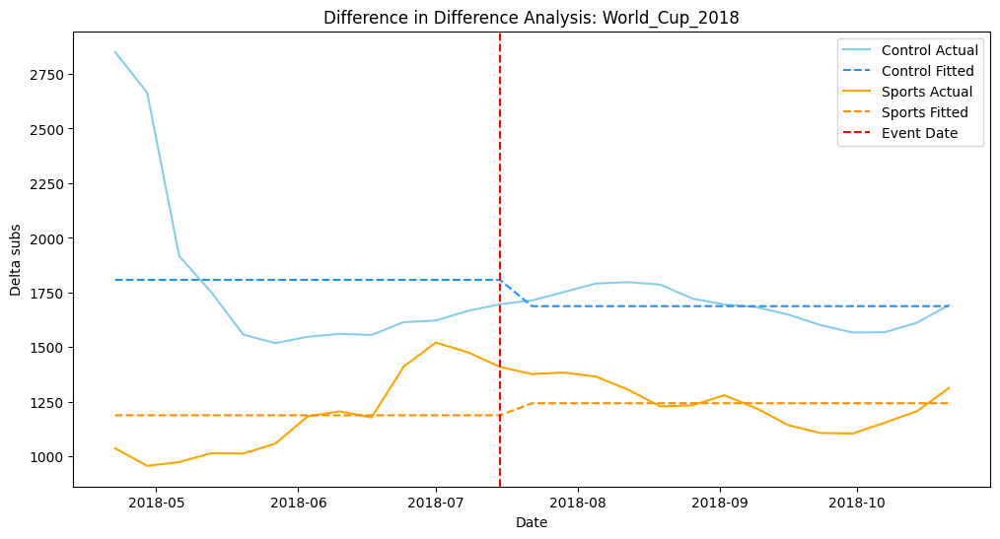

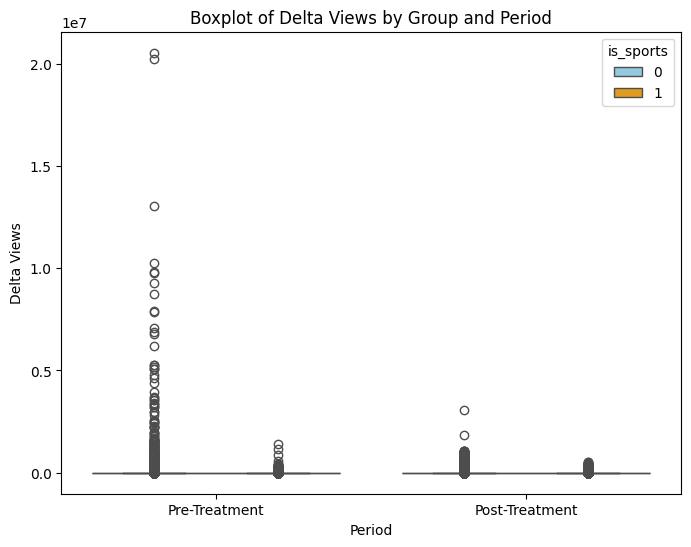

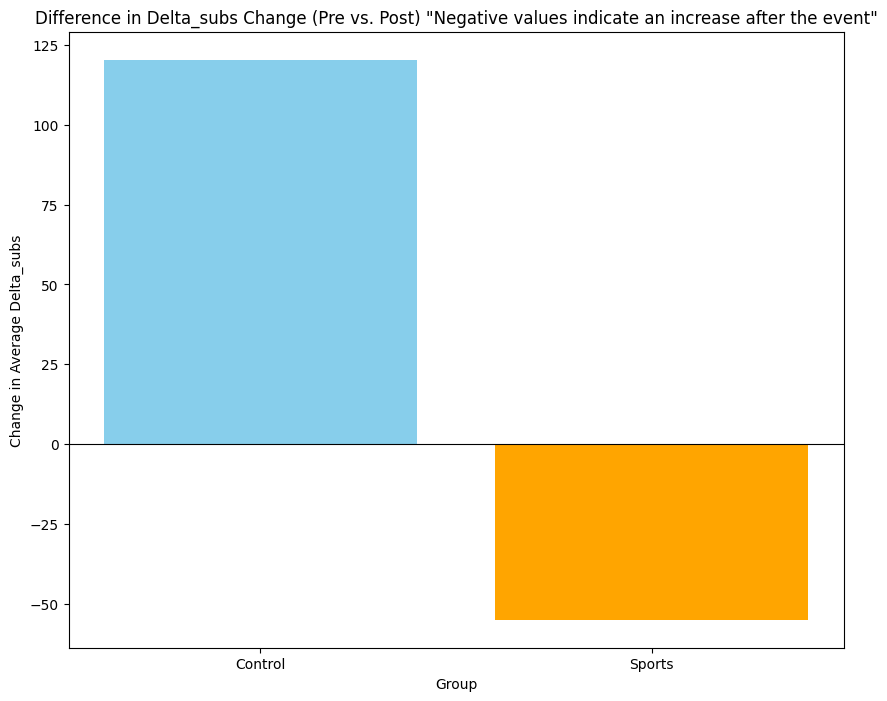

                            OLS Regression Results                            
Dep. Variable:             delta_subs   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     18.76
Date:                Thu, 14 Nov 2024   Prob (F-statistic):           3.68e-12
Time:                        21:49:11   Log-Likelihood:            -3.7921e+07
No. Observations:             3247527   AIC:                         7.584e+07
Df Residuals:                 3247523   BIC:                         7.584e+07
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept       1808.1619     23.275     77.

In [479]:
print("Last match in World Cup 2018 July 15th, 2018\n")
diff_in_diff_model = diff_in_diff(df, 'datetime', 'delta_views', pd.to_datetime('2018-07-15'), 'World_Cup_2018', 3)

diff_in_diff_model = diff_in_diff(df, 'datetime', 'delta_videos', pd.to_datetime('2018-07-15'), 'World_Cup_2018', 3)

diff_in_diff_model = diff_in_diff(df, 'datetime', 'delta_subs', pd.to_datetime('2018-07-15'), 'World_Cup_2018', 3)

#### First match in World cup 2018 June 14, 2018


First match in World Cup 2018 June 14th, 2018

Missing values
 delta_views       0
is_sports         0
World_Cup_2018    0
interaction       0
dtype: int64


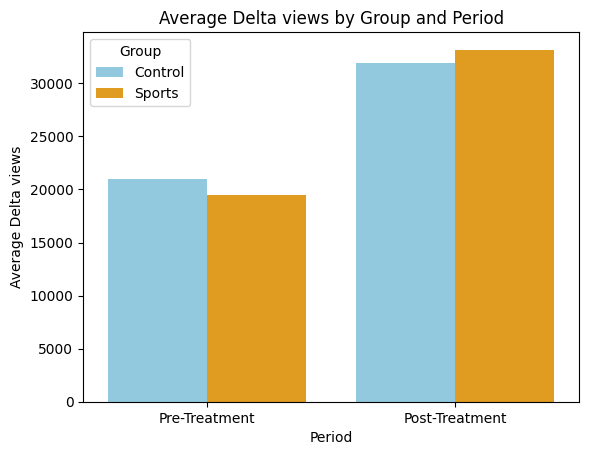

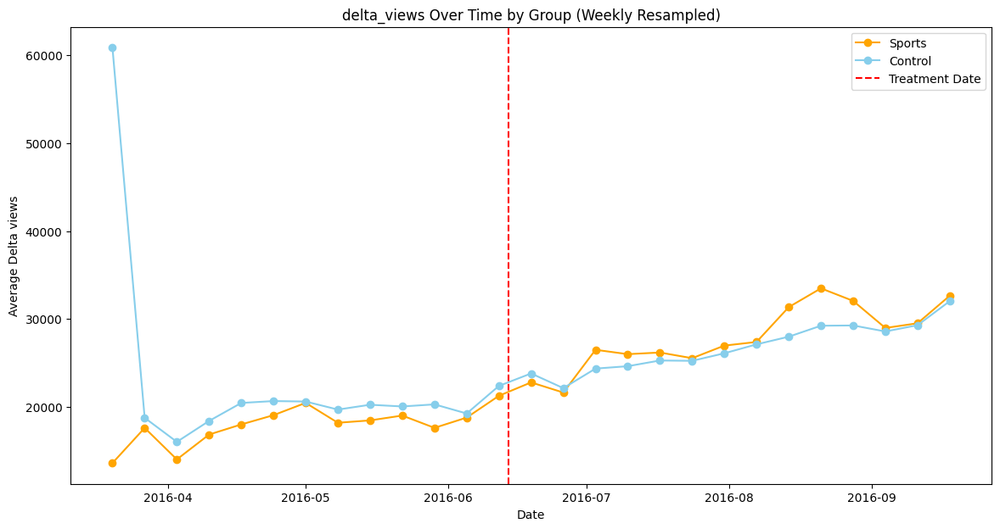

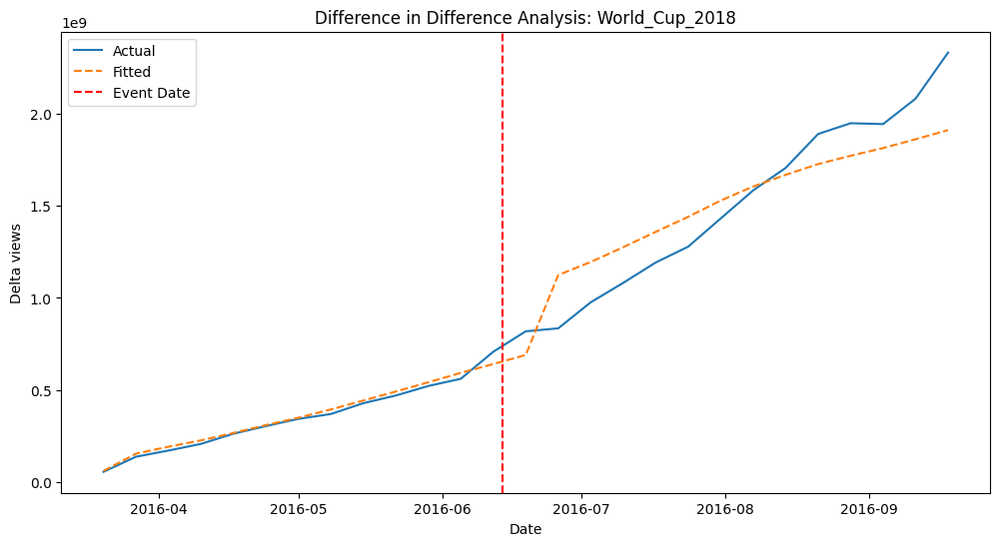

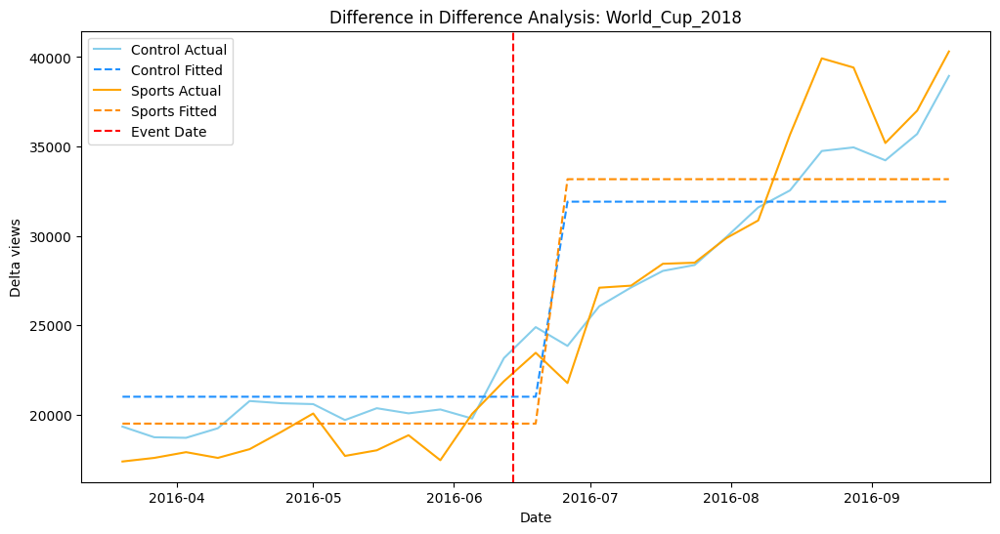

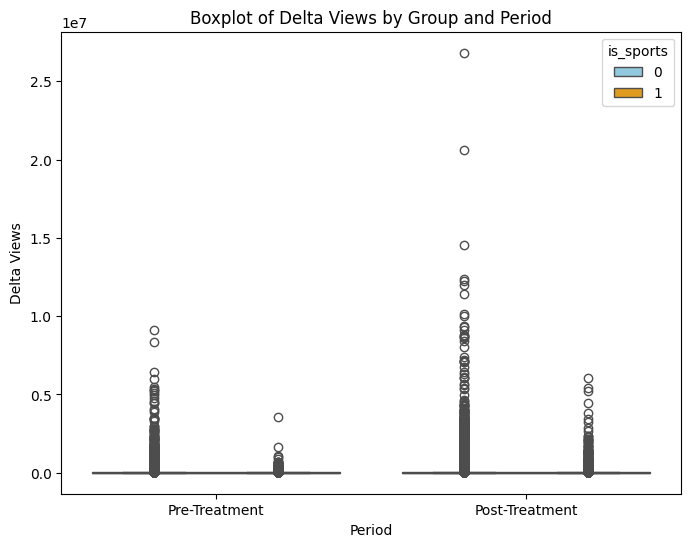

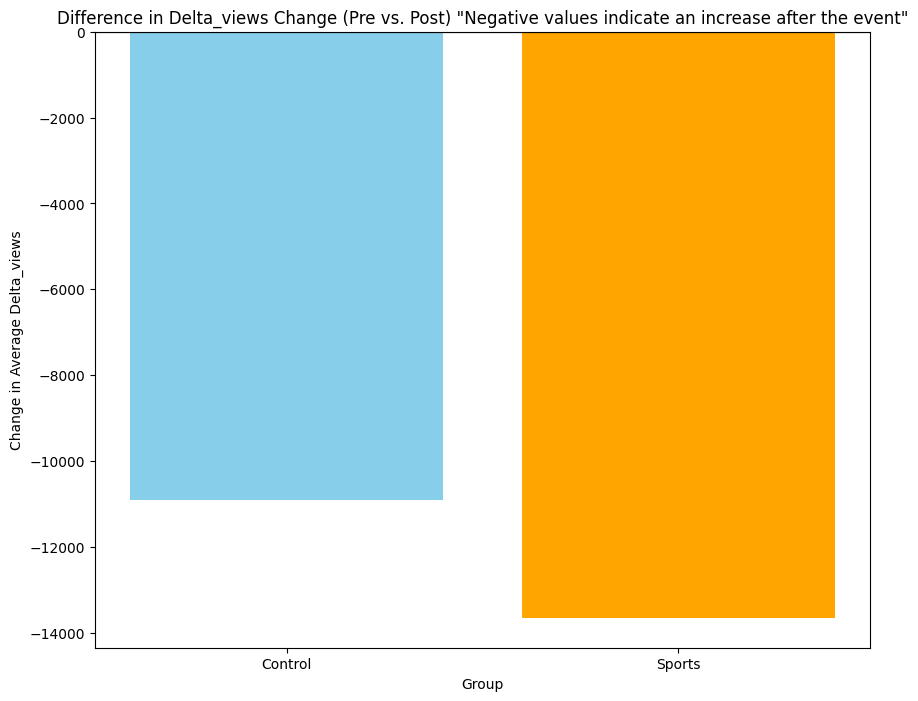

                            OLS Regression Results                            
Dep. Variable:            delta_views   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                  0.002
Method:                 Least Squares   F-statistic:                     683.9
Date:                Thu, 14 Nov 2024   Prob (F-statistic):               0.00
Time:                        21:49:16   Log-Likelihood:            -1.1587e+07
No. Observations:              892838   AIC:                         2.317e+07
Df Residuals:                  892834   BIC:                         2.317e+07
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept         2.1e+04    211.218     99.

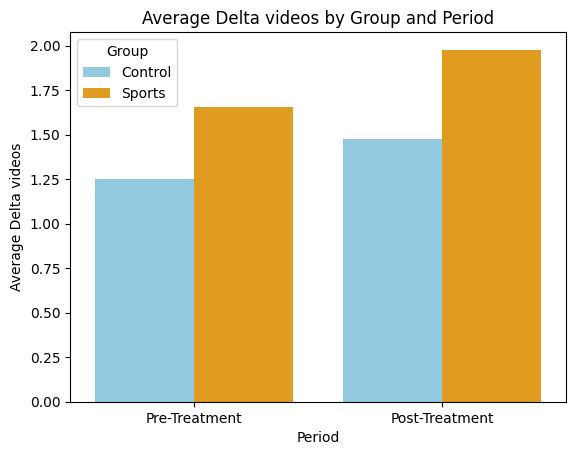

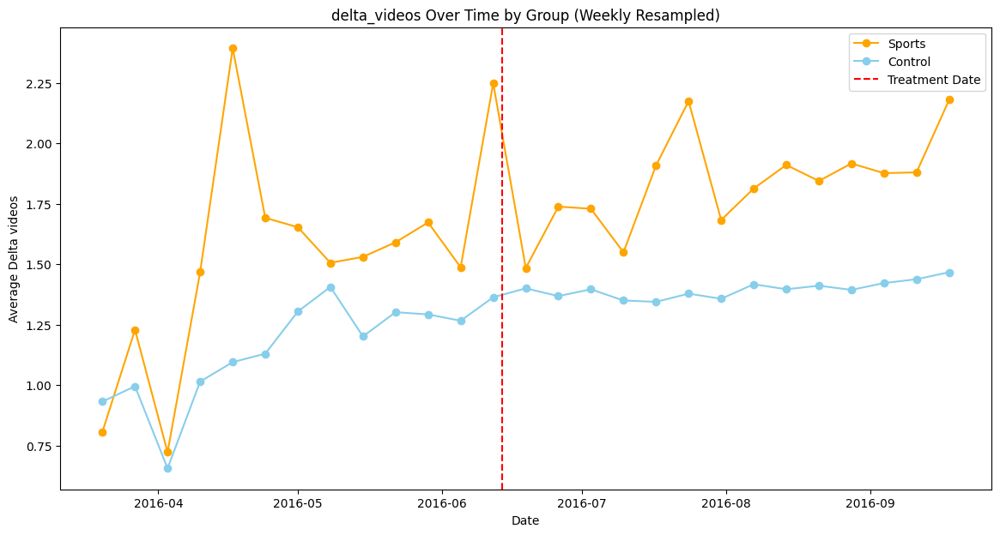

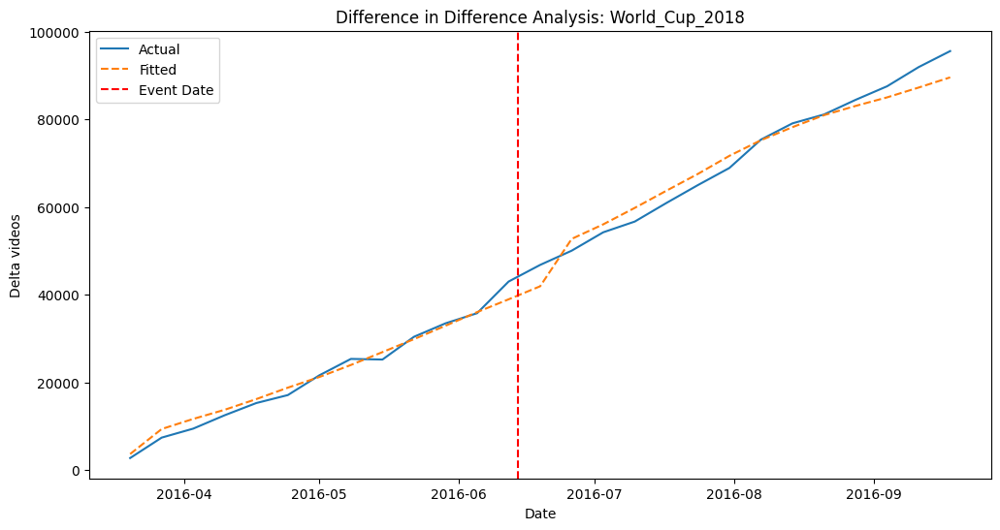

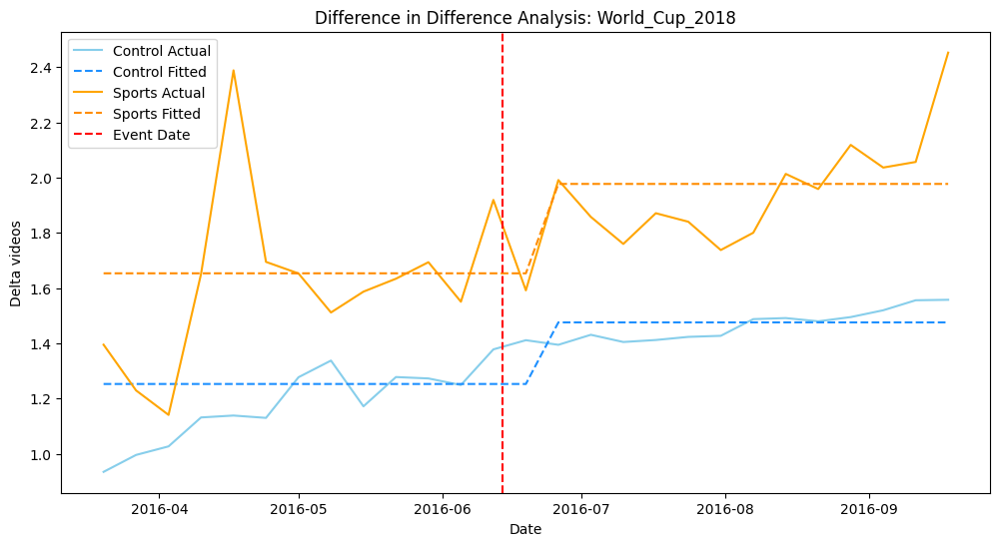

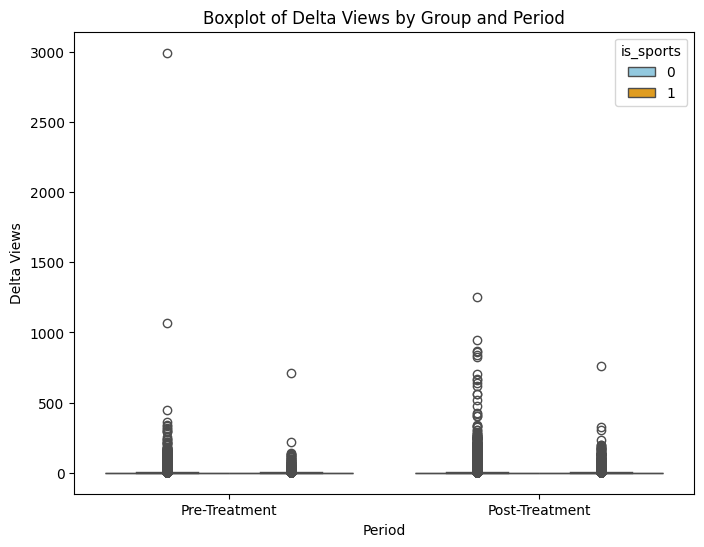

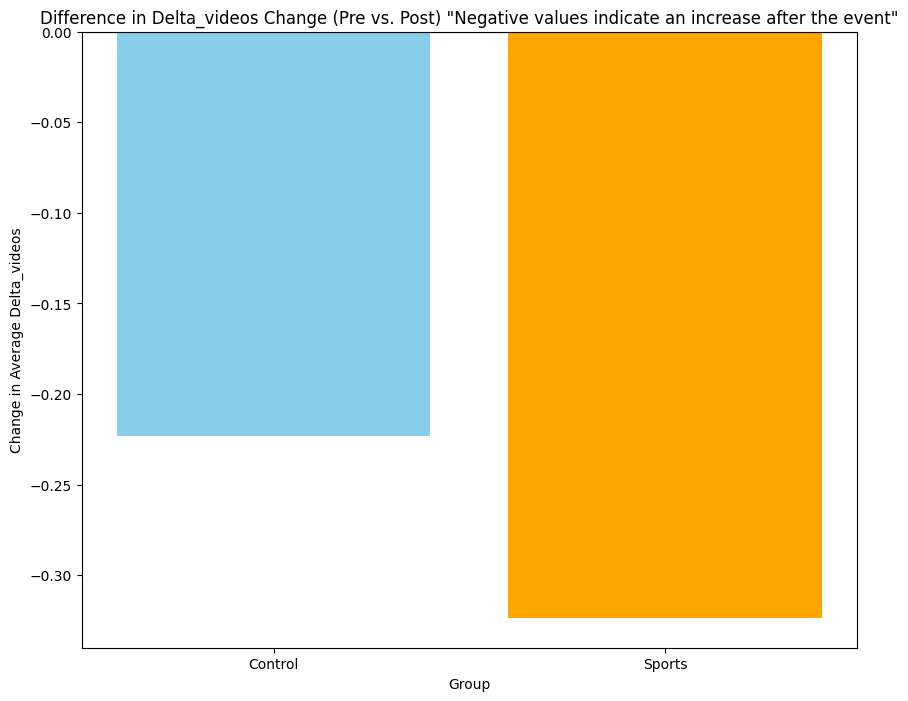

                            OLS Regression Results                            
Dep. Variable:           delta_videos   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     111.8
Date:                Thu, 14 Nov 2024   Prob (F-statistic):           2.30e-72
Time:                        21:49:19   Log-Likelihood:            -3.0632e+06
No. Observations:              892838   AIC:                         6.126e+06
Df Residuals:                  892834   BIC:                         6.126e+06
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept          1.2525      0.015     83.

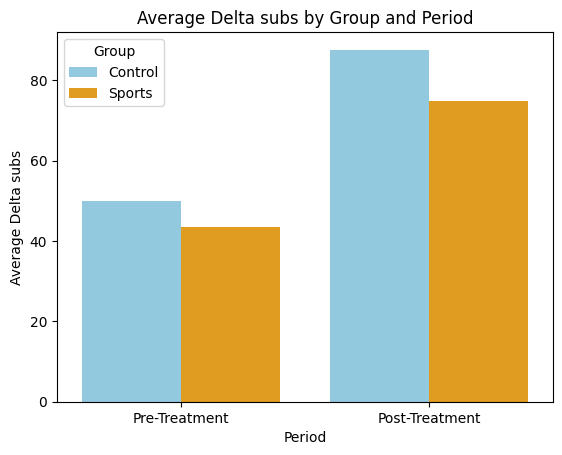

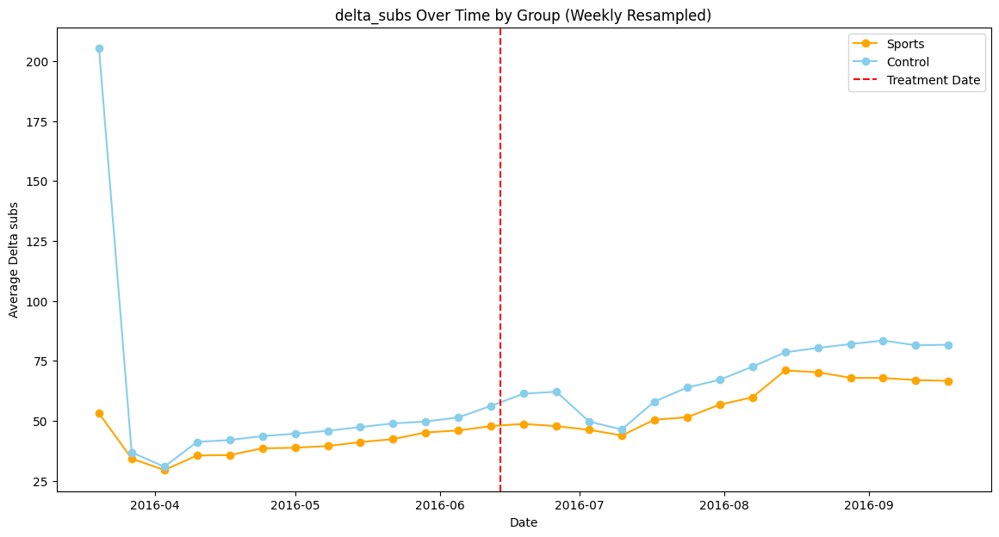

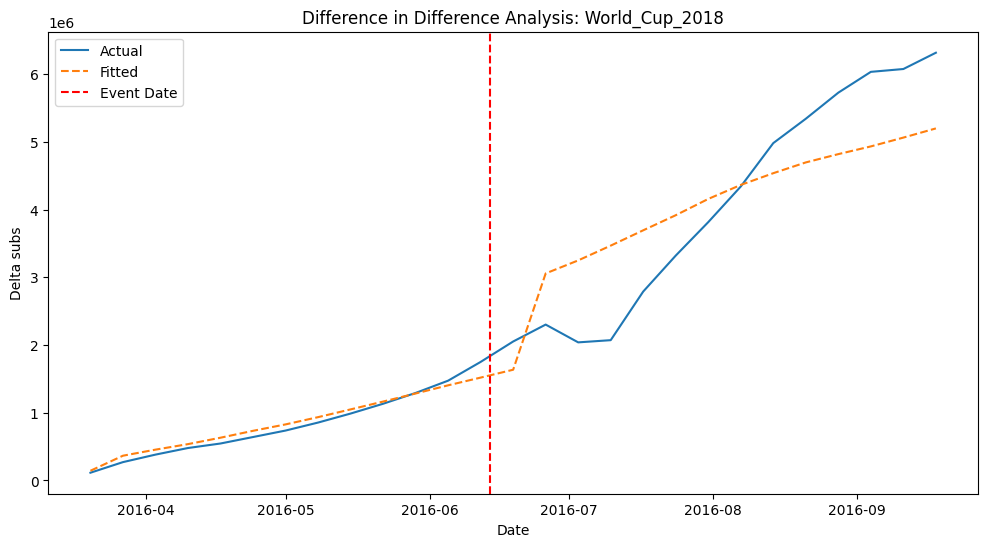

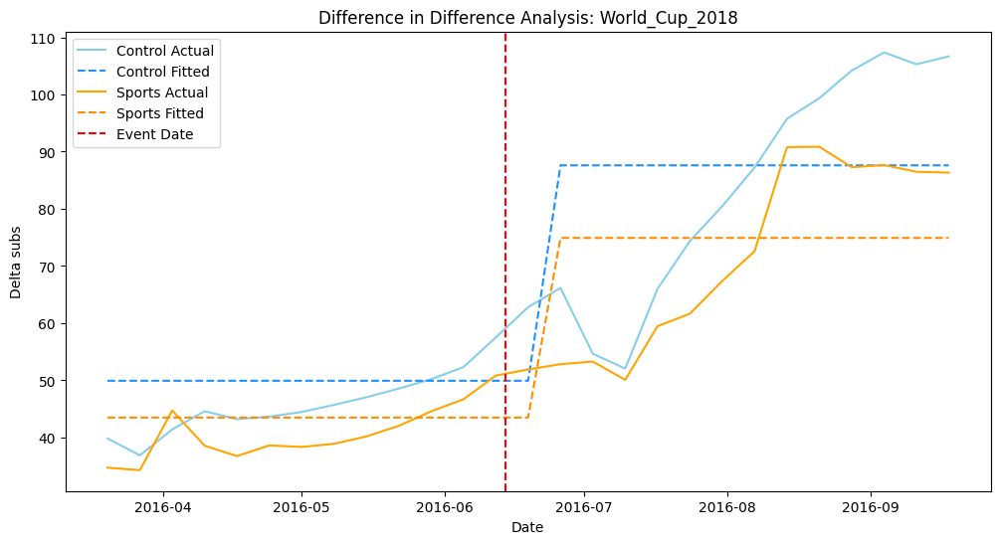

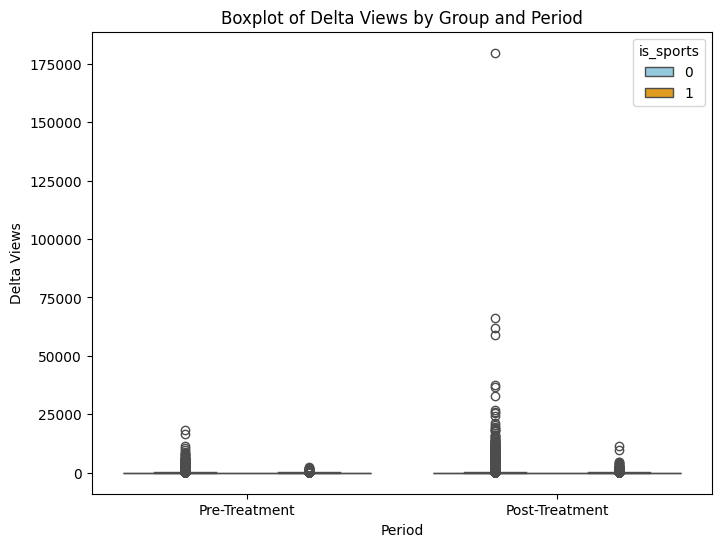

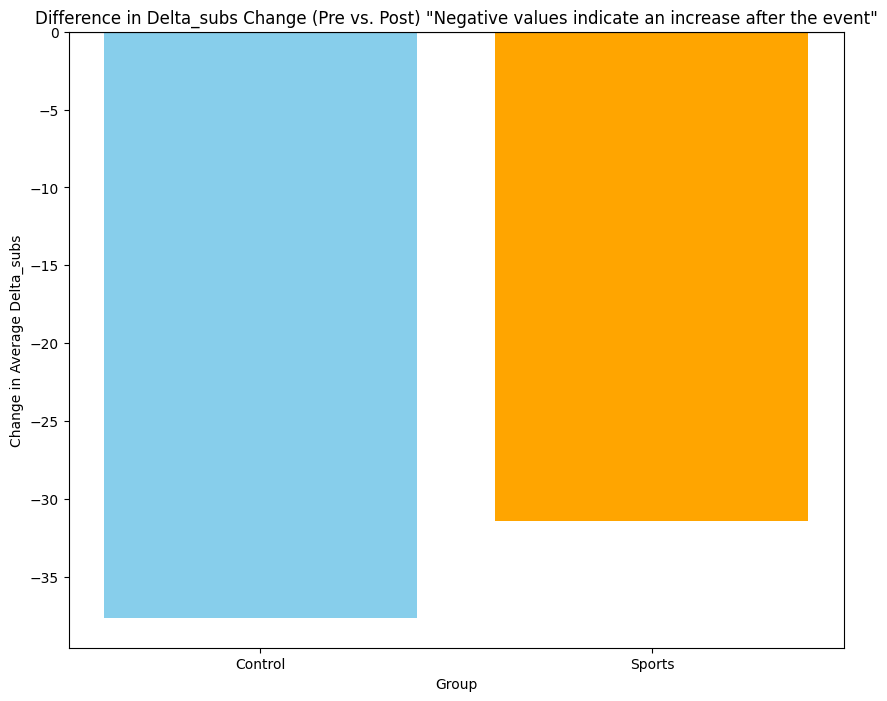

                            OLS Regression Results                            
Dep. Variable:             delta_subs   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                  0.003
Method:                 Least Squares   F-statistic:                     842.2
Date:                Thu, 14 Nov 2024   Prob (F-statistic):               0.00
Time:                        21:49:23   Log-Likelihood:            -6.4229e+06
No. Observations:              892838   AIC:                         1.285e+07
Df Residuals:                  892834   BIC:                         1.285e+07
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept         49.9227      0.650     76.

In [480]:
print("\nFirst match in World Cup 2018 June 14th, 2018\n")

diff_in_diff_model = diff_in_diff(df, 'datetime', 'delta_views'
, pd.to_datetime('2016-06-14'), 'World_Cup_2018', 3)

diff_in_diff_model = diff_in_diff(df, 'datetime', 'delta_videos', pd.to_datetime('2016-06-14'), 'World_Cup_2018', 3)

diff_in_diff_model = diff_in_diff(df, 'datetime', 'delta_subs', pd.to_datetime('2016-06-14'), 'World_Cup_2018', 3)

### Euro 2016

#### Last match in Euro 2016 July 10, 2016

Last match in Eurocup 2016 July 10th, 2016

Missing values
 delta_views     0
is_sports       0
Eurocup_2016    0
interaction     0
dtype: int64


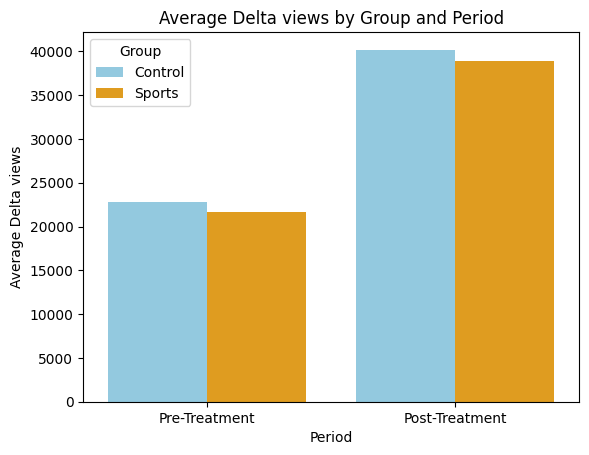

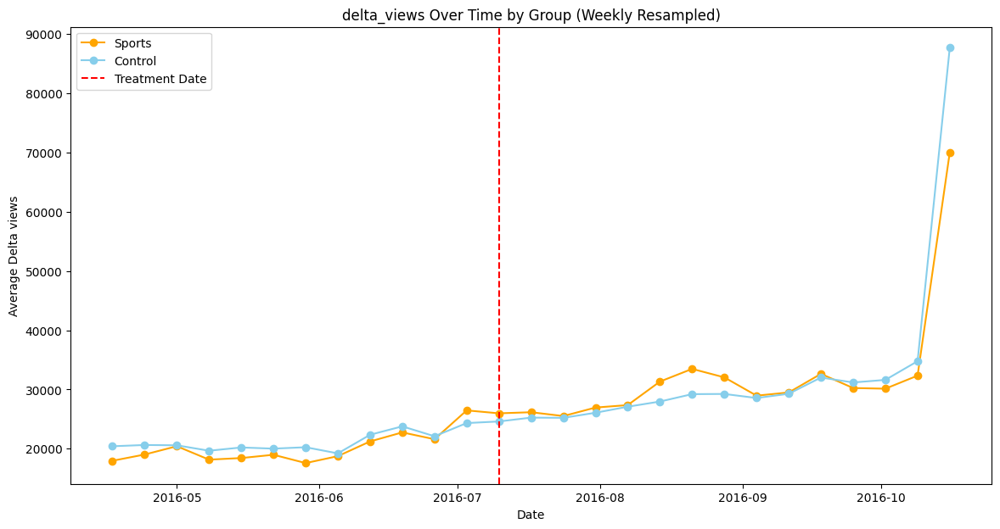

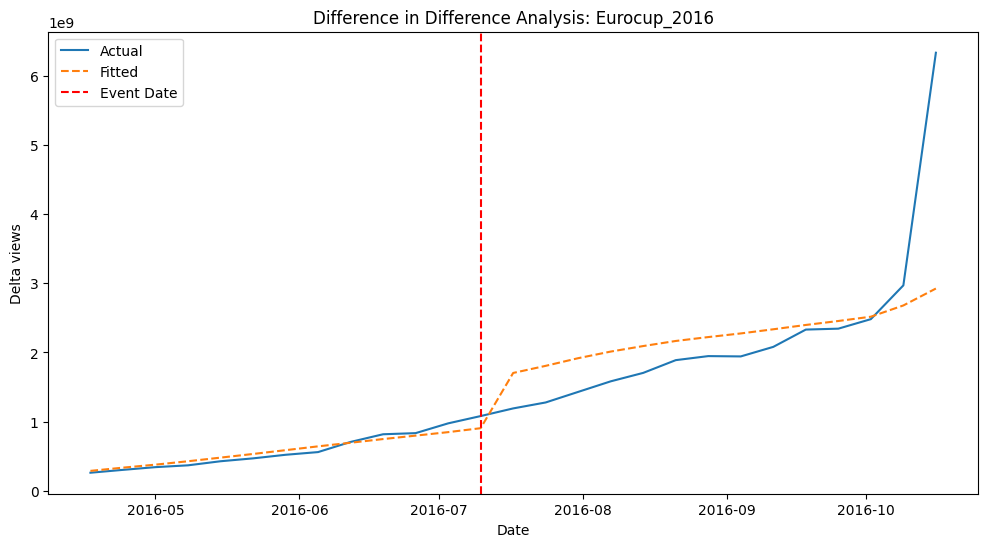

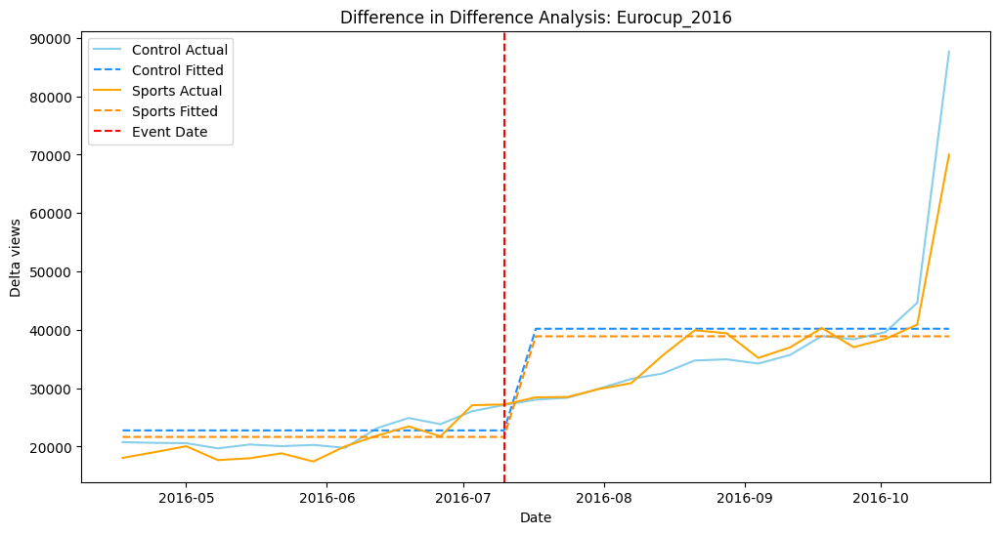

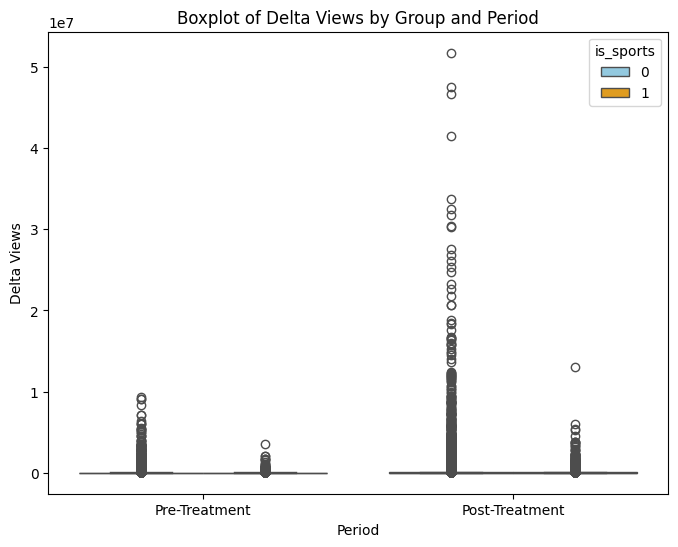

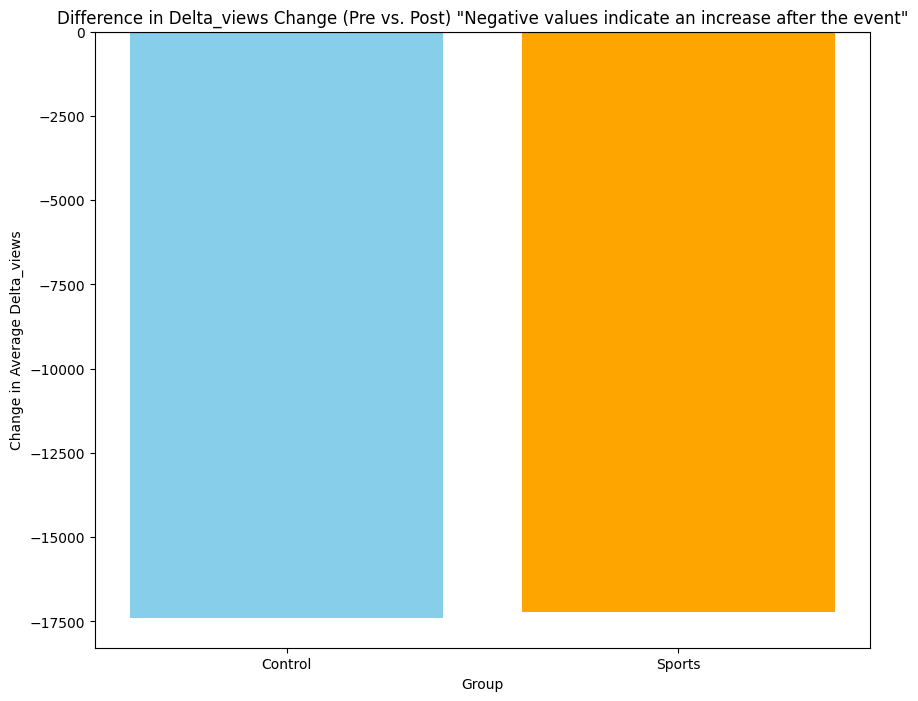

                            OLS Regression Results                            
Dep. Variable:            delta_views   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                  0.002
Method:                 Least Squares   F-statistic:                     614.6
Date:                Thu, 14 Nov 2024   Prob (F-statistic):               0.00
Time:                        21:49:58   Log-Likelihood:            -1.5288e+07
No. Observations:             1123255   AIC:                         3.058e+07
Df Residuals:                 1123251   BIC:                         3.058e+07
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept     2.277e+04    347.882     65.464   

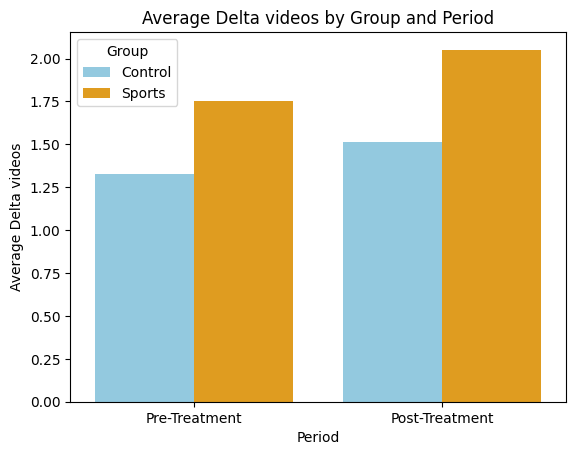

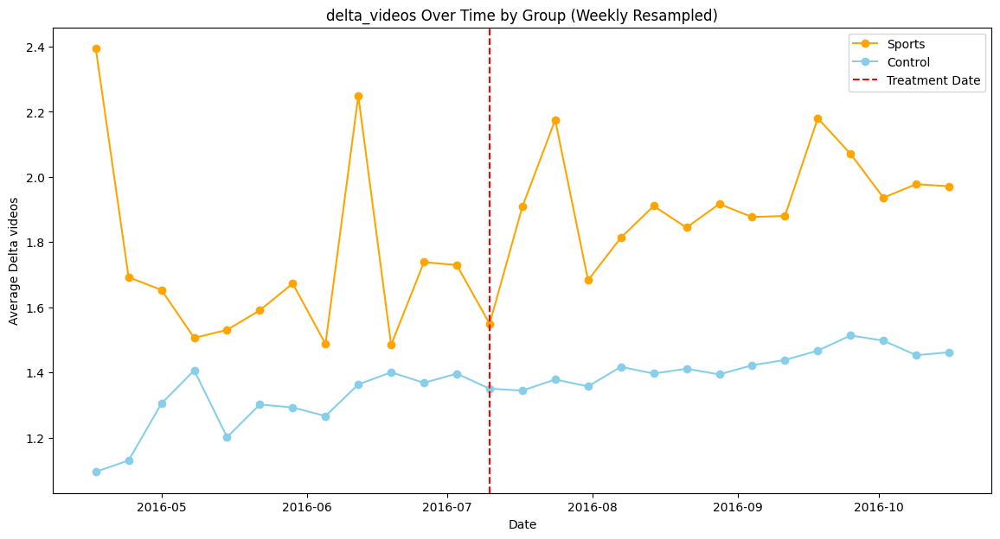

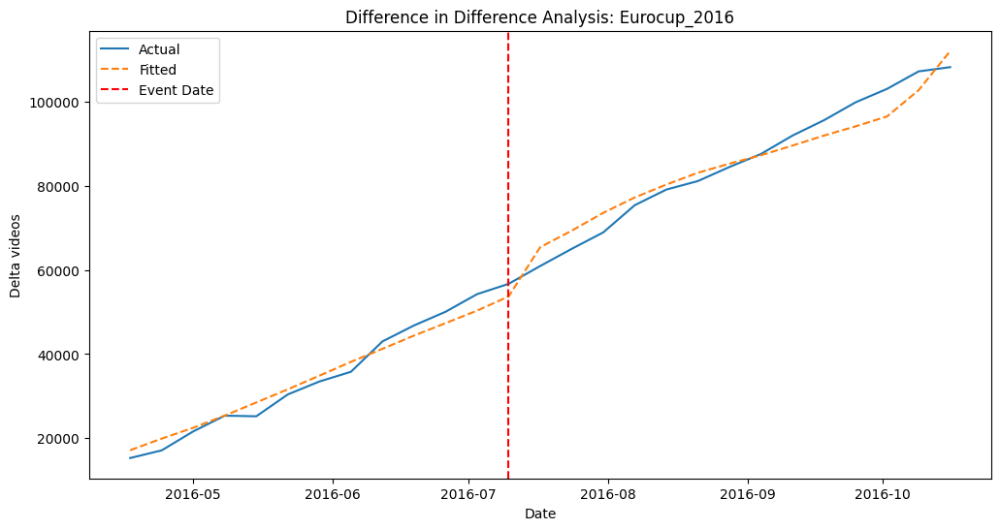

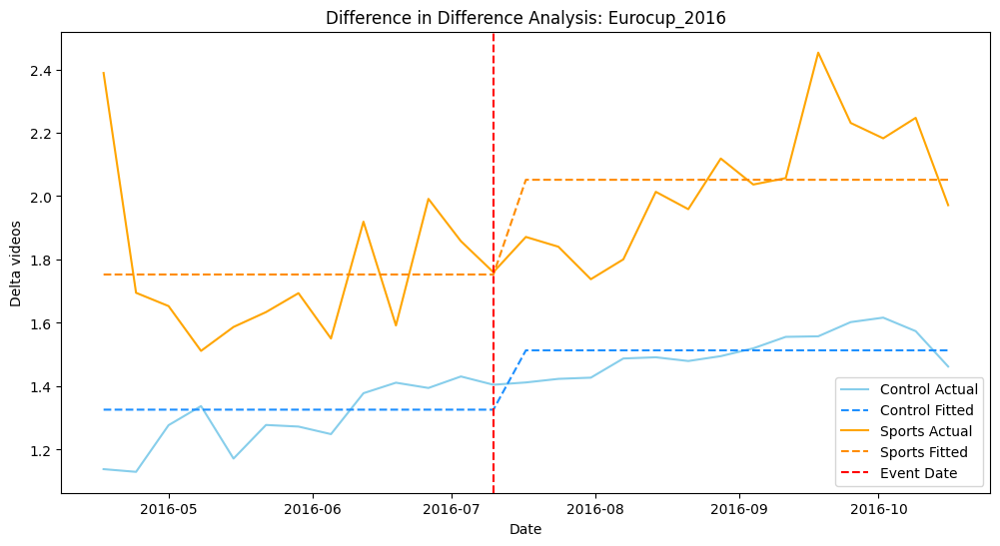

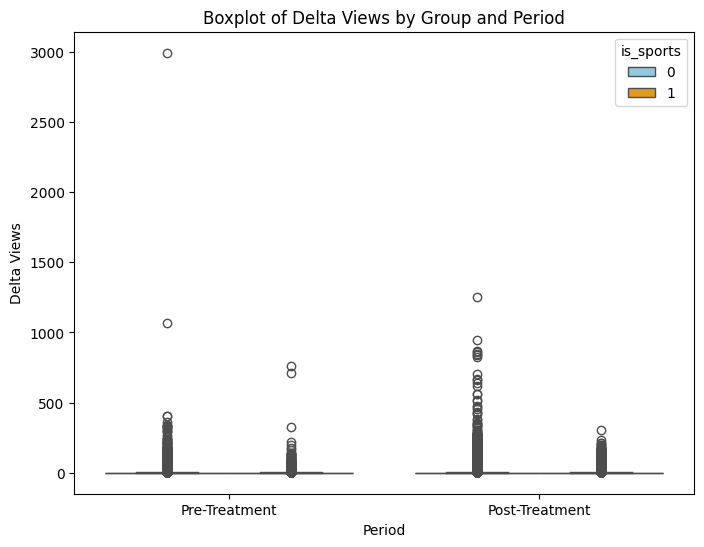

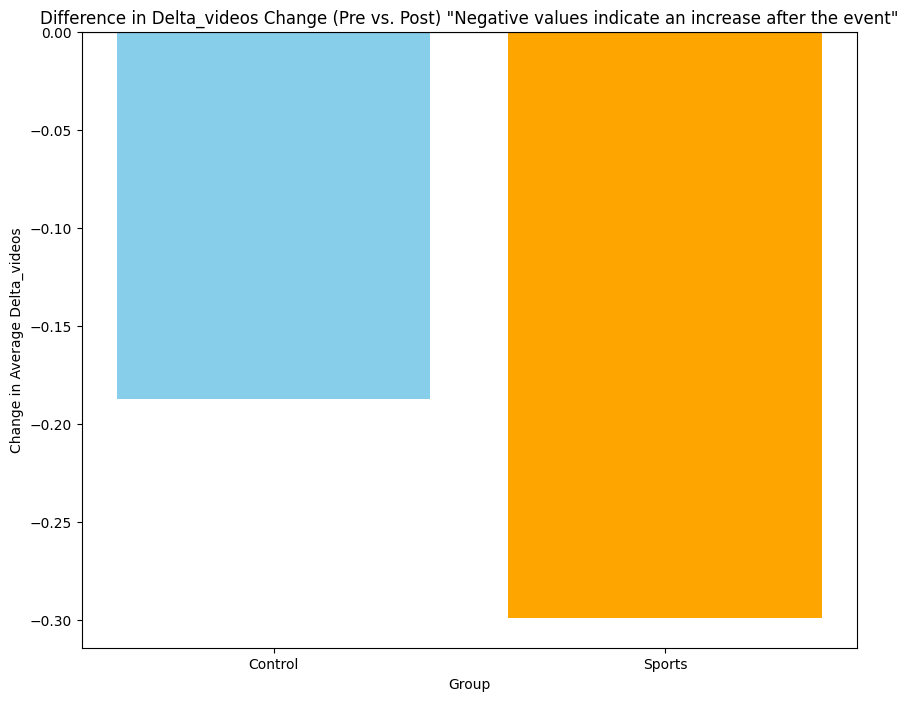

                            OLS Regression Results                            
Dep. Variable:           delta_videos   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     130.8
Date:                Thu, 14 Nov 2024   Prob (F-statistic):           1.02e-84
Time:                        21:50:03   Log-Likelihood:            -3.8492e+06
No. Observations:             1123255   AIC:                         7.698e+06
Df Residuals:                 1123251   BIC:                         7.698e+06
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept        1.3260      0.013    100.895   

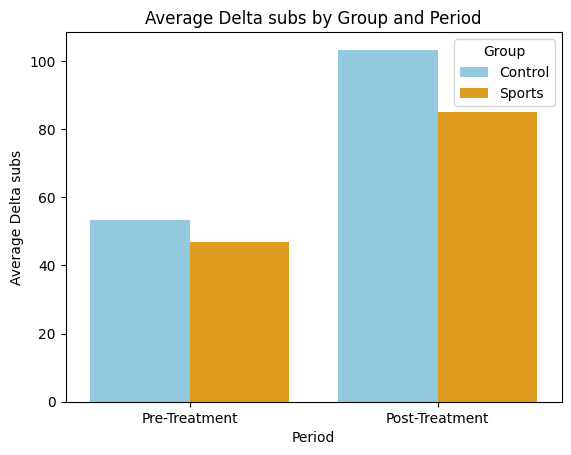

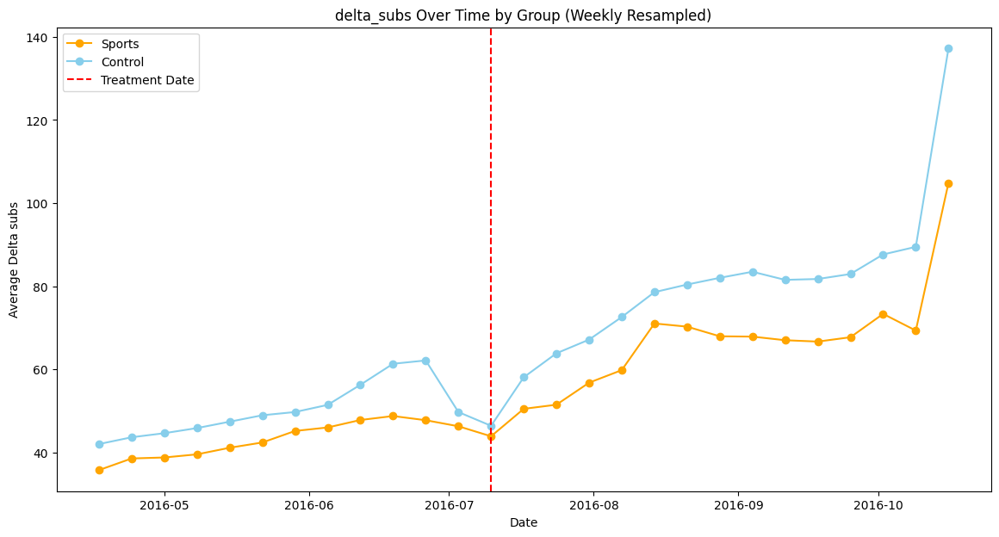

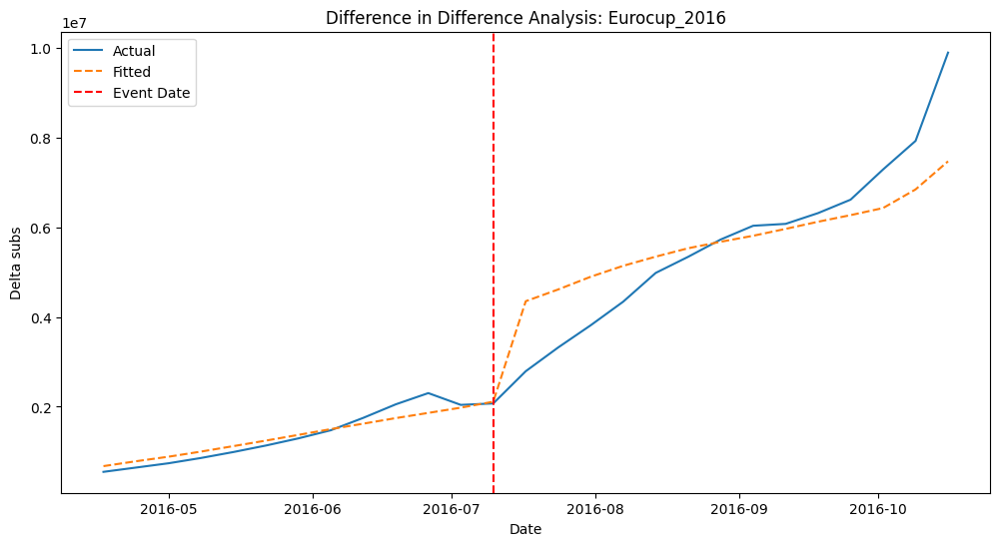

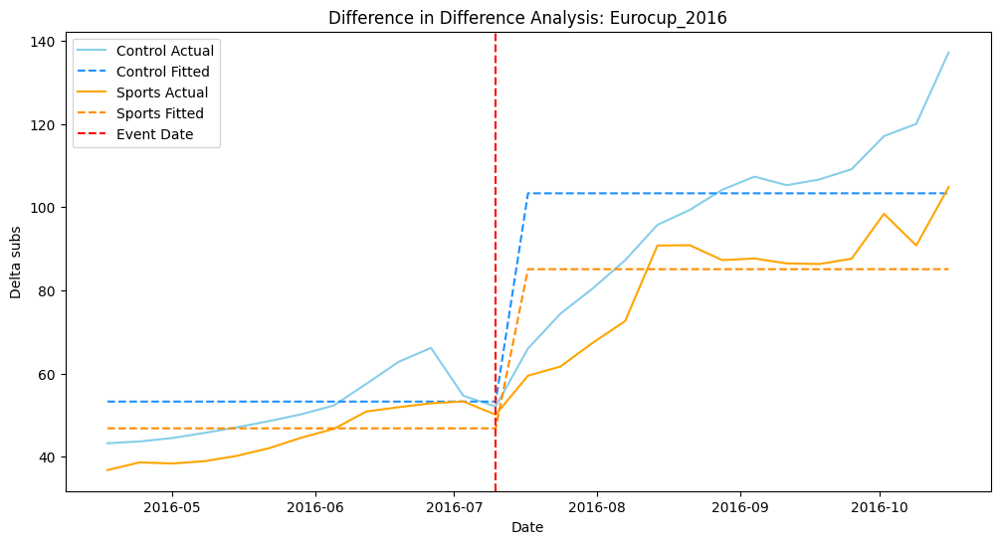

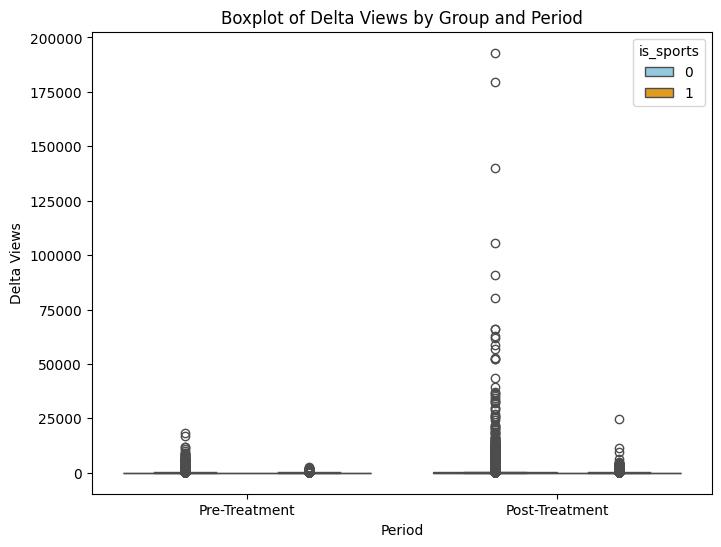

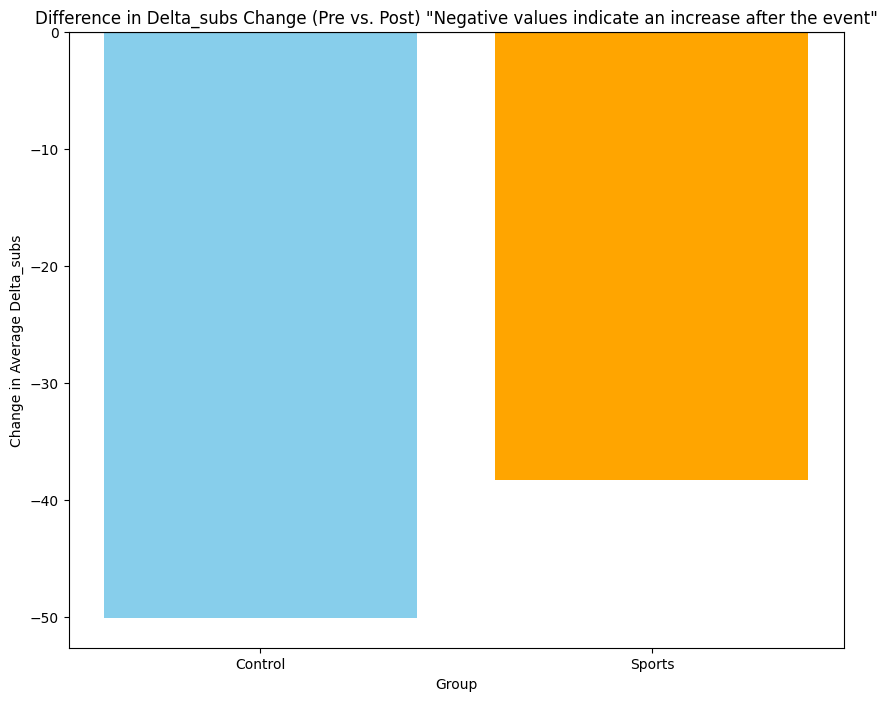

                            OLS Regression Results                            
Dep. Variable:             delta_subs   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                  0.003
Method:                 Least Squares   F-statistic:                     944.2
Date:                Thu, 14 Nov 2024   Prob (F-statistic):               0.00
Time:                        21:50:07   Log-Likelihood:            -8.4746e+06
No. Observations:             1123255   AIC:                         1.695e+07
Df Residuals:                 1123251   BIC:                         1.695e+07
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept       53.2433      0.807     65.951   

In [481]:
print("Last match in Eurocup 2016 July 10th, 2016\n")
diff_in_diff_model = diff_in_diff(df, 'datetime', 'delta_views', pd.to_datetime('2016-07-10'), 'Eurocup_2016', 3)

diff_in_diff_model = diff_in_diff(df, 'datetime', 'delta_videos', pd.to_datetime('2016-07-10'), 'Eurocup_2016', 3)

diff_in_diff_model = diff_in_diff(df, 'datetime', 'delta_subs', pd.to_datetime('2016-07-10'), 'Eurocup_2016', 3)

#### First match in Euro 2016 June 10, 2016

First match in Eurocup 2016 June 10th, 2016

Missing values
 delta_views     0
is_sports       0
Eurocup_2016    0
interaction     0
dtype: int64


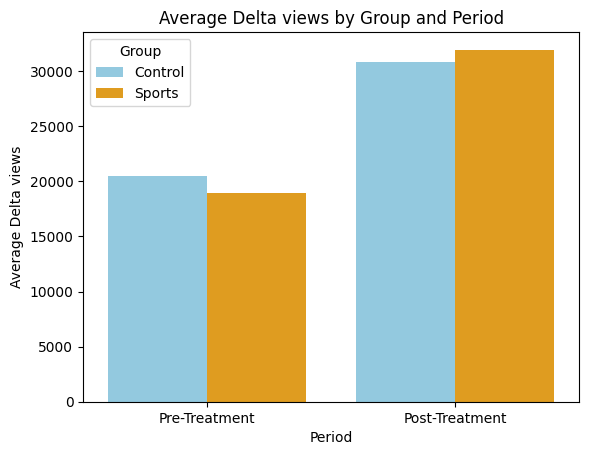

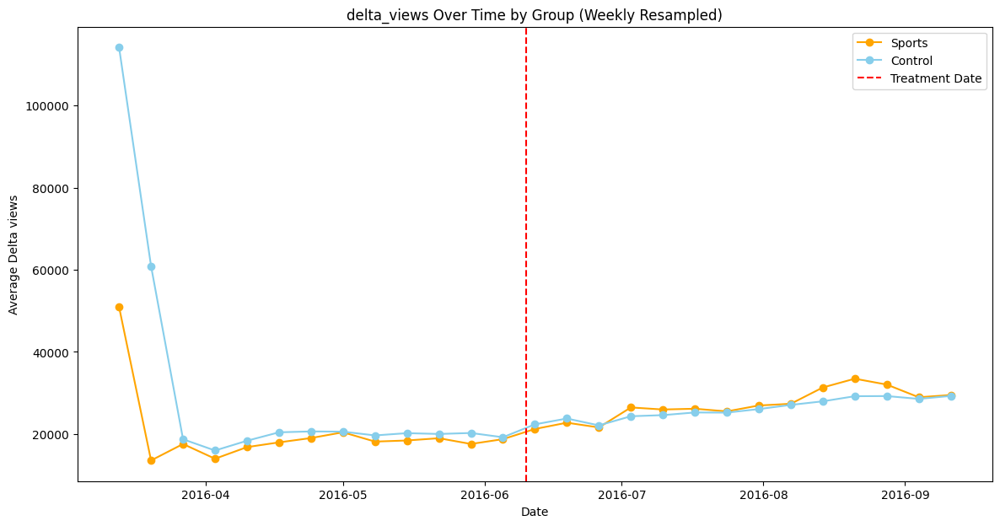

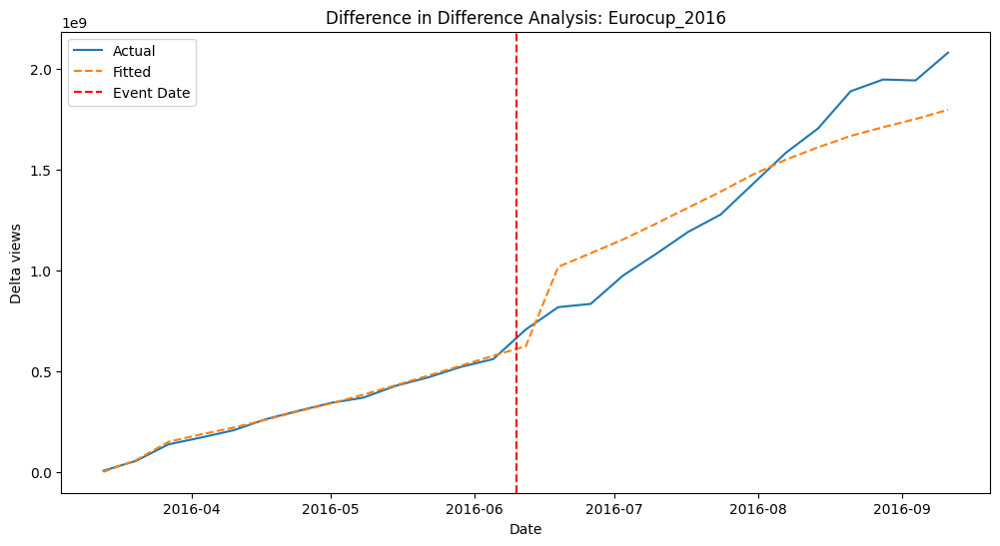

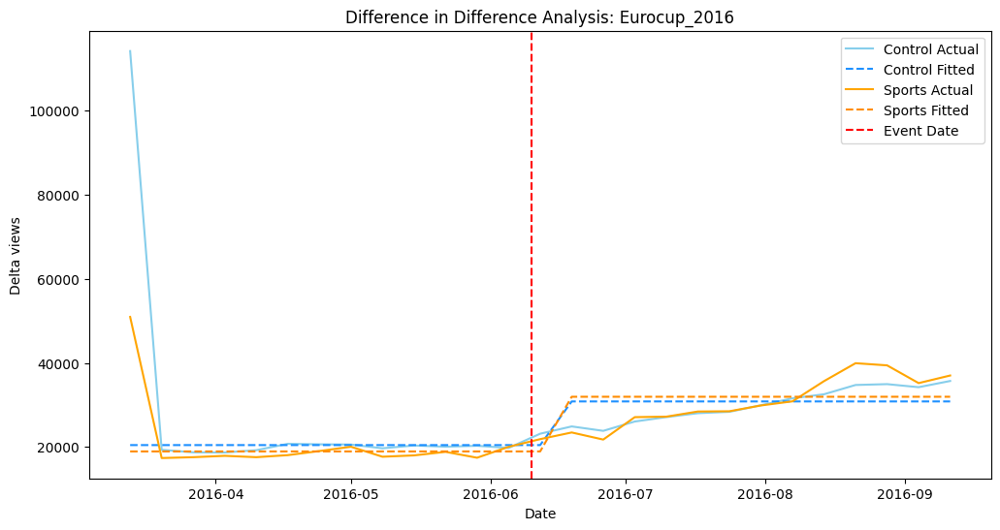

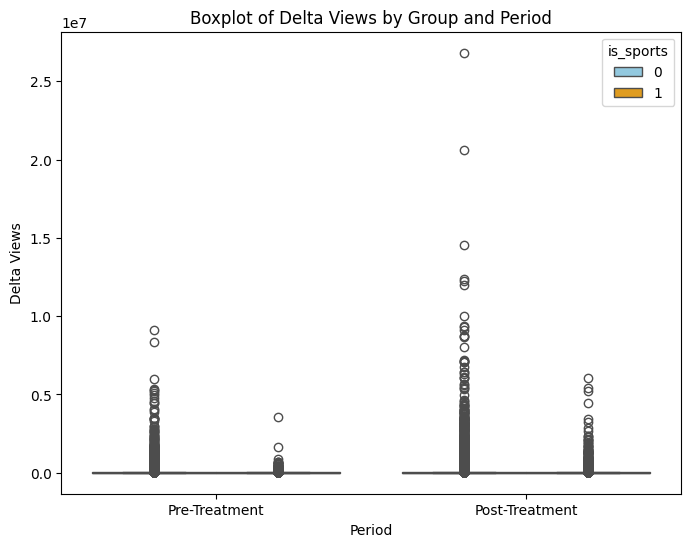

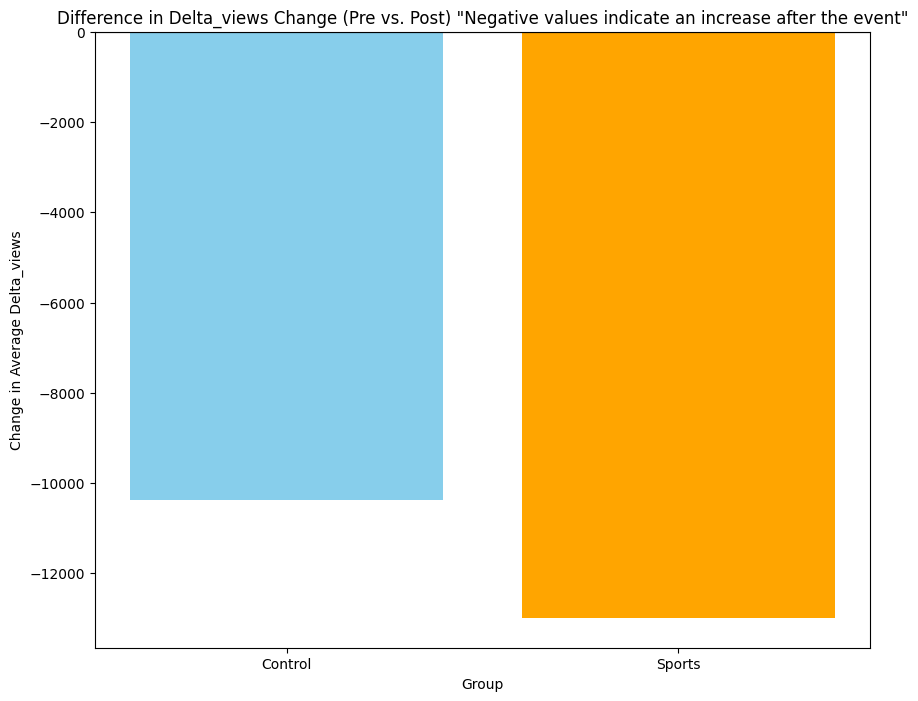

                            OLS Regression Results                            
Dep. Variable:            delta_views   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                  0.002
Method:                 Least Squares   F-statistic:                     583.1
Date:                Thu, 14 Nov 2024   Prob (F-statistic):               0.00
Time:                        21:50:17   Log-Likelihood:            -1.0791e+07
No. Observations:              833139   AIC:                         2.158e+07
Df Residuals:                  833135   BIC:                         2.158e+07
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept     2.046e+04    220.522     92.760   

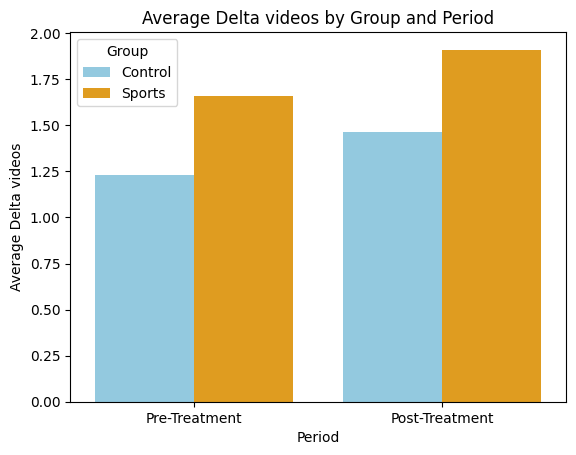

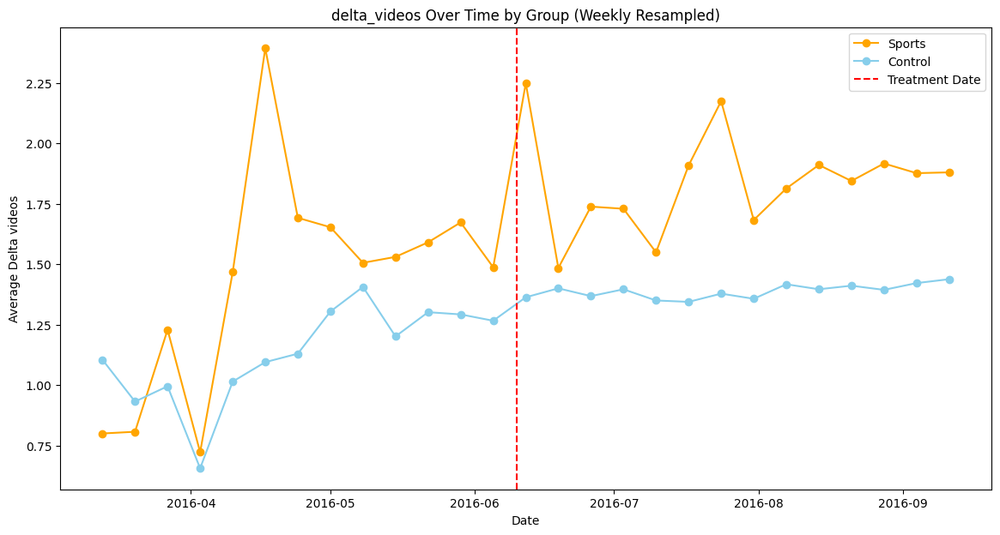

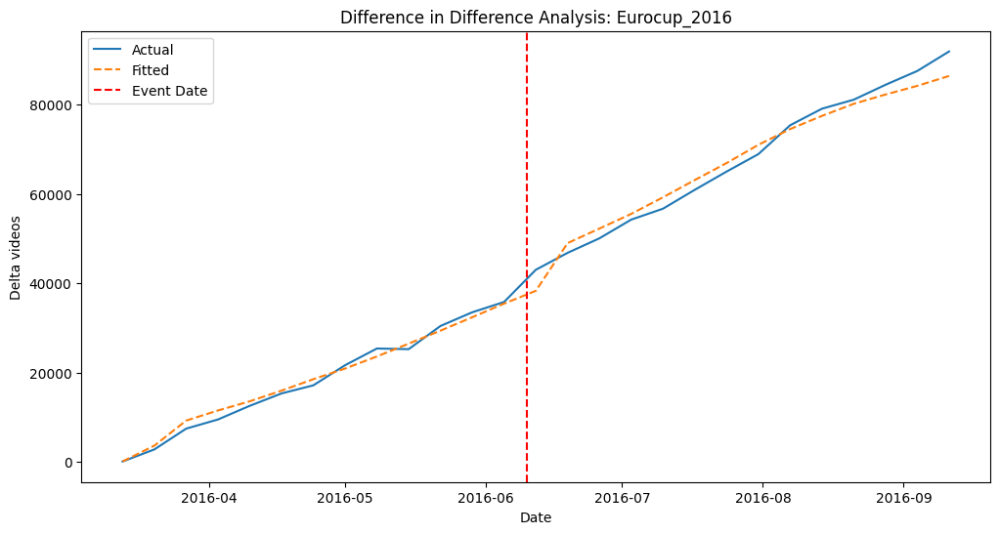

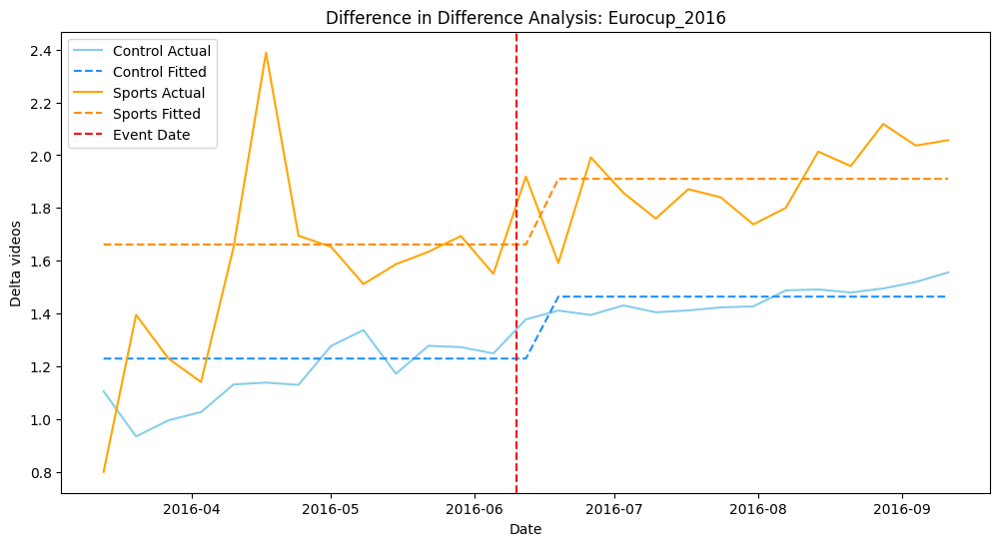

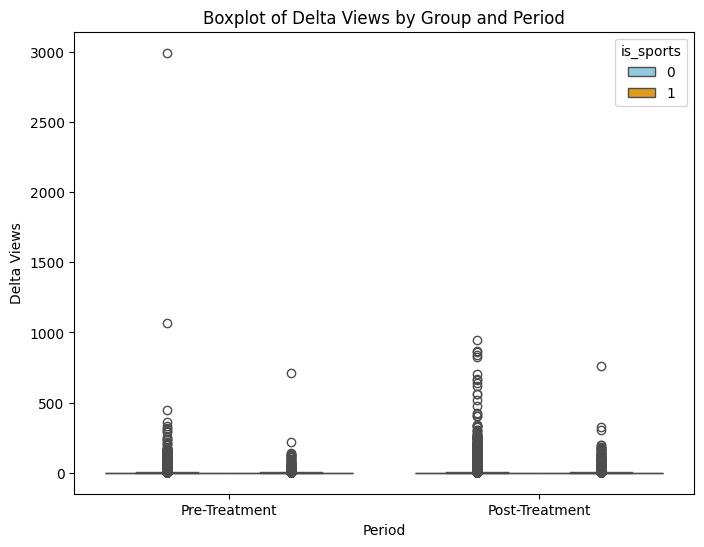

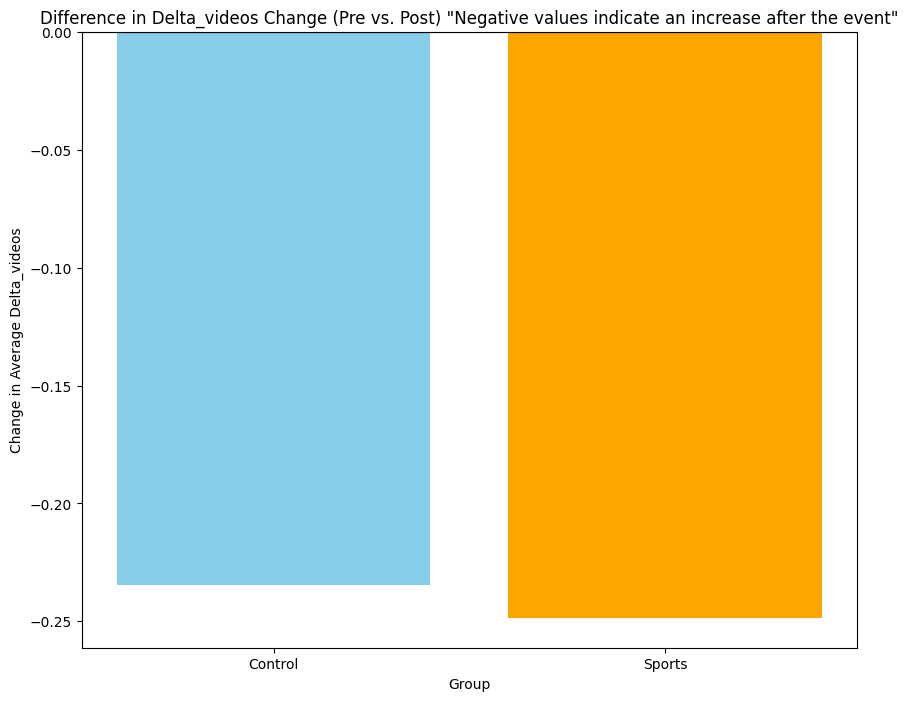

                            OLS Regression Results                            
Dep. Variable:           delta_videos   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     100.0
Date:                Thu, 14 Nov 2024   Prob (F-statistic):           9.87e-65
Time:                        21:50:21   Log-Likelihood:            -2.8546e+06
No. Observations:              833139   AIC:                         5.709e+06
Df Residuals:                  833135   BIC:                         5.709e+06
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept        1.2293      0.016     76.466   

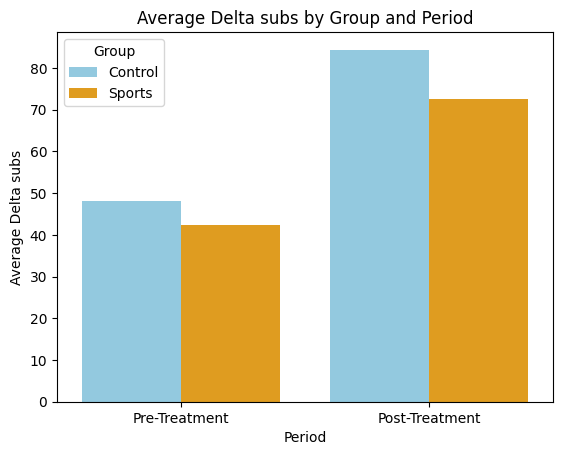

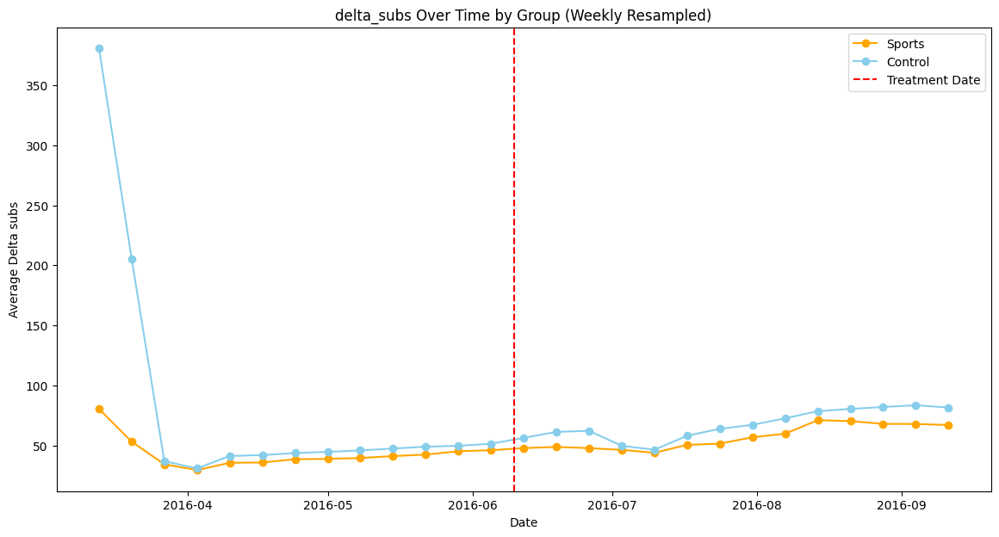

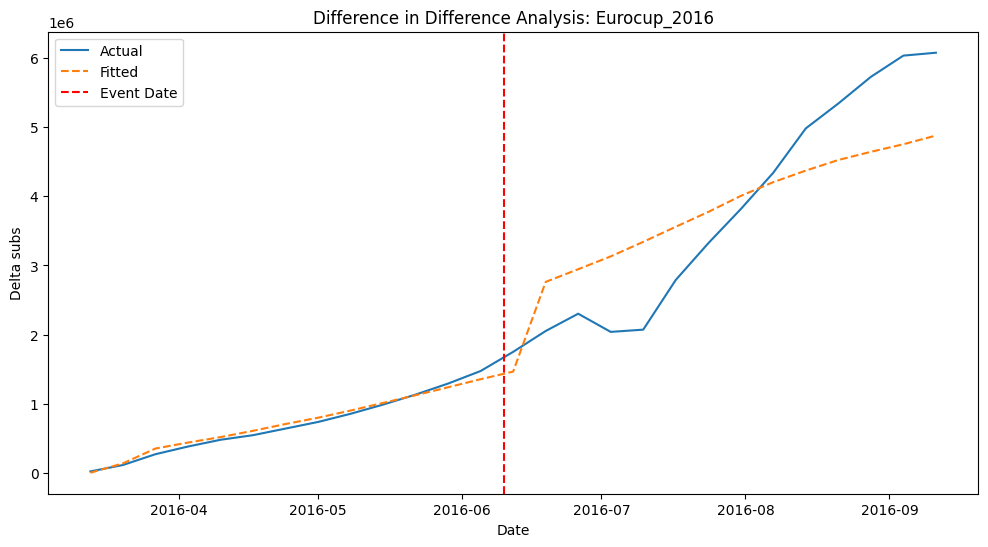

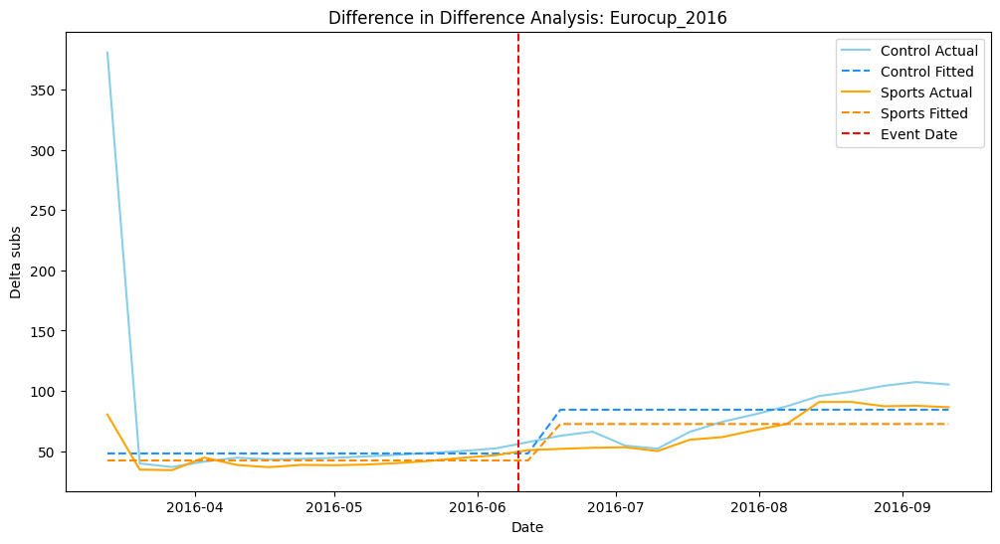

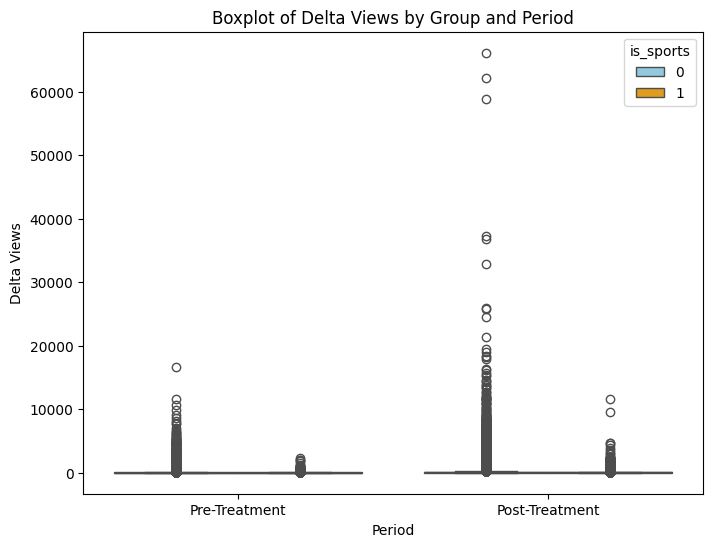

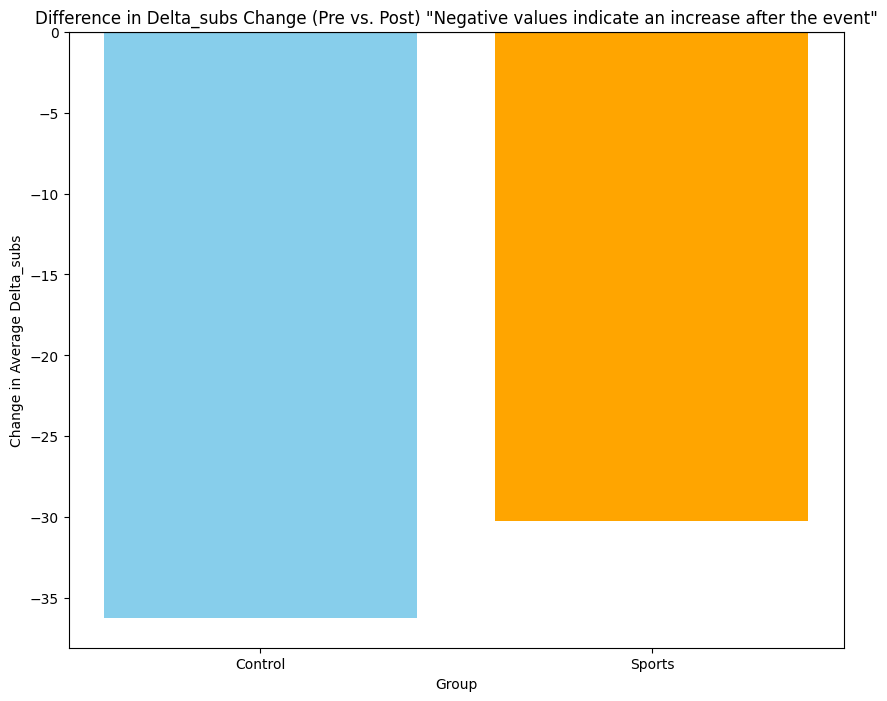

                            OLS Regression Results                            
Dep. Variable:             delta_subs   R-squared:                       0.004
Model:                            OLS   Adj. R-squared:                  0.004
Method:                 Least Squares   F-statistic:                     1107.
Date:                Thu, 14 Nov 2024   Prob (F-statistic):               0.00
Time:                        21:50:24   Log-Likelihood:            -5.8013e+06
No. Observations:              833139   AIC:                         1.160e+07
Df Residuals:                  833135   BIC:                         1.160e+07
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept       48.1294      0.552     87.135   

In [482]:
print("First match in Eurocup 2016 June 10th, 2016\n")

diff_in_diff_model = diff_in_diff(df, 'datetime', 'delta_views', pd.to_datetime('2016-06-10'), 'Eurocup_2016', 3)

diff_in_diff_model = diff_in_diff(df, 'datetime', 'delta_videos', pd.to_datetime('2016-06-10'), 'Eurocup_2016', 3)

diff_in_diff_model = diff_in_diff(df, 'datetime', 'delta_subs', pd.to_datetime('2016-06-10'), 'Eurocup_2016', 3)

## Olympics

### Rio Jainero summer olympics 2016

Missing values
 delta_views                     0
is_sports                       0
Rio_de_jainero_olympics_2016    0
interaction                     0
dtype: int64


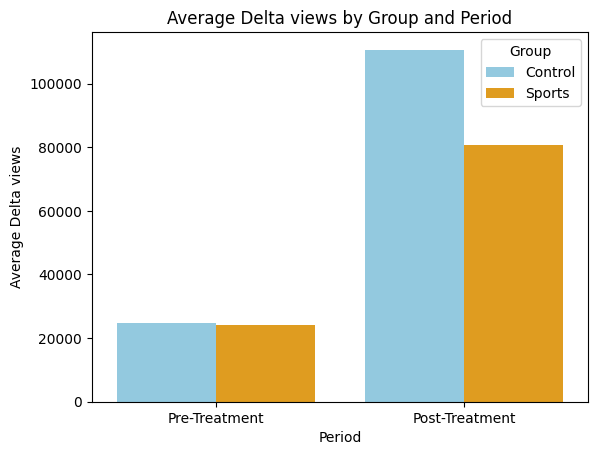

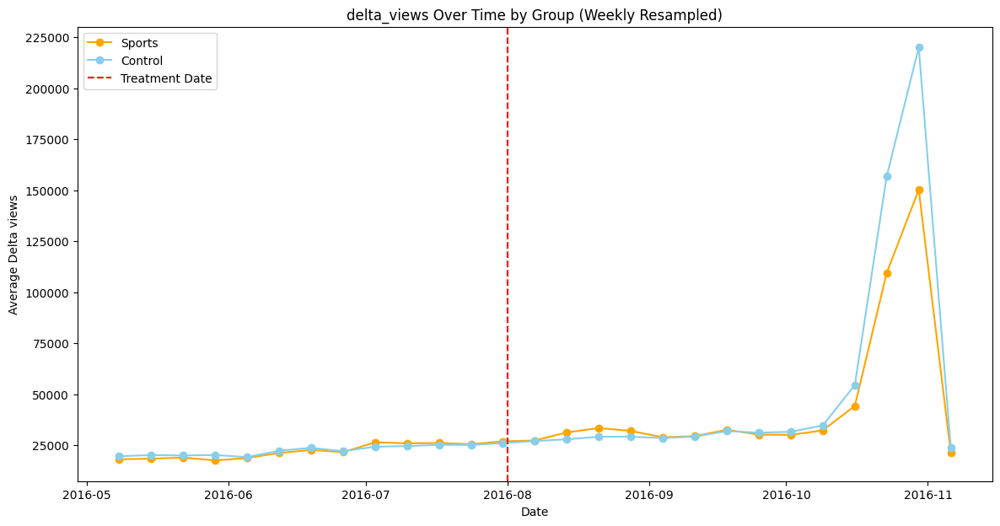

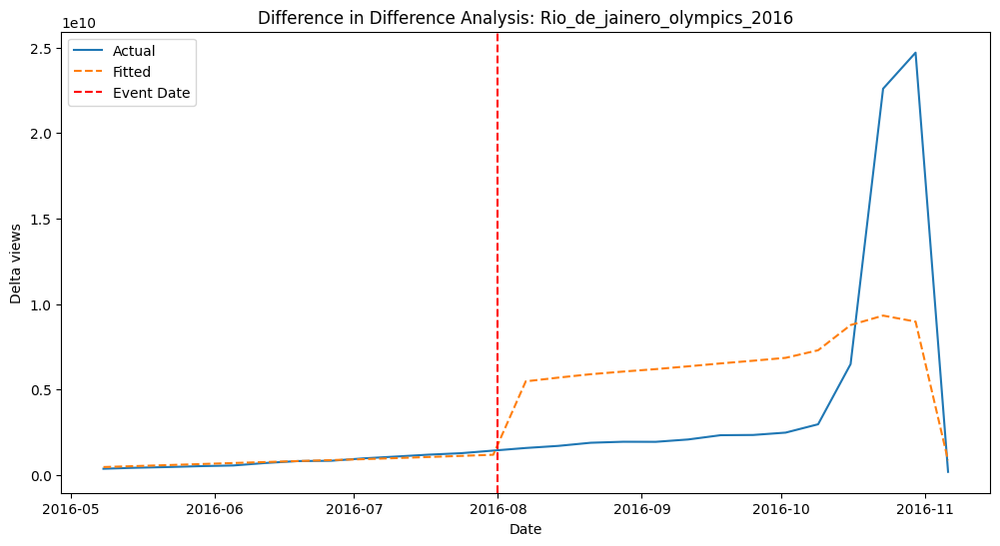

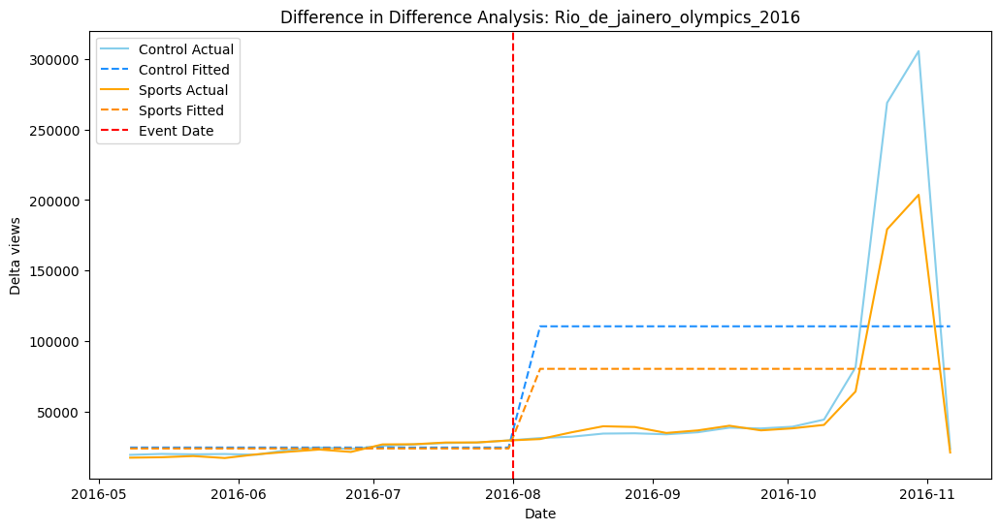

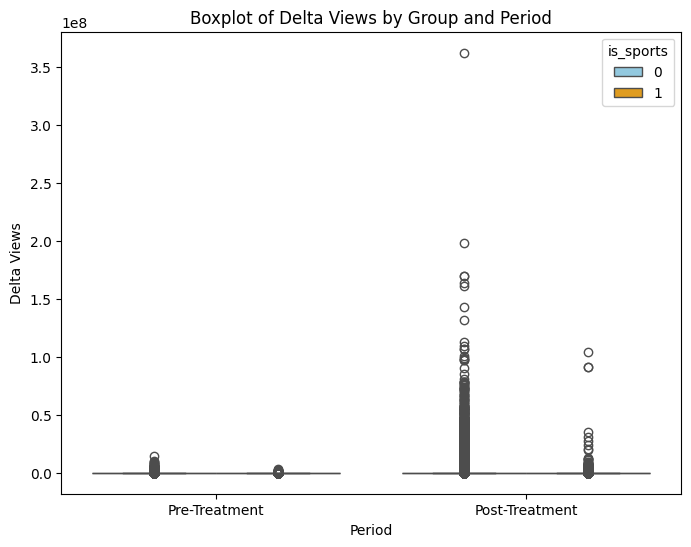

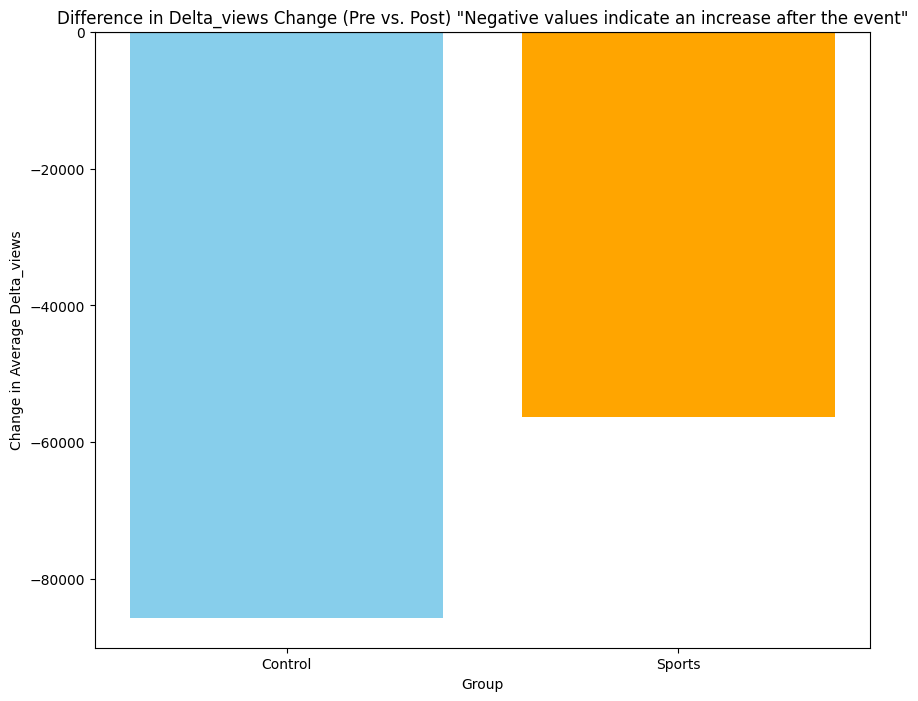

                            OLS Regression Results                            
Dep. Variable:            delta_views   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                  0.002
Method:                 Least Squares   F-statistic:                     735.7
Date:                Thu, 14 Nov 2024   Prob (F-statistic):               0.00
Time:                        22:09:29   Log-Likelihood:            -2.0442e+07
No. Observations:             1343698   AIC:                         4.088e+07
Df Residuals:                 1343694   BIC:                         4.088e+07
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
Intercept       

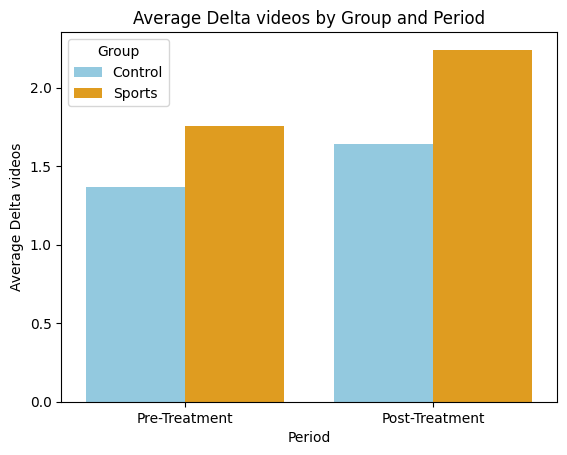

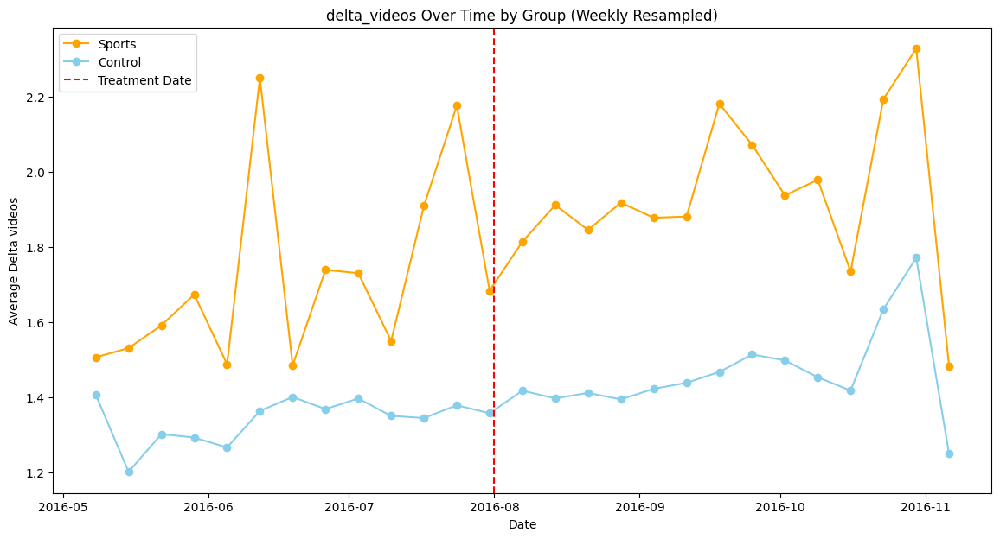

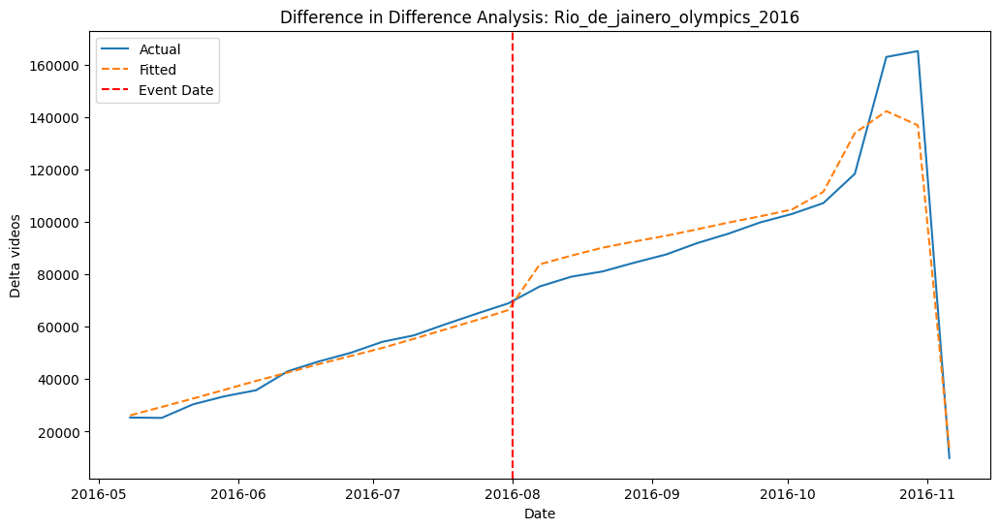

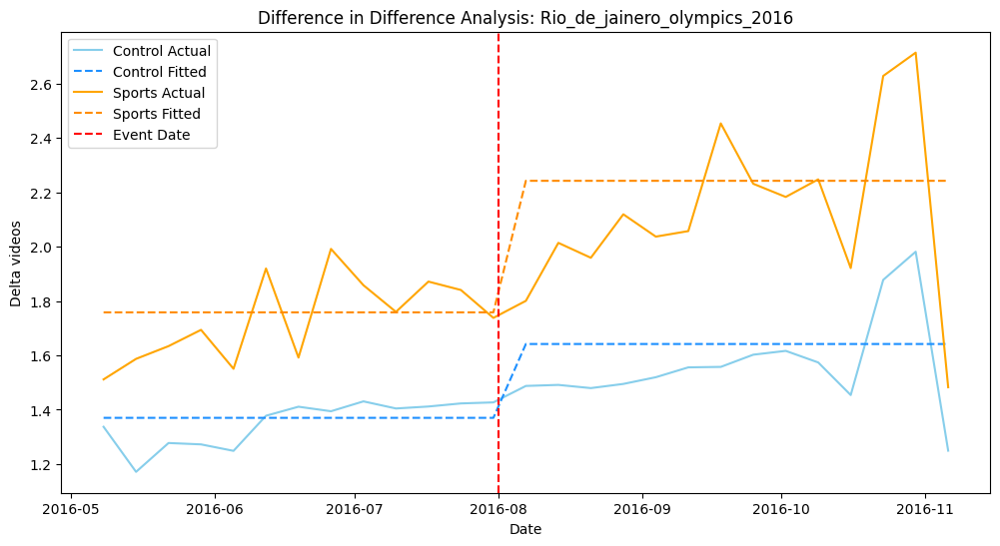

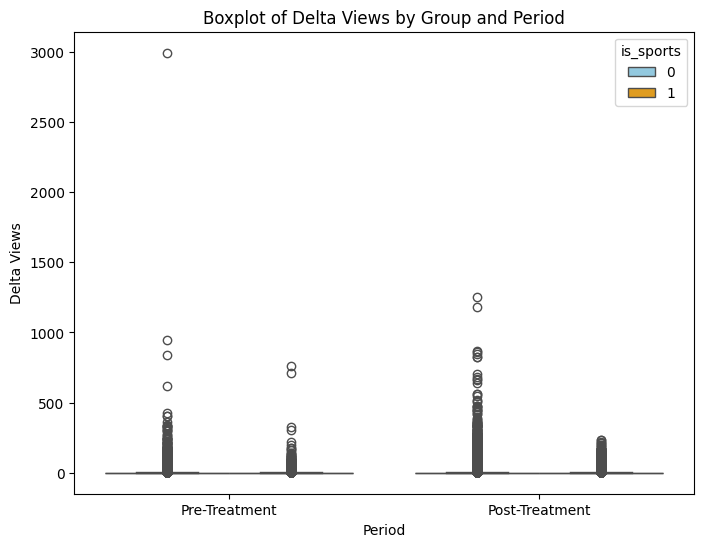

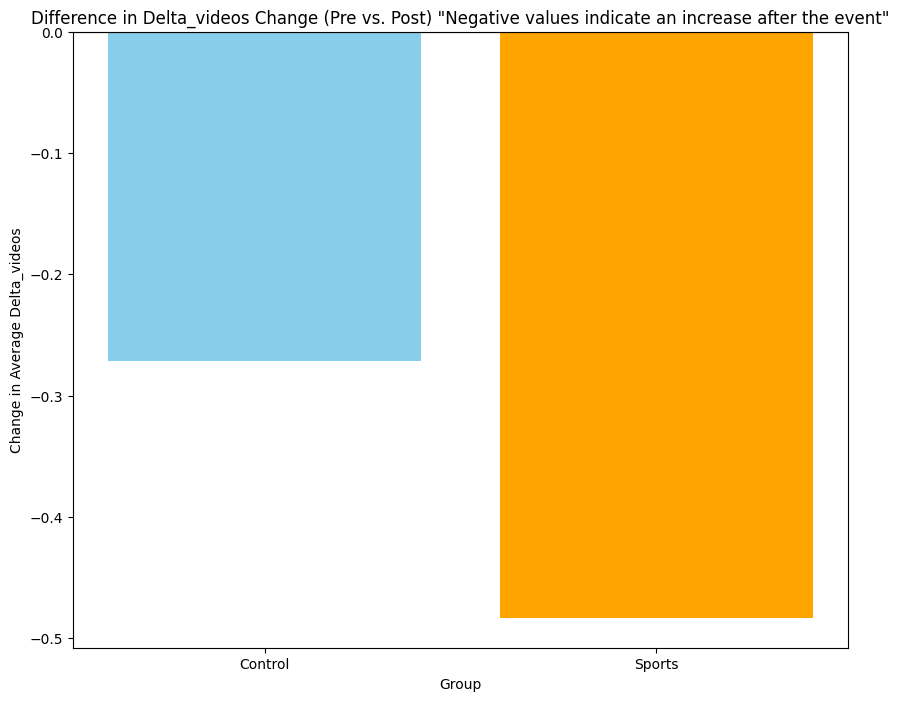

                            OLS Regression Results                            
Dep. Variable:           delta_videos   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     225.3
Date:                Thu, 14 Nov 2024   Prob (F-statistic):          3.95e-146
Time:                        22:09:33   Log-Likelihood:            -4.6542e+06
No. Observations:             1343698   AIC:                         9.308e+06
Df Residuals:                 1343694   BIC:                         9.308e+06
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
Intercept       

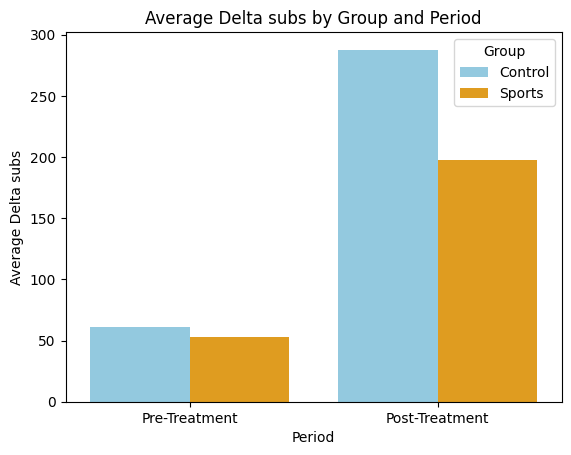

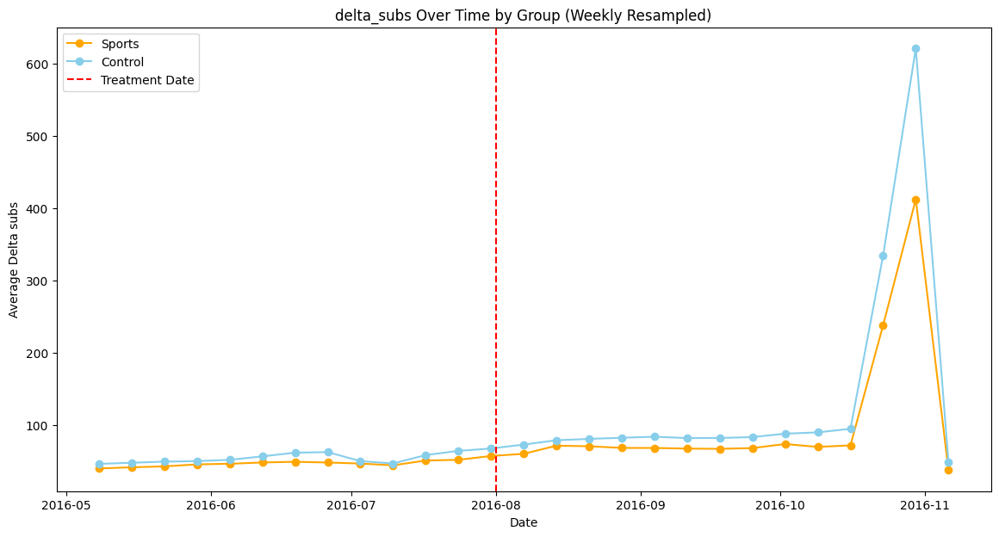

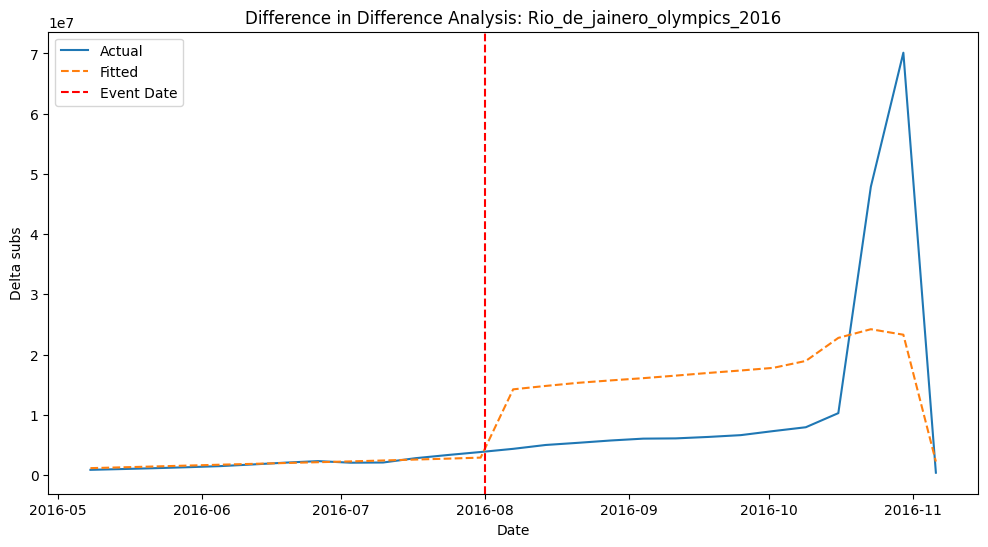

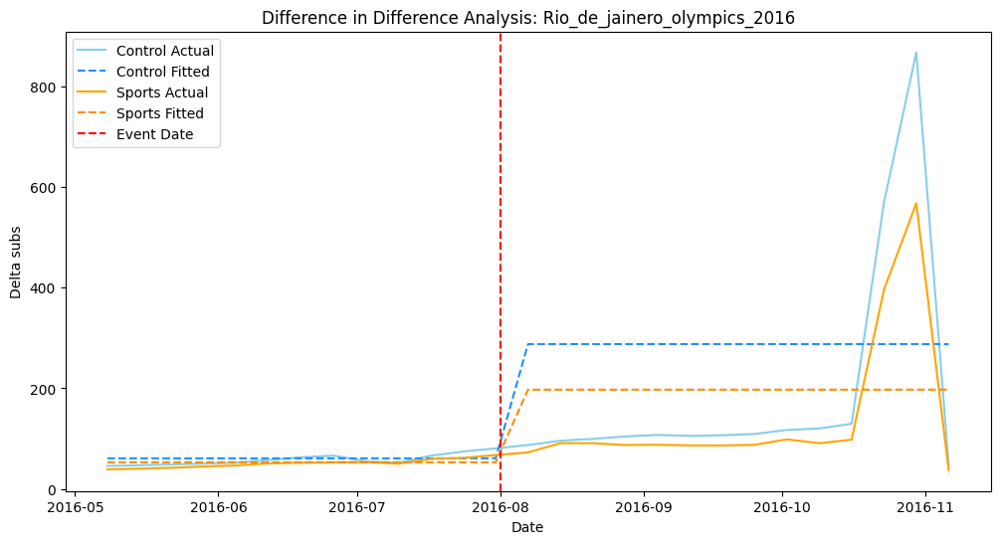

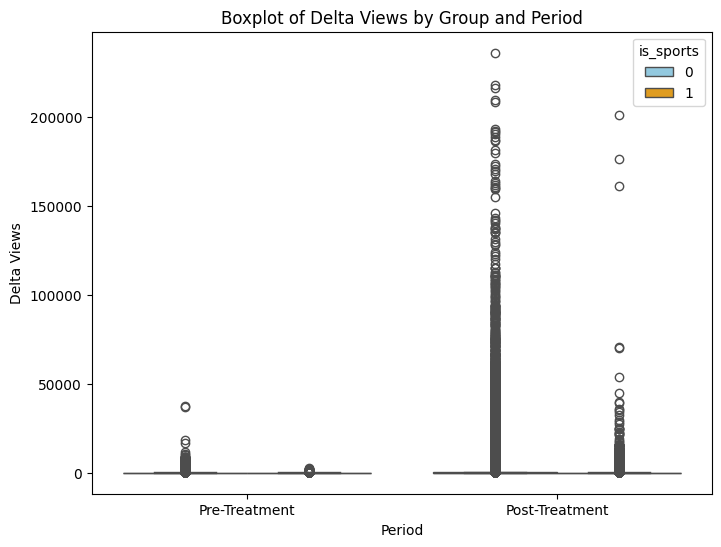

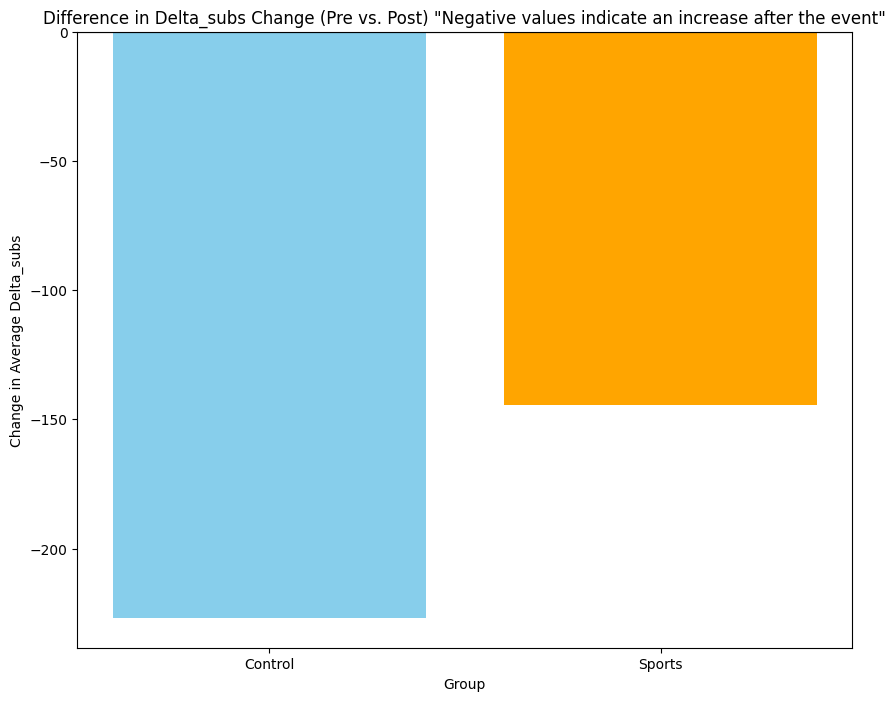

                            OLS Regression Results                            
Dep. Variable:             delta_subs   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                  0.003
Method:                 Least Squares   F-statistic:                     1451.
Date:                Thu, 14 Nov 2024   Prob (F-statistic):               0.00
Time:                        22:09:38   Log-Likelihood:            -1.2015e+07
No. Observations:             1343698   AIC:                         2.403e+07
Df Residuals:                 1343694   BIC:                         2.403e+07
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
Intercept       

In [483]:
diff_in_diff_model = diff_in_diff(
    df, 'datetime', 'delta_views', pd.to_datetime('2016-08'), 'Rio_de_jainero_olympics_2016', 3) # starts in august

diff_in_diff_model = diff_in_diff(
    df, 'datetime', 'delta_videos', pd.to_datetime('2016-08'), 'Rio_de_jainero_olympics_2016', 3)

diff_in_diff_model = diff_in_diff(
    df, 'datetime', 'delta_subs', pd.to_datetime('2016-08'), 'Rio_de_jainero_olympics_2016', 3)

### PyeongChang winter olympics 2018

Missing values
 delta_views                  0
is_sports                    0
Pyeongchang_olympics_2018    0
interaction                  0
dtype: int64


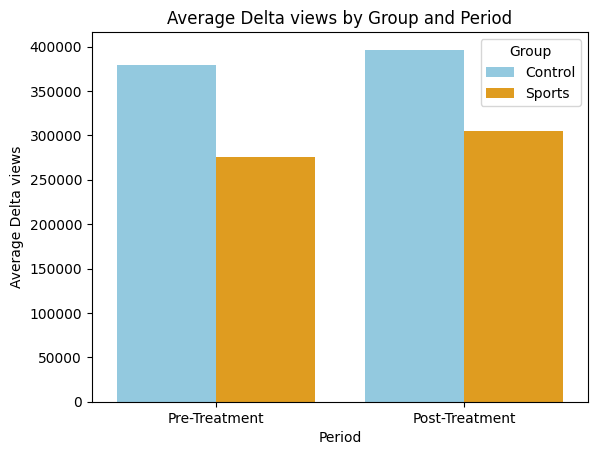

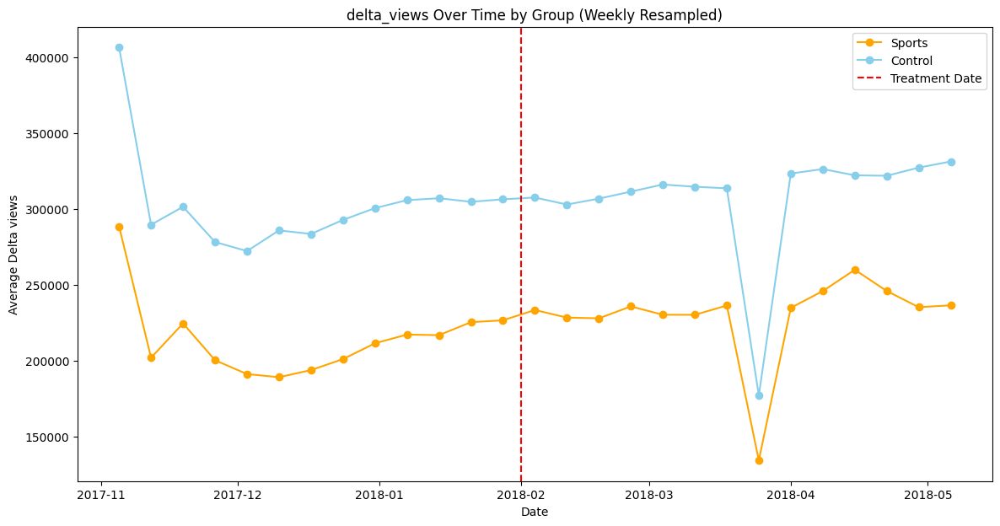

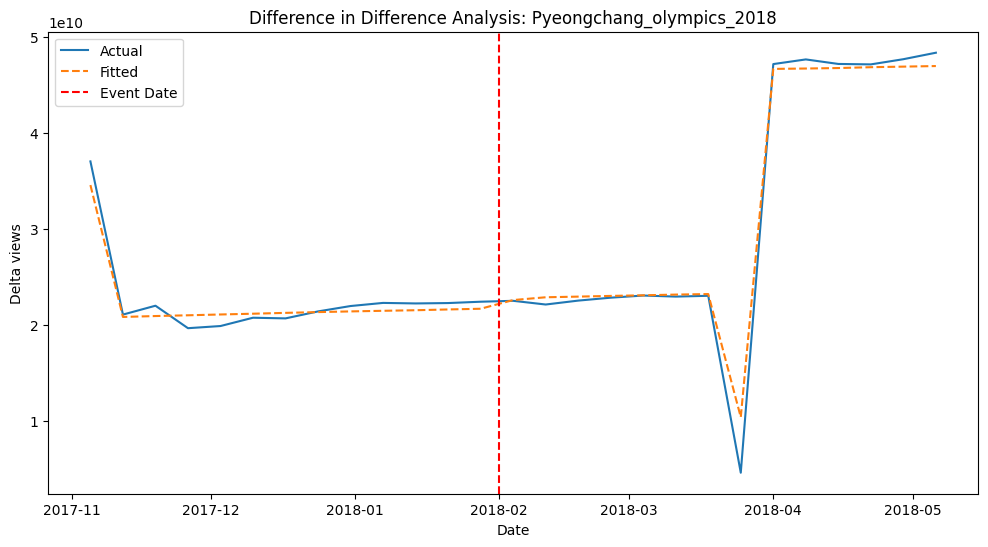

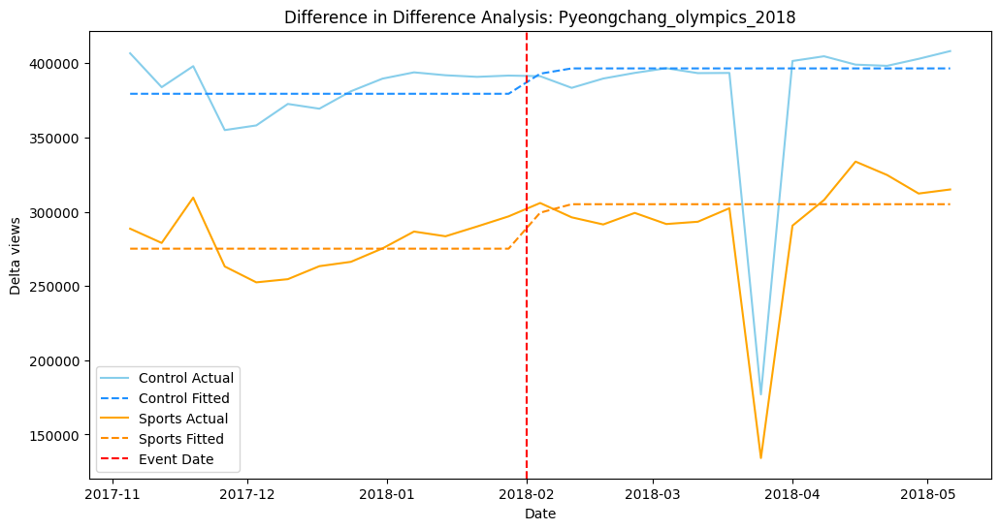

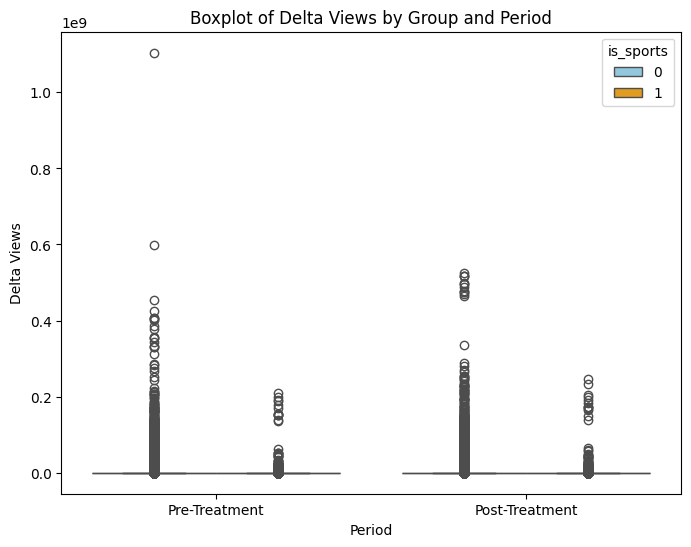

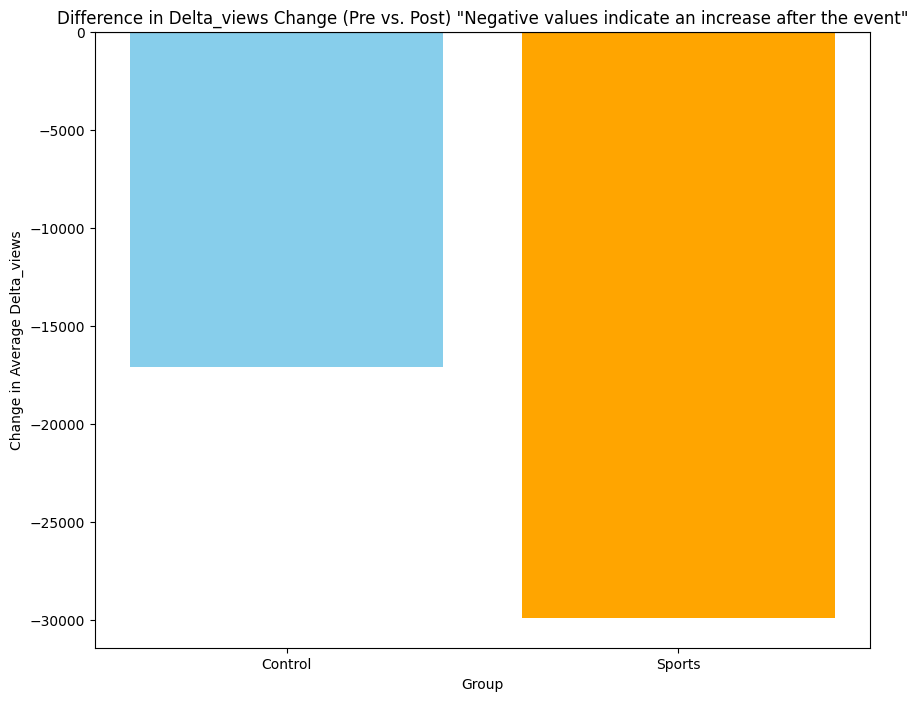

                            OLS Regression Results                            
Dep. Variable:            delta_views   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     46.62
Date:                Thu, 14 Nov 2024   Prob (F-statistic):           4.05e-30
Time:                        22:09:46   Log-Likelihood:            -4.9365e+07
No. Observations:             3016120   AIC:                         9.873e+07
Df Residuals:                 3016116   BIC:                         9.873e+07
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Intercept             

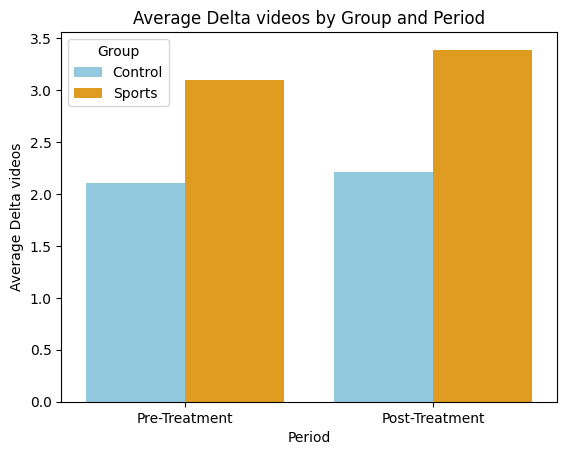

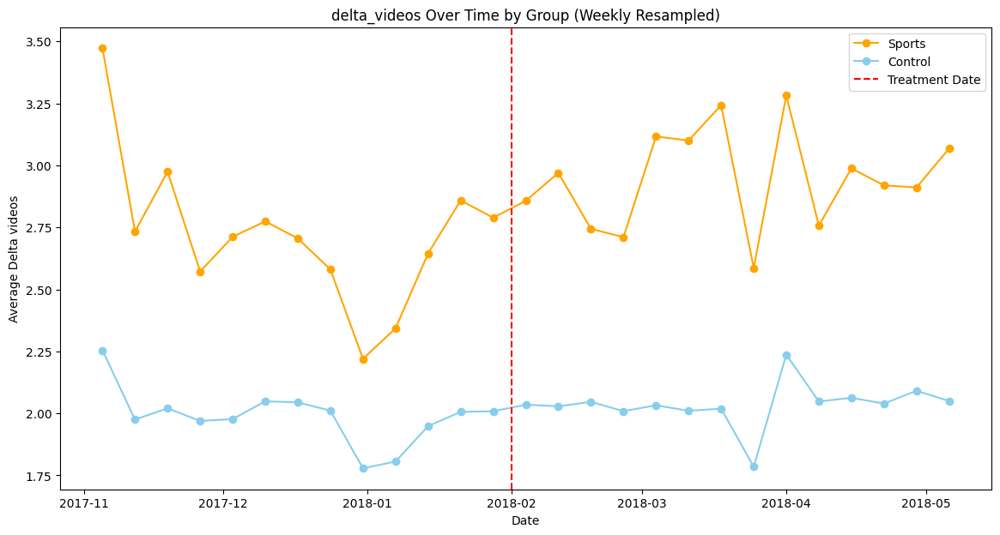

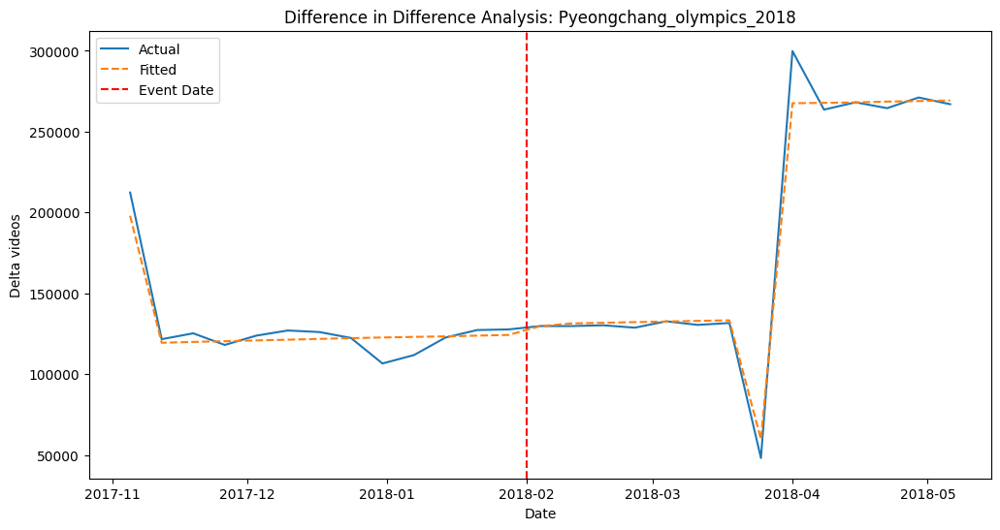

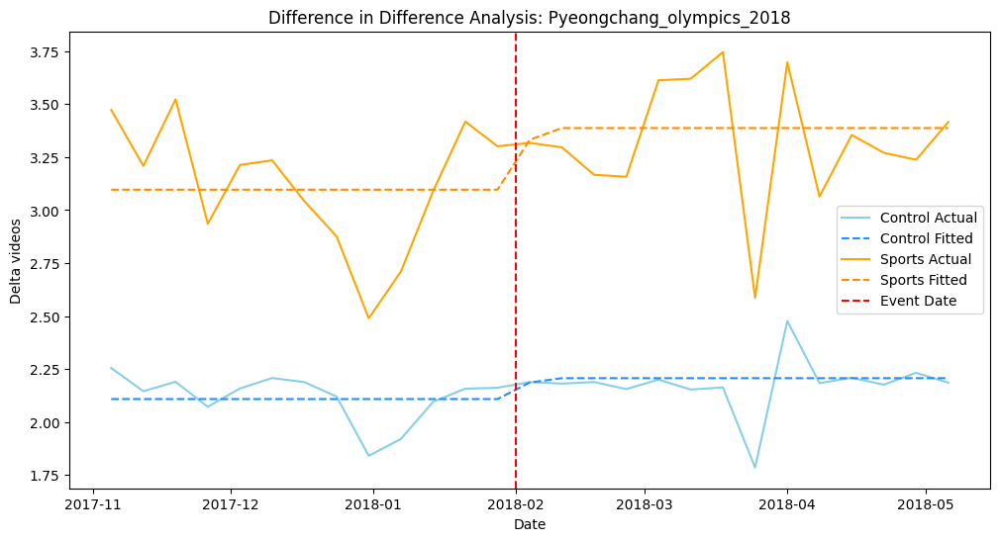

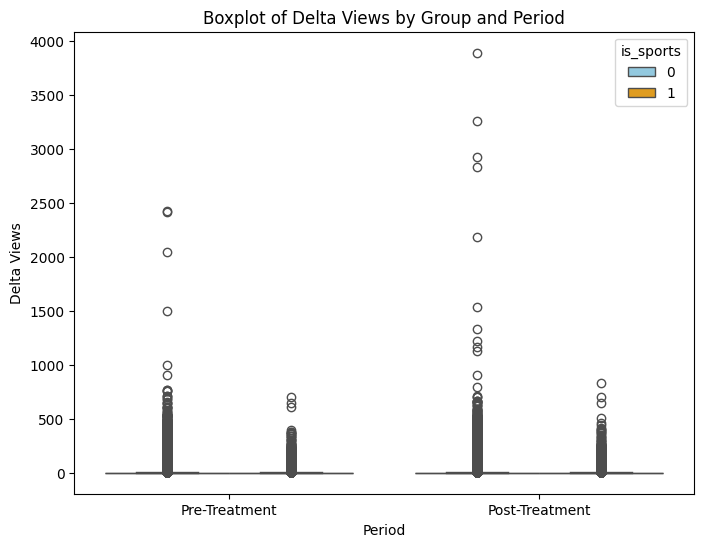

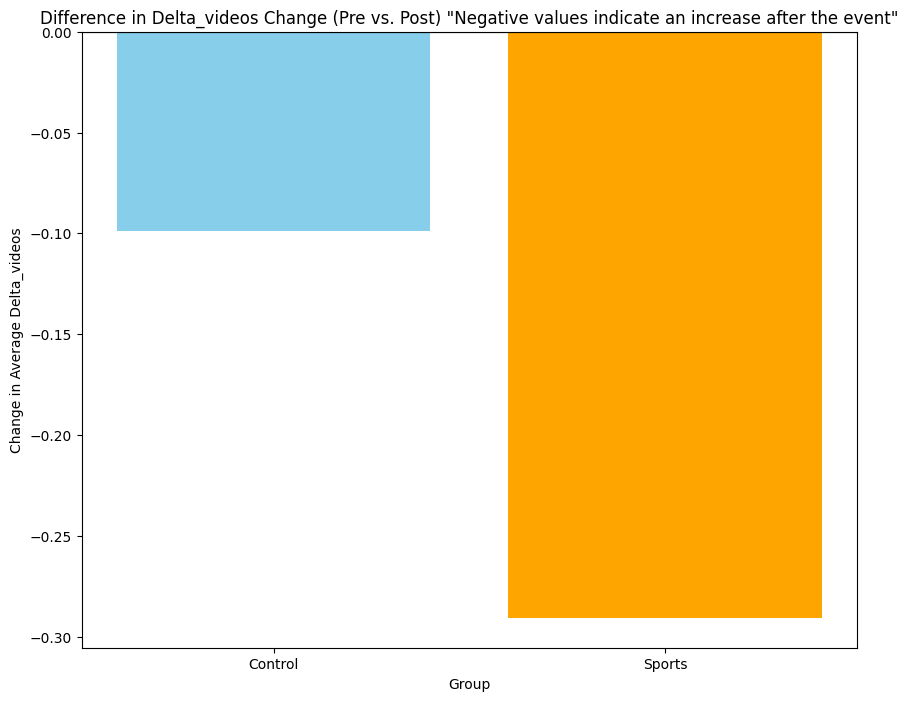

                            OLS Regression Results                            
Dep. Variable:           delta_videos   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     393.5
Date:                Thu, 14 Nov 2024   Prob (F-statistic):          1.35e-255
Time:                        22:09:54   Log-Likelihood:            -1.1545e+07
No. Observations:             3016120   AIC:                         2.309e+07
Df Residuals:                 3016116   BIC:                         2.309e+07
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Intercept             

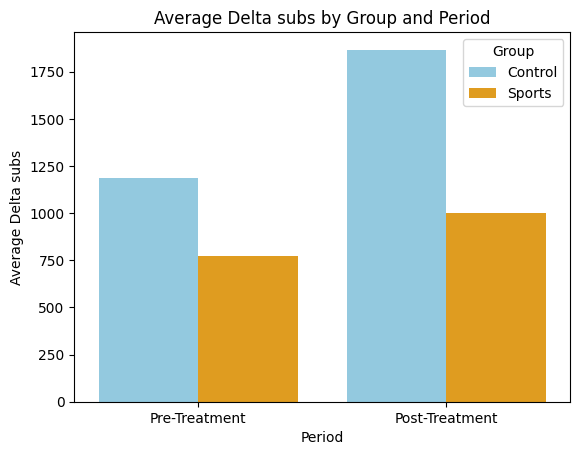

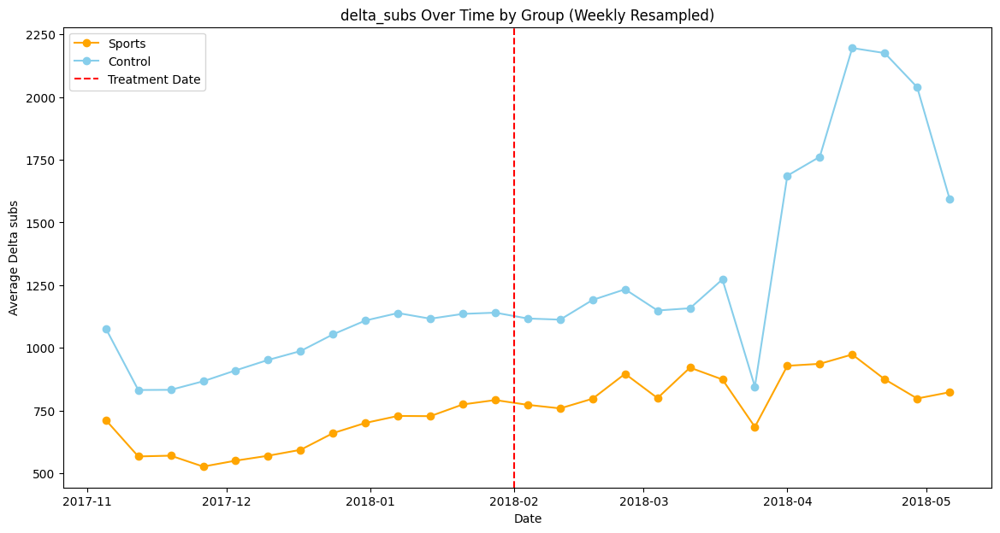

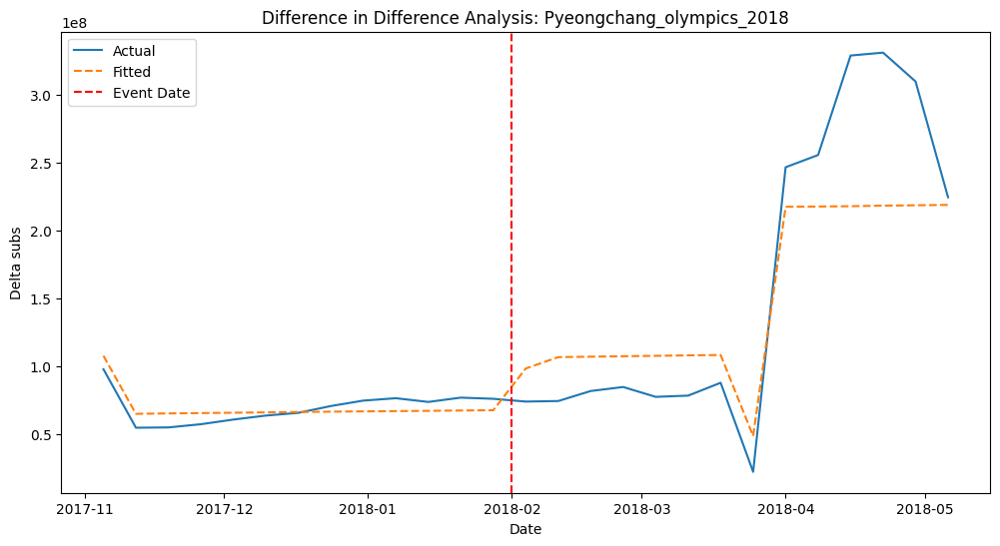

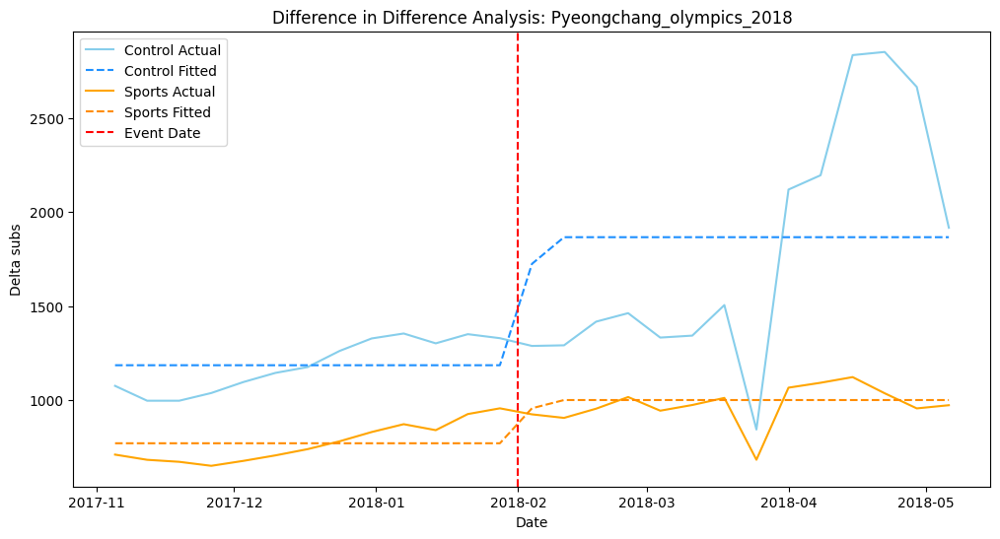

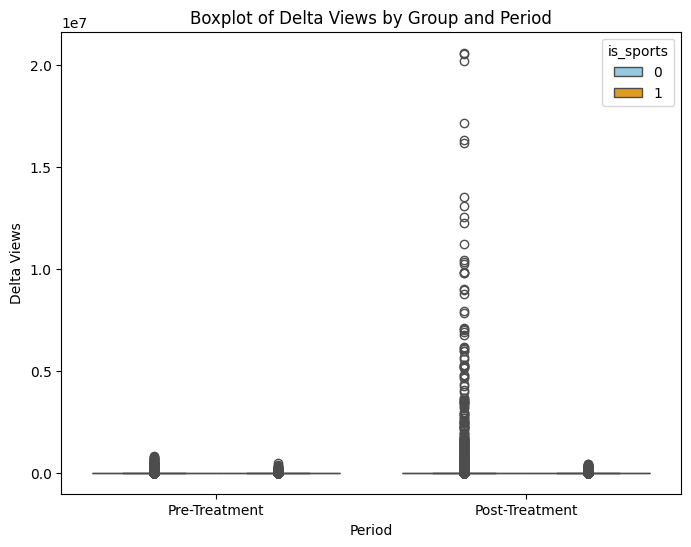

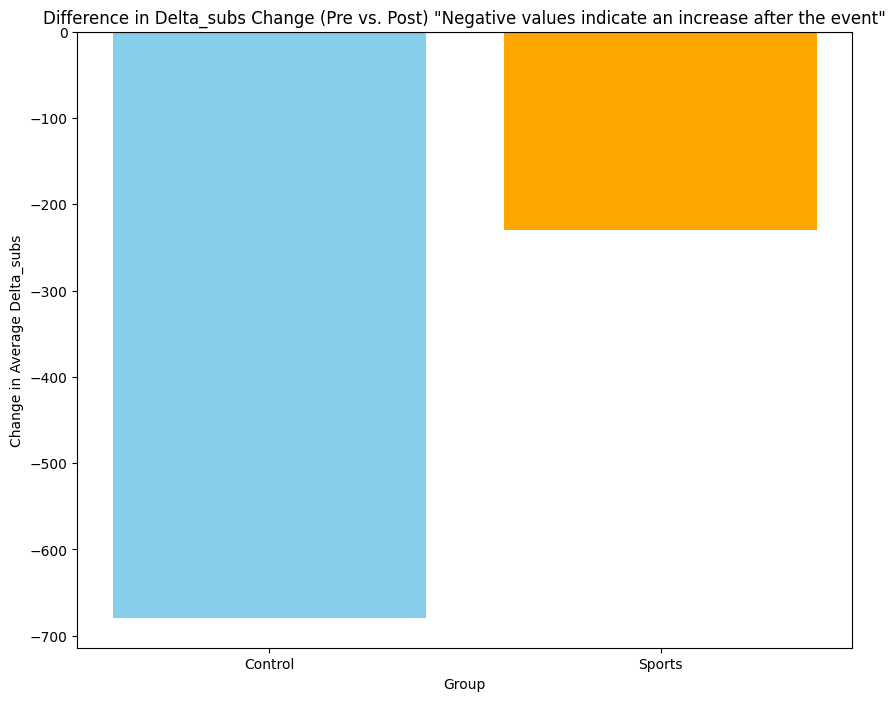

                            OLS Regression Results                            
Dep. Variable:             delta_subs   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     72.83
Date:                Thu, 14 Nov 2024   Prob (F-statistic):           4.30e-47
Time:                        22:10:02   Log-Likelihood:            -3.6383e+07
No. Observations:             3016120   AIC:                         7.277e+07
Df Residuals:                 3016116   BIC:                         7.277e+07
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Intercept             

In [484]:
diff_in_diff_model = diff_in_diff(
    df, 'datetime', 'delta_views', pd.to_datetime('2018-02'), 'Pyeongchang_olympics_2018', 3)

diff_in_diff_model = diff_in_diff(
    df, 'datetime', 'delta_videos', pd.to_datetime('2018-02'), 'Pyeongchang_olympics_2018', 3)

diff_in_diff_model = diff_in_diff(
    df, 'datetime', 'delta_subs', pd.to_datetime('2018-02'), 'Pyeongchang_olympics_2018', 3)

## NFL

### 2017 Superbowl

Missing values
 delta_views       0
is_sports         0
Superbowl_2017    0
interaction       0
dtype: int64


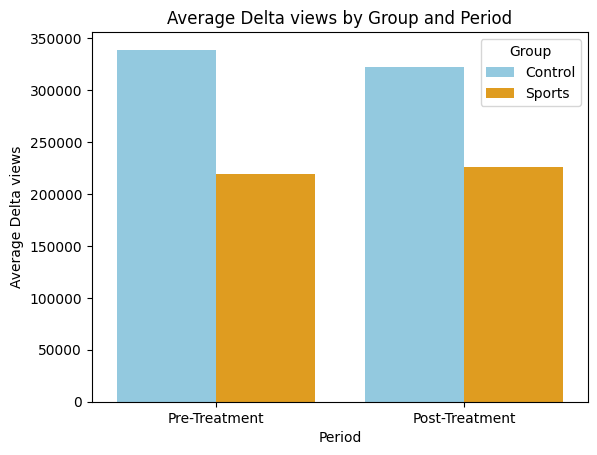

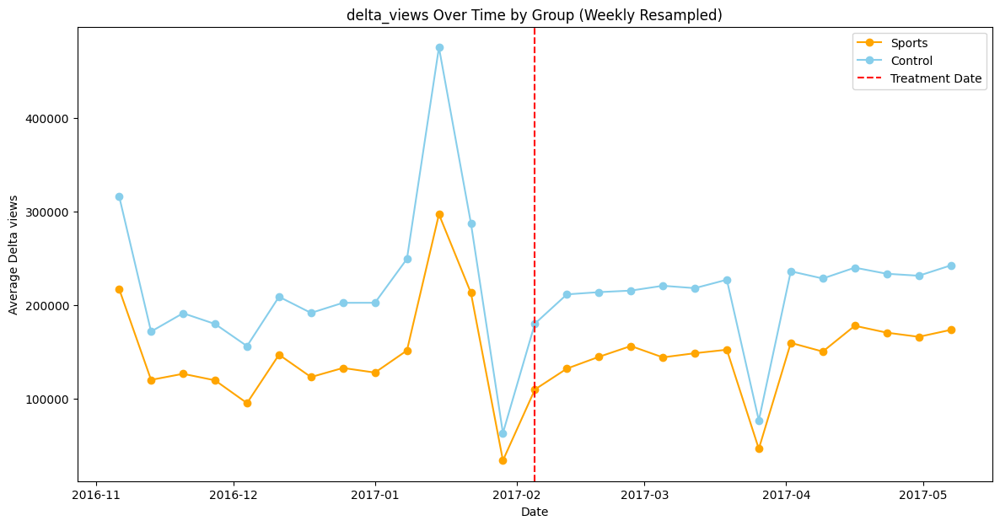

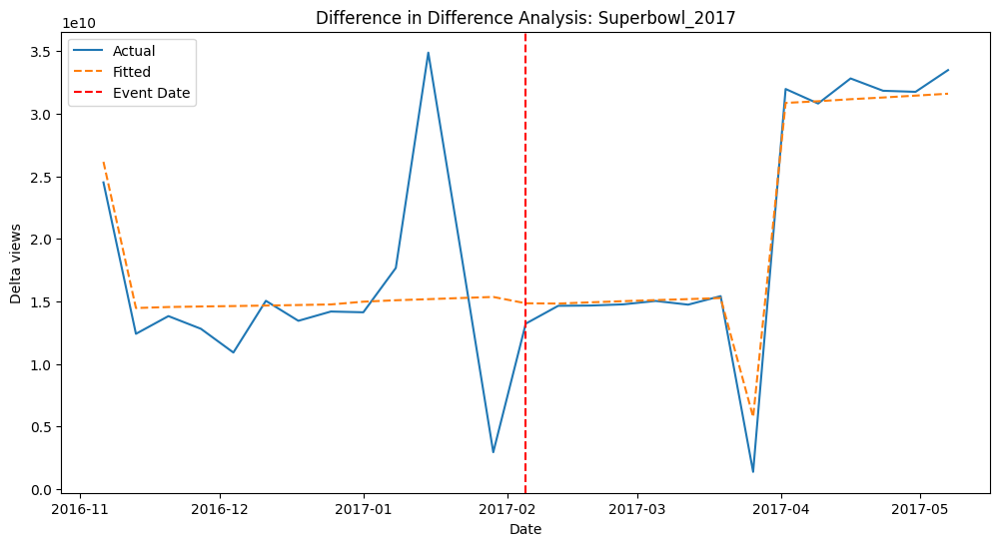

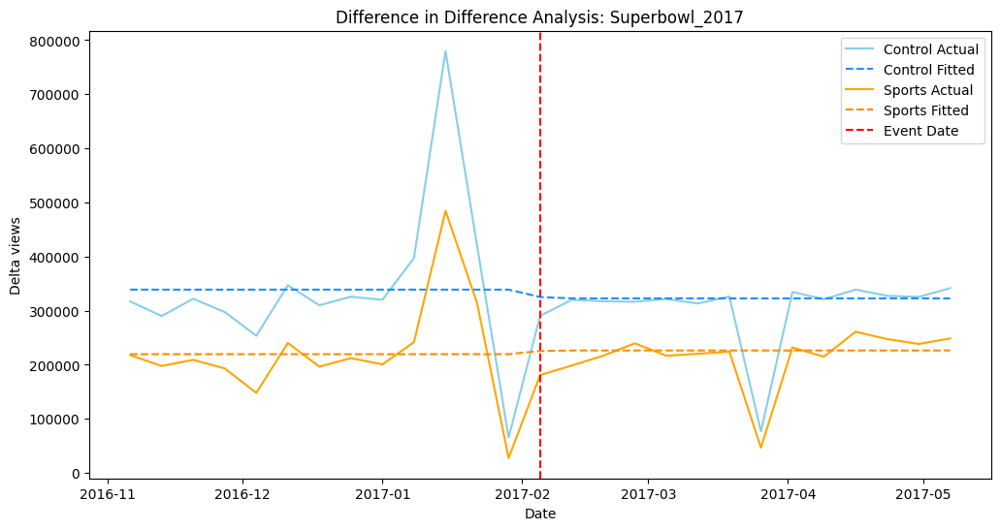

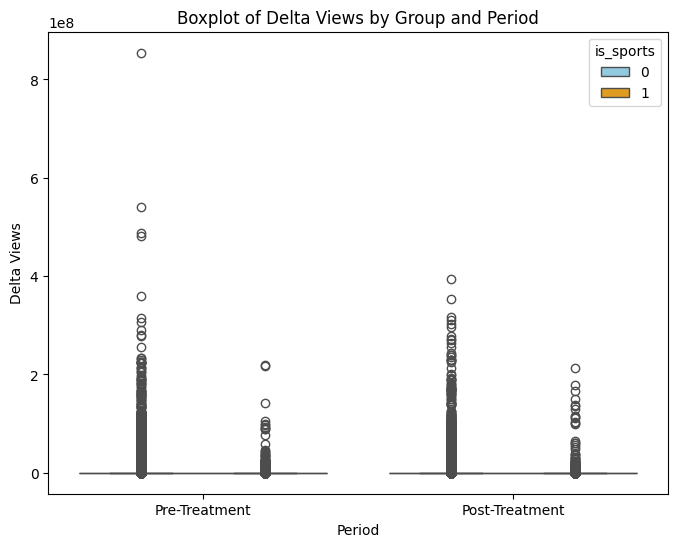

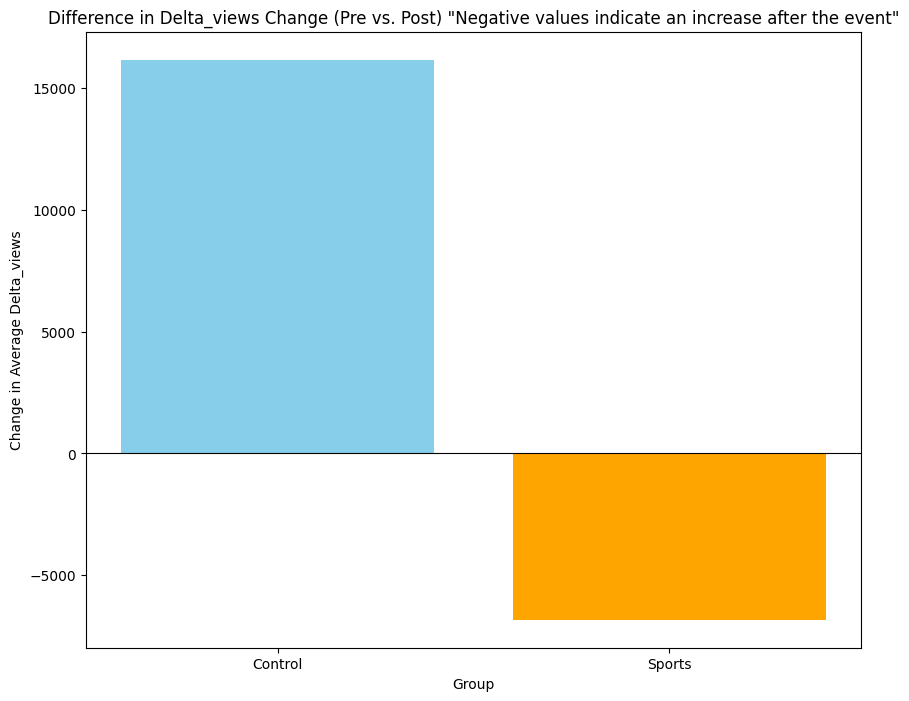

                            OLS Regression Results                            
Dep. Variable:            delta_views   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     56.16
Date:                Thu, 14 Nov 2024   Prob (F-statistic):           2.70e-36
Time:                        22:10:09   Log-Likelihood:            -3.9202e+07
No. Observations:             2412005   AIC:                         7.840e+07
Df Residuals:                 2412001   BIC:                         7.840e+07
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept       3.388e+05   2627.130    128.

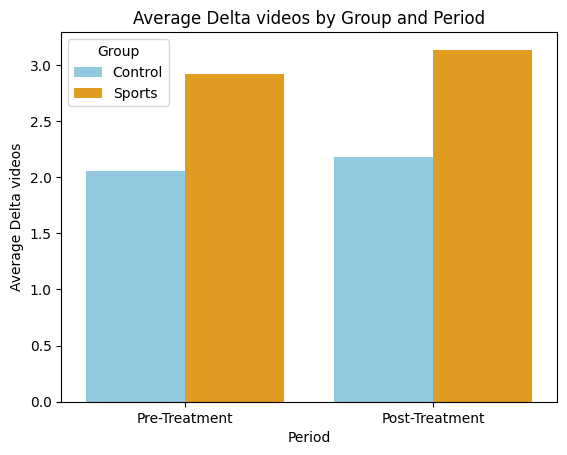

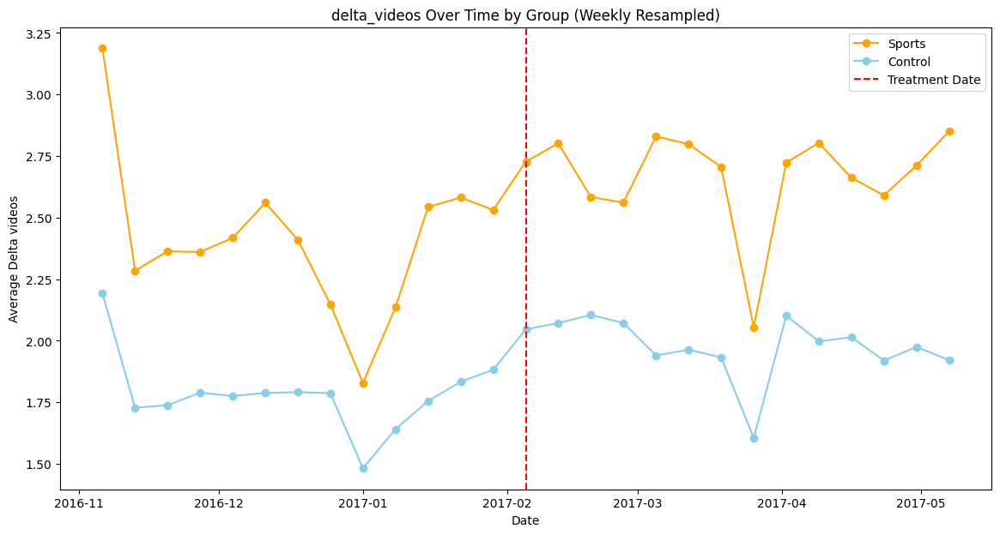

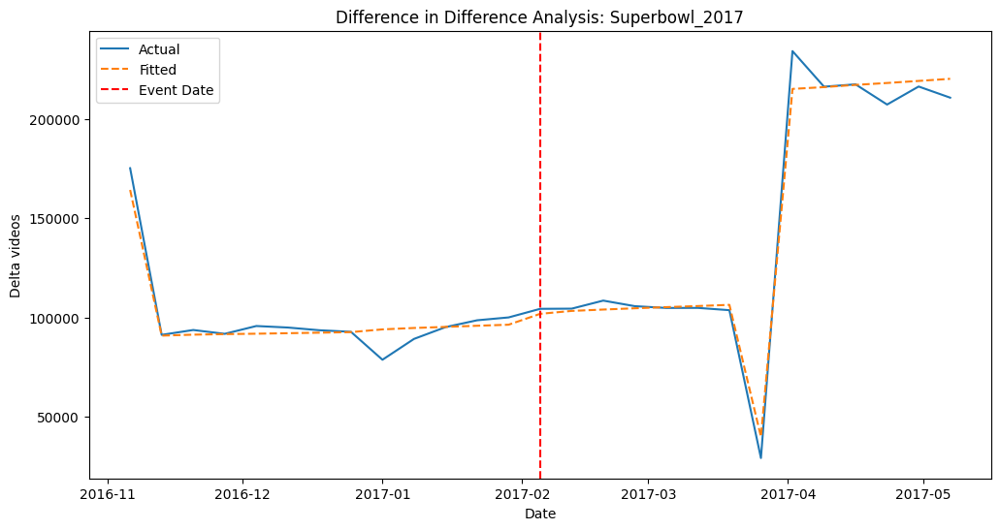

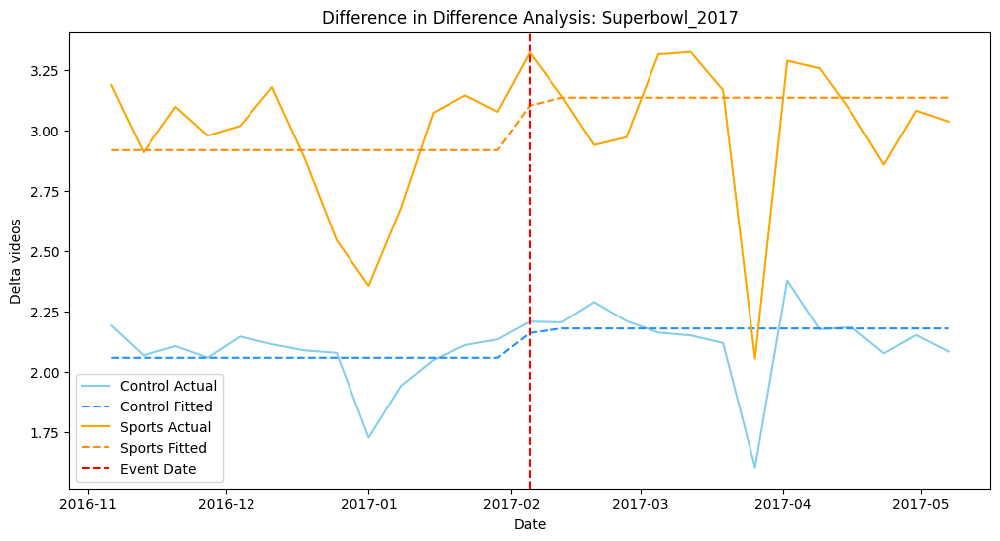

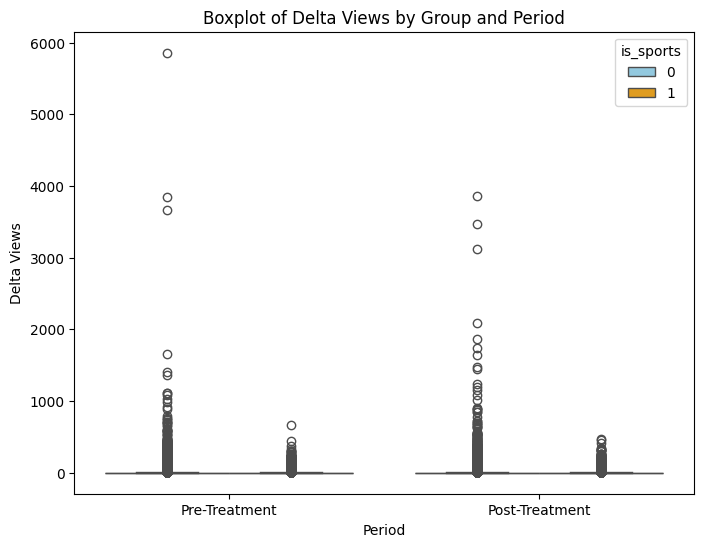

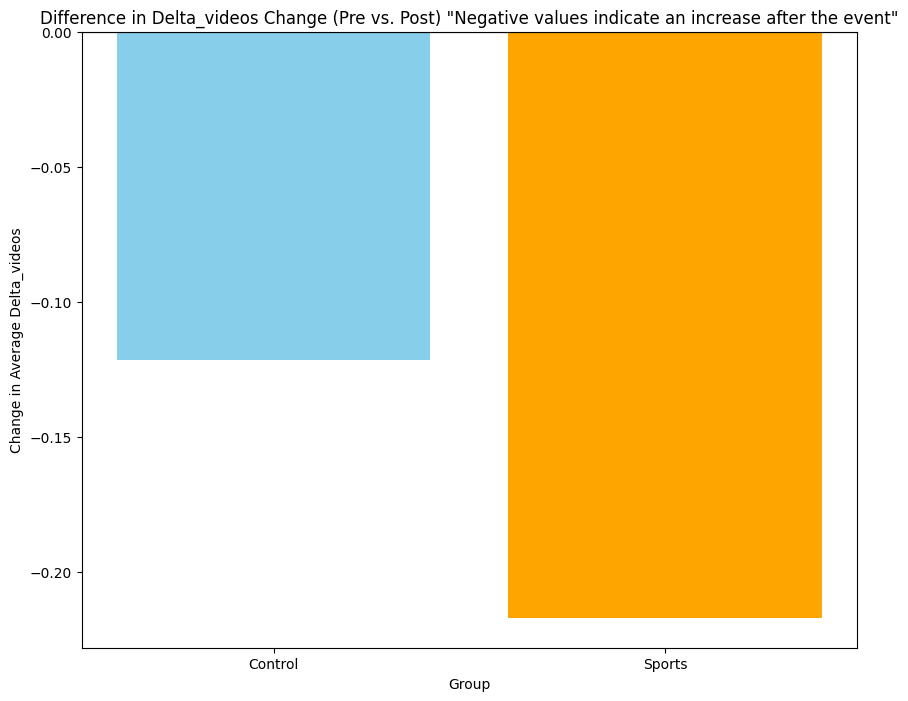

                            OLS Regression Results                            
Dep. Variable:           delta_videos   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     217.1
Date:                Thu, 14 Nov 2024   Prob (F-statistic):          8.23e-141
Time:                        22:10:16   Log-Likelihood:            -9.3820e+06
No. Observations:             2412005   AIC:                         1.876e+07
Df Residuals:                 2412001   BIC:                         1.876e+07
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept          2.0592      0.011    183.

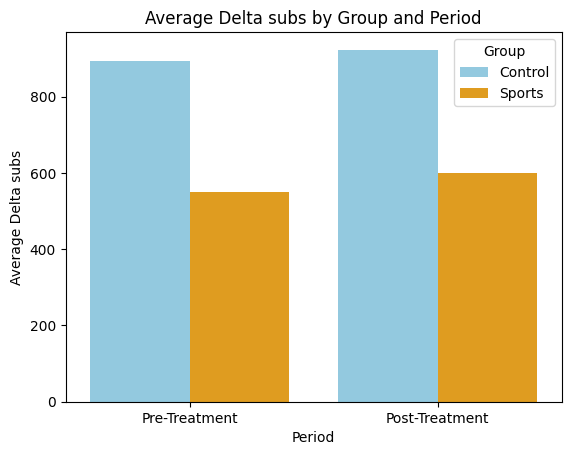

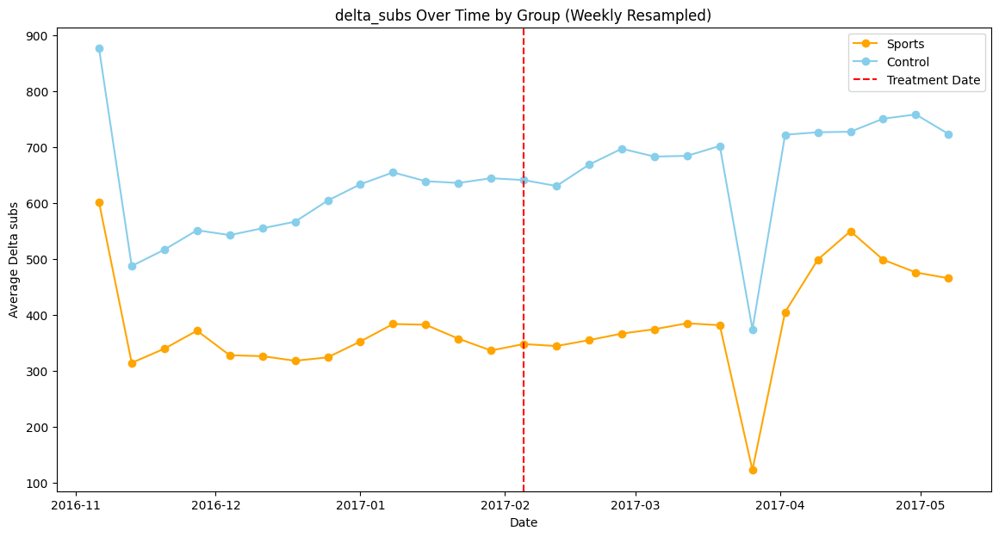

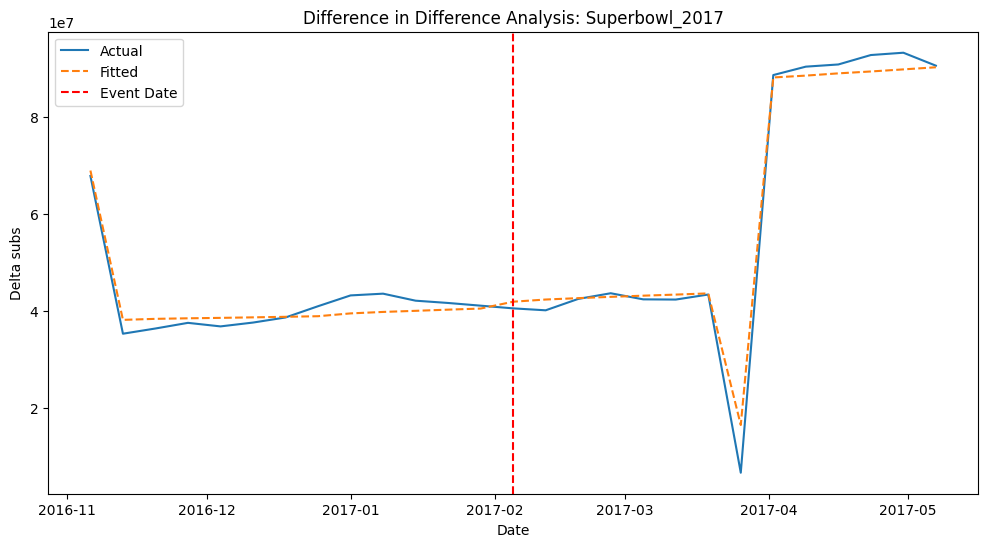

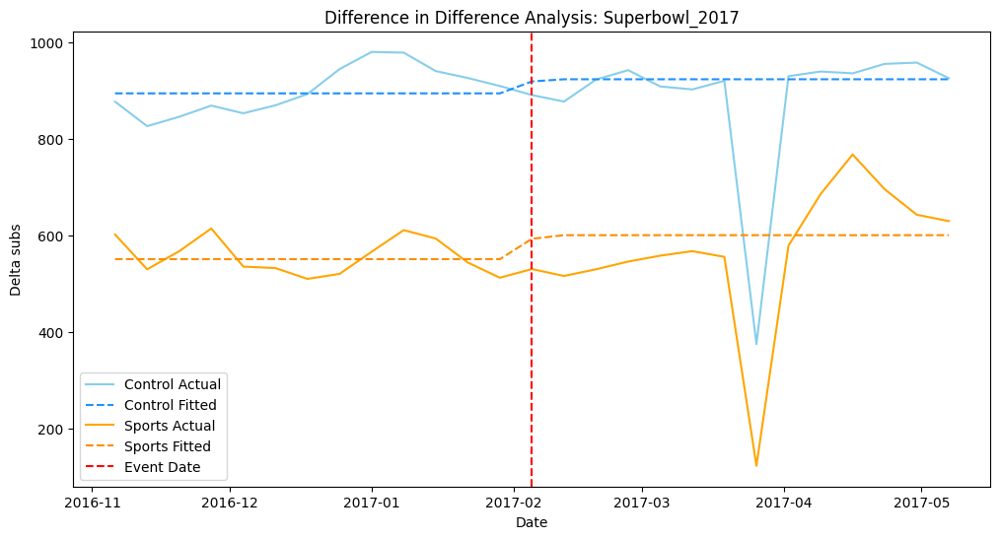

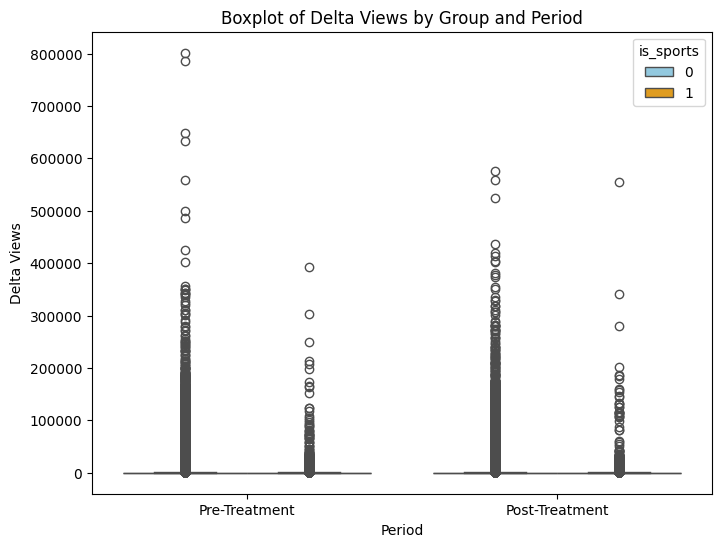

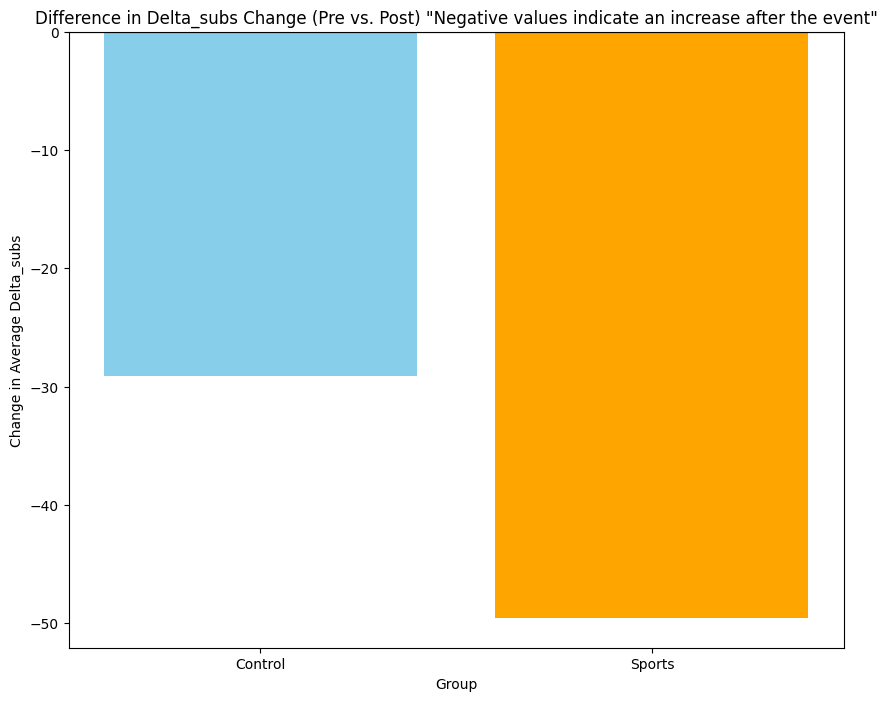

                            OLS Regression Results                            
Dep. Variable:             delta_subs   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     152.9
Date:                Thu, 14 Nov 2024   Prob (F-statistic):           4.43e-99
Time:                        22:10:23   Log-Likelihood:            -2.3968e+07
No. Observations:             2412005   AIC:                         4.794e+07
Df Residuals:                 2412001   BIC:                         4.794e+07
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept        893.4992      4.748    188.

In [485]:
diff_in_diff_model = diff_in_diff(
    df, 'datetime', 'delta_views', pd.to_datetime('2017-02-05'), 'Superbowl_2017', 3)

diff_in_diff_model = diff_in_diff(
    df, 'datetime', 'delta_videos', pd.to_datetime('2017-02-05'), 'Superbowl_2017', 3)

diff_in_diff_model = diff_in_diff(
    df, 'datetime', 'delta_subs', pd.to_datetime('2017-02-05'), 'Superbowl_2017', 3)

## NBA

# Ideas

- Try to see a correlation based on sports, to see if one sports gets views based on the event of another sport (Without the timeseries dataset it could be done with the amount of videos that are uploaded on that day)
- Do an analysis based on channel engagement (views, videos, subs) for the top in total in a specific time period (e.g 2017-01, 2017-05, 2017-10, 2018-04, 2018-07, 2018-10, 2019-04)

# Extra

In [477]:
def dif_in_dif(df_timeseries, treatment_date):    
    # Create a binary treatment indicator
    df_timeseries['is_sports'] = np.where(df_timeseries['category'] == 'Sports', 1, 0)

    # Define treatment date (modify as per your specific analysis)
    treatment_date = pd.to_datetime(treatment_date)

    # Create a binary time indicator
    df_timeseries['post_treatment'] = np.where(df_timeseries['datetime'] >= treatment_date, 1, 0)

    # Create interaction term
    df_timeseries['interaction'] = df_timeseries['is_sports'] * df_timeseries['post_treatment']

    # Check for missing values in key variables
    print(df_timeseries[['delta_views', 'is_sports', 'post_treatment', 'interaction']].isnull().sum())

    # Drop rows with missing values in these columns
    df_timeseries = df_timeseries.dropna(subset=['delta_views', 'is_sports', 'post_treatment', 'interaction'])

    # Perform DiD regression
    model = smf.ols('delta_views ~ is_sports + post_treatment + interaction', data=df_timeseries).fit()

    # Print regression summary
    print(model.summary())

    # Create summary for visualization
    summary = df_timeseries.groupby(['post_treatment', 'is_sports'])['delta_views'].mean().reset_index()
    summary['Group'] = summary['is_sports'].apply(lambda x: 'Sports' if x == 1 else 'Control')
    summary['Period'] = summary['post_treatment'].apply(lambda x: 'Post-Treatment' if x == 1 else 'Pre-Treatment')

    # Bar Plot
    plt.figure(figsize=(8,6))
    sns.barplot(x='Period', y='delta_views', hue='Group', data=summary)
    plt.title('Average Delta Views by Group and Period')
    plt.ylabel('Average Delta Views')
    plt.show()

    # Time Series Plot
    time_summary = df_timeseries.groupby(['datetime', 'is_sports'])['delta_views'].mean().reset_index()

    time_summary['Group'] = time_summary['is_sports'].apply(lambda x: 'Sports' if x == 1 else 'Control')

    # Plot
    plt.figure(figsize=(14,7))
    sns.lineplot(x='datetime', y='delta_views', hue='Group', data=time_summary, marker='o')
    plt.axvline(x=treatment_date, color='red', linestyle='--', label='Treatment Date')
    plt.title('Delta Views Over Time by Group')
    plt.xlabel('Date')
    plt.ylabel('Average Delta Views')
    plt.legend()
    plt.show()

delta_views       0
is_sports         0
post_treatment    0
interaction       0
dtype: int64
                            OLS Regression Results                            
Dep. Variable:            delta_views   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     2748.
Date:                Thu, 14 Nov 2024   Prob (F-statistic):               0.00
Time:                        20:32:58   Log-Likelihood:            -3.1396e+08
No. Observations:            18872499   AIC:                         6.279e+08
Df Residuals:                18872495   BIC:                         6.279e+08
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------

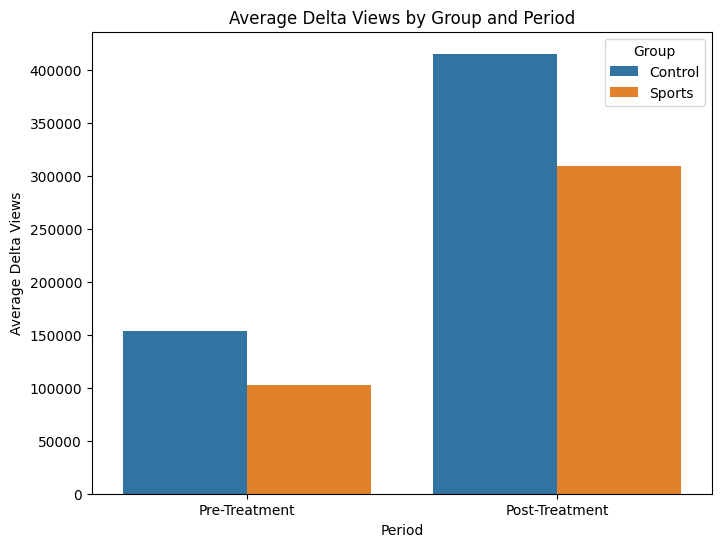

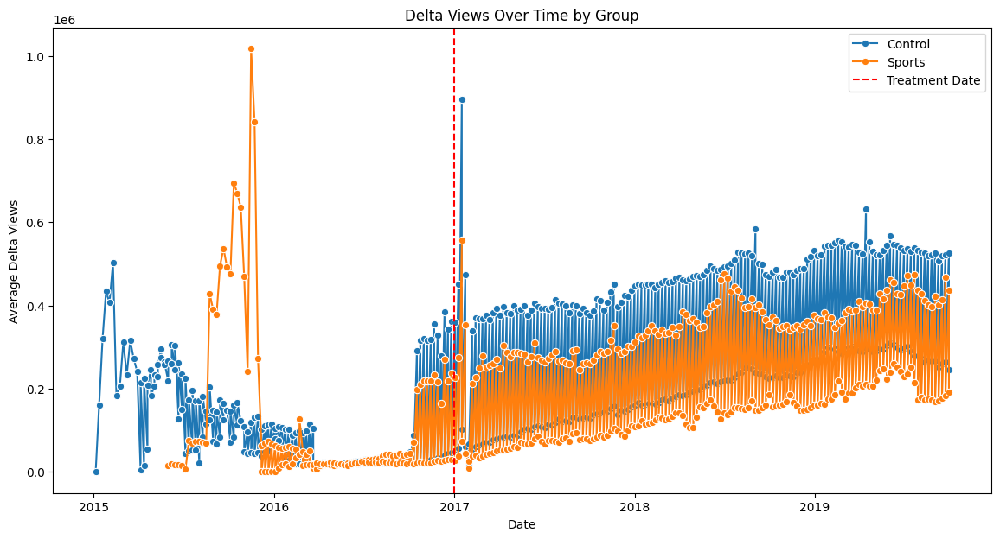

In [478]:
dif_in_dif(df, '2017-01-01')